Installations

In [ ]:
!pip install powerlaw
!pip install python-igraph
!pip install numpy==1.23.5 # in the new version of numpy, there is a problem with np.array

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 40.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 85.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.23.5 which is incompatible.


**Graph U-Nets Integration**
<br>
We integrate into preproc_data method the gpool operation. We will not use the coarse graph of misc-gan that generated in parse_data (R, P, W and c values). We used gpool operation instead.

In the second approach, in the generate_network, misc-gan performs Multi-Resolution Reconstruction and sigma operations. After that, we will apply the gunpool on the generated network.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class GNet(nn.Module):
    def __init__(self, in_dim, n_classes, args):
        super(GNet, self).__init__()
        self.n_act = getattr(nn, args.act_n)()
        self.c_act = getattr(nn, args.act_c)()
        self.s_gcn = GCN(in_dim, args.l_dim, self.n_act, args.drop_n)
        self.g_unet = GraphUnet(
            args.ks, args.l_dim, args.l_dim, args.l_dim, self.n_act,
            args.drop_n)
        self.out_l_1 = nn.Linear(3*args.l_dim*(args.l_num+1), args.h_dim)
        self.out_l_2 = nn.Linear(args.h_dim, n_classes)
        self.out_drop = nn.Dropout(p=args.drop_c)
        Initializer.weights_init(self)

    def forward(self, gs, hs, labels):
        hs = self.embed(gs, hs)
        logits = self.classify(hs)
        return self.metric(logits, labels)

    def embed(self, gs, hs):
        o_hs = []
        for g, h in zip(gs, hs):
            h = self.embed_one(g, h)
            o_hs.append(h)
        hs = torch.stack(o_hs, 0)
        return hs

    def embed_one(self, g, h):
        g = norm_g(g)
        h = self.s_gcn(g, h)
        hs = self.g_unet(g, h)
        h = self.readout(hs)
        return h

    def readout(self, hs):
        h_max = [torch.max(h, 0)[0] for h in hs]
        h_sum = [torch.sum(h, 0) for h in hs]
        h_mean = [torch.mean(h, 0) for h in hs]
        h = torch.cat(h_max + h_sum + h_mean)
        return h

    def classify(self, h):
        h = self.out_drop(h)
        h = self.out_l_1(h)
        h = self.c_act(h)
        h = self.out_drop(h)
        h = self.out_l_2(h)
        return F.log_softmax(h, dim=1)

    def metric(self, logits, labels):
        loss = F.nll_loss(logits, labels)
        _, preds = torch.max(logits, 1)
        acc = torch.mean((preds == labels).float())
        return loss, acc


In [ ]:
class GraphUnet(nn.Module):

    def __init__(self, ks, in_dim, out_dim, dim, act, drop_p):
        super(GraphUnet, self).__init__()
        self.ks = ks
        self.bottom_gcn = GCN(dim, dim, act, drop_p)
        self.down_gcns = nn.ModuleList()
        self.up_gcns = nn.ModuleList()
        self.pools = nn.ModuleList()
        self.unpools = nn.ModuleList()
        self.l_n = len(ks)
        for i in range(self.l_n):
            self.down_gcns.append(GCN(dim, dim, act, drop_p))
            self.up_gcns.append(GCN(dim, dim, act, drop_p))
            self.pools.append(Pool(ks[i], dim, drop_p))
            self.unpools.append(Unpool(dim, dim, drop_p))

    def forward(self, g, h):
        adj_ms = []
        indices_list = []
        down_outs = []
        hs = []
        org_h = h
        for i in range(self.l_n):
            h = self.down_gcns[i](g, h)
            adj_ms.append(g)
            down_outs.append(h)
            g, h, idx = self.pools[i](g, h)
            indices_list.append(idx)
        h = self.bottom_gcn(g, h)
        for i in range(self.l_n):
            up_idx = self.l_n - i - 1
            g, idx = adj_ms[up_idx], indices_list[up_idx]
            g, h = self.unpools[i](g, h, down_outs[up_idx], idx)
            h = self.up_gcns[i](g, h)
            h = h.add(down_outs[up_idx])
            hs.append(h)
        h = h.add(org_h)
        hs.append(h)
        return hs


class GCN(nn.Module):

    def __init__(self, in_dim, out_dim, act, p):
        super(GCN, self).__init__()
        self.proj = nn.Linear(in_dim, out_dim)
        self.act = act
        self.drop = nn.Dropout(p=p) if p > 0.0 else nn.Identity()

    def forward(self, g, h):
        h = self.drop(h)
        h = torch.matmul(g, h)
        h = self.proj(h)
        h = self.act(h)
        return h

class Pool(nn.Module):

    def __init__(self, k, in_dim, p):
        super(Pool, self).__init__()
        self.k = k
        self.sigmoid = nn.Sigmoid()
        self.proj = nn.Linear(in_dim, 1)
        self.drop = nn.Dropout(p=p) if p > 0 else nn.Identity()

    def forward(self, g, h):
        Z = self.drop(h)
        weights = self.proj(Z).squeeze()
        scores = self.sigmoid(weights)
        return top_k_graph(scores, g, h, self.k)


class Unpool(nn.Module):
    def __init__(self, *args):
        super(Unpool, self).__init__()

    def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        # Subset h to match the size of idx
        h_subset = h[:len(idx)]
        # Debug: Print shapes before assignment
        print(f"Shape of new_h before assignment: {new_h.shape}")
        print(f"Shape of h_subset: {h_subset.shape}")
        print(f"Shape of idx: {idx.shape}")
        new_h[idx] = h_subset
        return g, new_h
    '''ddef forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        new_h[idx] = h
        return g, new_h'''


def top_k_graph(scores, g, h, k):
    num_nodes = g.shape[0]
    values, idx = torch.topk(scores, max(2, int(k*num_nodes)))
    new_h = h[idx, :]
    values = torch.unsqueeze(values, -1)
    new_h = torch.mul(new_h, values)
    un_g = g.bool().float()
    un_g = torch.matmul(un_g, un_g).bool().float()
    un_g = un_g[idx, :]
    un_g = un_g[:, idx]
    g = norm_g(un_g)
    return g, new_h, idx


def norm_g(g):
    degrees = torch.sum(g, 1)
    g = g / degrees
    return g

In [ ]:
class Initializer(object):

    @classmethod
    def _glorot_uniform(cls, w):
        if len(w.size()) == 2:
            fan_in, fan_out = w.size()
        elif len(w.size()) == 3:
            fan_in = w.size()[1] * w.size()[2]
            fan_out = w.size()[0] * w.size()[2]
        else:
            fan_in = np.prod(w.size())
            fan_out = np.prod(w.size())
        limit = np.sqrt(6.0 / (fan_in + fan_out))
        w.uniform_(-limit, limit)

    @classmethod
    def _param_init(cls, m):
        if isinstance(m, nn.parameter.Parameter):
            cls._glorot_uniform(m.data)
        elif isinstance(m, nn.Linear):
            m.bias.data.zero_()
            cls._glorot_uniform(m.weight.data)

    @classmethod
    def weights_init(cls, m):
        for p in m.modules():
            if isinstance(p, nn.ParameterList):
                for pp in p:
                    cls._param_init(pp)
            else:
                cls._param_init(p)

        for name, p in m.named_parameters():
            if '.' not in name:
                cls._param_init(p)

First analysis results: COLLAB dataset what were trained on graph u-nets using

In [ ]:
class GNetArgs:
    seed = 1
    data = 'COLLAB'
    fold = 1
    num_epochs = 300  # Increased epochs for better training
    batch = 32  # Smaller batch size due to potentially larger graphs
    lr = 0.001
    deg_as_tag = 0
    l_num = 3
    h_dim = 128  # Increased hidden dimension for complex graphs
    l_dim = 64
    drop_n = 0.3  # Adjusted dropout for node features
    drop_c = 0.3  # Adjusted dropout for convolutional layers
    act_n = 'ReLU'
    act_c = 'ReLU'
    ks = [0.8, 0.6, 0.4]  # Adjusted k-values for graph pooling
    acc_file = 're'
    save_model = '/content/drive/MyDrive/TrainedGraphU-Nets/collab_graph_unet_model.pth'
    in_dim = 1

gnet_args = GNetArgs()
net = GNet(in_dim=gnet_args.in_dim, n_classes=2, args=gnet_args)

def load_model_parameters(model, model_path):
    pretrained_dict = torch.load(model_path)
    model_dict = model.state_dict()
    pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and model_dict[k].size() == v.size()}
    model_dict.update(pretrained_dict)
    model.load_state_dict(model_dict)

model_path = gnet_args.save_model
load_model_parameters(net, model_path)
net.eval()

# for g-unets integration
global_params = {
    "down_outs_list": [],
    "indices_list_list": []
}

Imports

In [ ]:
import tensorflow as tf
import numpy as np
import pickle as pkl
import argparse
import networkx as nx
import scipy.sparse as sp
import scipy.io as sio
import sys
import os
from collections import namedtuple
import math
import time
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from scipy.sparse.csgraph import connected_components
from __future__ import division
from __future__ import print_function
import copy
import powerlaw
import collections
import igraph
import tf_slim as slim # import tensorflow.contrib.slim as slim also legacy and goolge colab removed it
from tensorflow.python.framework import ops

print(np.__version__)

1.23.5


In [ ]:
class Args:
  def __init__(self, version=-1):
    self.demo = False
    self.dataset_A = f'cora_{version}.mat' if version > -1 else 'cora.mat'  # path of the data set
    self.checkpoint = f'/content/Misc-Gan_Project/checkpoint_training_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/checkpoint_training_cora'  # path of the checkpoint
    self.filename = f'cora_output_network_{version}' if version > -1 else 'cora_output_network'  # the filename of output network
    self.output_dir = f'/content/Misc-Gan_Project/output_dir_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/output_dir_cora'  # results are saved here
    self.epoch = 250  # number of epoch
    self.layer = 5  # number of layers
    self.clusters = 2  # number of clusters (2 or 3)
    self.use_resnet = True  # generation network using reidule block
    self.use_lsgan = True  # gan loss defined in lsgan
    self.which_direction = 'BtoA'  # AtoB or BtoA
    self.which_stage = 'training'  # training stage or testing stage
    self.starting_layer = 1  # the starting layer
    self.shuffle = True  # Shuffle the graph
    self.gpu = True  # Use gpu to train the model or not
    self.kernel_number = 32  # Shuffle the graph
    self.iter = 5  # Iterations of residule_block function for generator to train graph

args = Args()

Gae Module

initializations.py

In [ ]:
def weight_variable_glorot(input_dim, output_dim, name=""):
    """Create a weight variable with Glorot & Bengio (AISTATS 2010)
    initialization.
    """
    init_range = np.sqrt(6.0 / (input_dim + output_dim))
    initial = tf.compat.v1.random_uniform([input_dim, output_dim], minval=-init_range,
                                maxval=init_range, dtype=tf.compat.v1.float32)
    return tf.compat.v1.Variable(initial, name=name)


input_data.py

In [ ]:
def parse_index_file(filename):
    index = []
    for line in open(filename):
        index.append(int(line.strip()))
    return index

In [ ]:
def load_data(dataset):
    # load the data: x, tx, allx, graph
    names = ['x', 'tx', 'allx', 'graph']
    objects = []
    for i in range(len(names)):
        objects.append(pkl.load(open("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.{}".format(dataset, names[i]))))
    x, tx, allx, graph = tuple(objects)
    test_idx_reorder = parse_index_file("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.test.index".format(dataset))
    test_idx_range = np.sort(test_idx_reorder)

    if dataset == 'citeseer':
        # Fix citeseer dataset (there are some isolated nodes in the graph)
        # Find isolated nodes, add them as zero-vecs into the right position
        test_idx_range_full = range(min(test_idx_reorder), max(test_idx_reorder)+1)
        tx_extended = sp.lil_matrix((len(test_idx_range_full), x.shape[1]))
        tx_extended[test_idx_range-min(test_idx_range), :] = tx
        tx = tx_extended

    features = sp.vstack((allx, tx)).tolil()
    features[test_idx_reorder, :] = features[test_idx_range, :]
    adj = nx.adjacency_matrix(nx.from_dict_of_lists(graph))
    return adj, features

In [ ]:
def load_network_data(filename):
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(filename))
    A = network_A['A']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    return A, R, edges

layers.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

# global unique layer ID dictionary for layer name assignment
_LAYER_UIDS = {}

In [ ]:
def get_layer_uid(layer_name=''):
    """Helper function, assigns unique layer IDs
    """
    if layer_name not in _LAYER_UIDS:
        _LAYER_UIDS[layer_name] = 1
        return 1
    else:
        _LAYER_UIDS[layer_name] += 1
        return _LAYER_UIDS[layer_name]

In [ ]:
def dropout_sparse(x, keep_prob, num_nonzero_elems):
    """Dropout for sparse tensors. Currently fails for very large sparse tensors (>1M elements)
    """
    noise_shape = [num_nonzero_elems]
    random_tensor = keep_prob
    random_tensor += tf.compat.v1.random_uniform(noise_shape)
    dropout_mask = tf.cast(tf.compat.v1.floor(random_tensor), dtype=tf.compat.v1.bool)
    pre_out = tf.compat.v1.sparse_retain(x, dropout_mask)
    return pre_out * (1./keep_prob)

In [ ]:
class Layer(object):
    """Base layer class. Defines basic API for all layer objects.

    # Properties
        name: String, defines the variable scope of the layer.

    # Methods
        _call(inputs): Defines computation graph of layer
            (i.e. takes input, returns output)
        __call__(inputs): Wrapper for _call()
    """
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            layer = self.__class__.__name__.lower()
            name = layer + '_' + str(get_layer_uid(layer))
        self.name = name
        self.vars = {}
        logging = kwargs.get('logging', False)
        self.logging = logging
        self.issparse = False

    def _call(self, inputs):
        return inputs

    def __call__(self, inputs):
        with tf.compat.v1.name_scope(self.name):
            outputs = self._call(inputs)
            return outputs

In [ ]:
class GraphConvolution(Layer):
    """Basic graph convolution layer for undirected graph without edge labels."""
    def __init__(self, input_dim, output_dim, adj, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolution, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act

    def _call(self, inputs):
        x = inputs
        x = tf.compat.v1.nn.dropout(x, 1-self.dropout)
        x = tf.compat.v1.matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs

In [ ]:

class GraphConvolutionSparse(Layer):
    """Graph convolution layer for sparse inputs."""
    def __init__(self, input_dim, output_dim, adj, features_nonzero, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolutionSparse, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act
        self.issparse = True
        self.features_nonzero = features_nonzero

    def _call(self, inputs):
        x = inputs
        x = dropout_sparse(x, 1-self.dropout, self.features_nonzero)
        x = tf.compat.v1.sparse_tensor_dense_matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs


In [ ]:
class InnerProductDecoder(Layer):
    """Decoder model layer for link prediction."""
    def __init__(self, input_dim, dropout=0., act=tf.compat.v1.nn.sigmoid, **kwargs):
        super(InnerProductDecoder, self).__init__(**kwargs)
        self.dropout = dropout
        self.act = act

    def _call(self, inputs):
        inputs = tf.compat.v1.nn.dropout(inputs, 1-self.dropout)
        x = tf.compat.v1.transpose(inputs)
        x = tf.compat.v1.matmul(inputs, x)
        x = tf.compat.v1.reshape(x, [-1])
        outputs = self.act(x)
        return outputs

model.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class Model(object):
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg

        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            name = self.__class__.__name__.lower()
        self.name = name

        logging = kwargs.get('logging', False)
        self.logging = logging

        self.vars = {}

    def _build(self):
        raise NotImplementedError

    def build(self):
        """ Wrapper for _build() """
        with tf.compat.v1.variable_scope(self.name):
            self._build()
        variables = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope=self.name)
        self.vars = {var.name: var for var in variables}

    def fit(self):
        pass

    def predict(self):
        pass

In [ ]:
class GCNModelAE(Model):
    def __init__(self, placeholders, num_features, features_nonzero, **kwargs):
        super(GCNModelAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.embeddings = GraphConvolution(input_dim=FLAGS.hidden1,
                                           output_dim=FLAGS.hidden2,
                                           adj=self.adj,
                                           act=lambda x: x,
                                           dropout=self.dropout,
                                           logging=self.logging)(self.hidden1)

        self.z_mean = self.embeddings

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.embeddings)

In [ ]:
class GCNModelVAE(Model):
    def __init__(self, placeholders, num_features, num_nodes, features_nonzero, **kwargs):
        super(GCNModelVAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.n_samples = num_nodes
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.z_mean = GraphConvolution(input_dim=FLAGS.hidden1,
                                       output_dim=FLAGS.hidden2,
                                       adj=self.adj,
                                       act=lambda x: x,
                                       dropout=self.dropout,
                                       logging=self.logging)(self.hidden1)

        self.z_log_std = GraphConvolution(input_dim=FLAGS.hidden1,
                                          output_dim=FLAGS.hidden2,
                                          adj=self.adj,
                                          act=lambda x: x,
                                          dropout=self.dropout,
                                          logging=self.logging)(self.hidden1)

        self.z = self.z_mean + tf.compat.v1.random_normal([self.n_samples, FLAGS.hidden2]) * tf.compat.v1.exp(self.z_log_std)

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.z)

optimizer.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class OptimizerAE(object):
    def __init__(self, preds, labels, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))


In [ ]:
class OptimizerVAE(object):
    def __init__(self, preds, labels, model, num_nodes, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        # Latent loss
        self.log_lik = self.cost
        self.kl = (0.5 / num_nodes) * tf.compat.v1.reduce_mean(tf.compat.v1.reduce_sum(1 + 2 * model.z_log_std - tf.compat.v1.square(model.z_mean) -
                                                                   tf.compat.v1.square(tf.compat.v1.exp(model.z_log_std)), 1))
        self.cost -= self.kl

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))

preprocessing.py

In [ ]:
def sparse_to_tuple(sparse_mx):
    if not sp.isspmatrix_coo(sparse_mx):
        sparse_mx = sparse_mx.tocoo()
    coords = np.vstack((sparse_mx.row, sparse_mx.col)).transpose()
    values = sparse_mx.data
    shape = sparse_mx.shape
    return coords, values, shape

In [ ]:
def preprocess_graph(adj):
    adj = sp.coo_matrix(adj)
    adj_ = adj + sp.eye(adj.shape[0])
    rowsum = np.array(adj_.sum(1))
    degree_mat_inv_sqrt = sp.diags(np.power(rowsum, -0.5).flatten())
    adj_normalized = adj_.dot(degree_mat_inv_sqrt).transpose().dot(degree_mat_inv_sqrt).tocoo()
    return sparse_to_tuple(adj_normalized)

In [ ]:
def construct_feed_dict(adj_normalized, adj, features, placeholders):
    # construct feed dictionary
    feed_dict = dict()
    feed_dict.update({placeholders['features']: features})
    feed_dict.update({placeholders['adj']: adj_normalized})
    feed_dict.update({placeholders['adj_orig']: adj})
    return feed_dict

In [ ]:
def mask_test_edges(adj):
    # Function to build test set with 10% positive links
    # NOTE: Splits are randomized and results might slightly deviate from reported numbers in the paper.
    # TODO: Clean up.

    # Remove diagonal elements
    adj = adj - sp.dia_matrix((adj.diagonal()[np.newaxis, :], [0]), shape=adj.shape)
    adj.eliminate_zeros()
    # Check that diag is zero:
    # assert np.diag(adj.todense()).sum() == 0

    adj_triu = sp.triu(adj)
    adj_tuple = sparse_to_tuple(adj_triu)
    edges = adj_tuple[0]
    # edges_all = sparse_to_tuple(adj)[0]
    # num_test = int(np.floor(edges.shape[0] / 10.))
    # num_val = int(np.floor(edges.shape[0] / 20.))

    # all_edge_idx = range(edges.shape[0])
    # np.random.shuffle(all_edge_idx)
    # val_edge_idx = all_edge_idx[:num_val]
    # test_edge_idx = all_edge_idx[num_val:(num_val + num_test)]
    # test_edges = edges[test_edge_idx]
    # val_edges = edges[val_edge_idx]
    # train_edges = np.delete(edges, np.hstack([test_edge_idx, val_edge_idx]), axis=0)
    train_edges = edges

    # def ismember(a, b, tol=5):
    #     rows_close = np.all(np.round(a - b[:, None], tol) == 0, axis=-1)
    #     return np.any(rows_close)
    #
    # test_edges_false = []
    # while len(test_edges_false) < len(test_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], edges_all):
    #         continue
    #     if test_edges_false:
    #         if ismember([idx_j, idx_i], np.array(test_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(test_edges_false)):
    #             continue
    #     test_edges_false.append([idx_i, idx_j])

    # val_edges_false = []
    # while len(val_edges_false) < len(val_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], train_edges):
    #         continue
    #     if ismember([idx_j, idx_i], train_edges):
    #         continue
    #     if ismember([idx_i, idx_j], val_edges):
    #         continue
    #     if ismember([idx_j, idx_i], val_edges):
    #         continue
    #     if val_edges_false:
    #         if ismember([idx_j, idx_i], np.array(val_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(val_edges_false)):
    #             continue
    #     val_edges_false.append([idx_i, idx_j])
    #
    # assert ~ismember(test_edges_false, edges_all)
    # assert ~ismember(val_edges_false, edges_all)
    # assert ~ismember(val_edges, train_edges)
    # assert ~ismember(test_edges, train_edges)
    # assert ~ismember(val_edges, test_edges)

    data = np.ones(train_edges.shape[0])

    # Re-build adj matrix
    adj_train = sp.csr_matrix((data, (train_edges[:, 0], train_edges[:, 1])), shape=adj.shape)
    adj_train = adj_train + adj_train.T

    # NOTE: these edge lists only contain single direction of edge!
    return adj_train, train_edges #, val_edges, val_edges_false, test_edges, test_edges_false

utils_network.py

In [ ]:
# new added functions for cyclegan
class ImagePool(object):
    def __init__(self, maxsize=50):
        self.maxsize = maxsize
        self.num_img = 0
        self.images = []

    def __call__(self, image):
        if self.maxsize <= 0:
            return image
        if self.num_img < self.maxsize:
            self.images.append(image)
            self.num_img += 1
            return image
        if np.random.rand() > 0.5:
            idx = int(np.random.rand()*self.maxsize)
            tmp1 = copy.copy(self.images[idx])[0]
            self.images[idx][0] = image[0]
            idx = int(np.random.rand()*self.maxsize)
            tmp2 = copy.copy(self.images[idx])[1]
            self.images[idx][1] = image[1]
            return [tmp1, tmp2]
        else:
            return image

In [ ]:
# --- loading dataset --- #
def load_mat_file():
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A))
    A = network_A['A']
    P = network_A['P'].transpose()
    W = network_A['W']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    cluster_info = network_A['IDX'].flatten()
    c = network_A['c'][0]
    clusters_info = []
    prev = 1
    for j in range(len(c)):
        idx = np.zeros(R[j, 0].shape[1], dtype=np.int16)
        for i in range(len(idx)):
            if i+1 not in c[j][0]:
                idx[i] = prev
            else:
                idx[i] = cluster_info[i]
                prev = idx[i]
        clusters_info.append(np.array(idx))
    clusters_info = np.array(clusters_info)
    indices = [[] for _ in range(len(clusters_info))]
    min_value = np.min(clusters_info[0])
    for j in range(len(clusters_info)):
        index = [[] for _ in range(args.clusters)]
        for c in range(args.clusters):
            for i in range(len(clusters_info[j])):
                if clusters_info[j][i] == c + min_value:
                    index[c].append(i)
        indices[j] = np.array(index)
    indices = np.array(indices)
    return A, P, W, R, indices, edges

In [ ]:
def gpool_operation(A_copy, net, gnet_args):
    A_copy_tensor = torch.tensor(A_copy, dtype=torch.float32)
    feature_tensor = torch.randn((A_copy_tensor.shape[0], gnet_args.l_dim), dtype=torch.float32)

    down_outs = []
    indices_list = []

    with torch.no_grad():
        for j in range(net.g_unet.l_n):
            feature_tensor = net.g_unet.down_gcns[j](A_copy_tensor, feature_tensor)
            down_outs.append(feature_tensor.clone())
            A_copy_tensor, feature_tensor, coarsening_indices = net.g_unet.pools[j](A_copy_tensor, feature_tensor)
            indices_list.append(coarsening_indices)

        coarsened_graph, coarsened_features = A_copy_tensor, feature_tensor

    return coarsened_graph, coarsened_features, down_outs, indices_list

def preproc_data(sess, net, gnet_args):
    init_op = tf.compat.v1.global_variables_initializer()
    sess.run(init_op)
    A, P, W, R, indices, edges = load_mat_file()

    # Preserve the original graph
    A_copy = np.array(A.todense(), copy=True) if hasattr(A, 'todense') else np.array(A, copy=True)
    data_A = dict()
    data_B = dict()
    A_layer = []

    global_params["down_outs_list"].clear()
    global_params["indices_list_list"].clear()

    for i in range(1, args.layer + 1):
        # Store the intermediate coarse graph before G-Pool operation
        A_layer.append(A_copy.copy())

        # Perform G-Pool operation
        coarsened_graph, coarsened_features, down_outs, indices_list = gpool_operation(A_copy, net, gnet_args)
        A_copy = coarsened_graph.detach().numpy()

        # Ensure shuffle_list indices are within the valid range
        shuffle_list = np.array(indices[i-1][0] + indices[i-1][1])
        shuffle_list = shuffle_list[shuffle_list < A_copy.shape[0]]

        if args.shuffle:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy[shuffle_list, :][:, shuffle_list])
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense()[shuffle_list, :][:, shuffle_list])
        else:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy)
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense())

        global_params["down_outs_list"].append(down_outs)
        global_params["indices_list_list"].append(indices_list)

    return data_A, data_B, indices, P, A_layer, edges, R

In [ ]:
# --- add zero padding such that height and the width of the adjacent matrix can be divided by 4 --- #
def zero_padding(data):
    dim = data.shape[1]
    if dim % 4 != 0:
        dim = (int(dim / 4) + 1) * 4
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        new_data[0, :data.shape[1], :data.shape[1], 0] = data
        return new_data
    else:
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        if len(data.shape) == 2:
            new_data[0, :dim, :dim, 0] = data
        else:
            new_data[0, :dim, :dim, :] = data
        return new_data

In [ ]:
def squares(g):
    """
    Count the number of squares for each node
    Parameters
    ----------
    g: igraph Graph object
       The input graph.

    Returns
    -------
    List with N entries (N is number of nodes) that give the number of squares a node is part of.
    """

    cliques = g.cliques(min=4, max=4)
    result = [0] * g.vcount()
    for i, j, k, l in cliques:
        result[i] += 1
        result[j] += 1
        result[k] += 1
        result[l] += 1
    return result

In [ ]:
def statistics_degrees(A_in):
    """
    Compute min, max, mean degree

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    d_max. d_min, d_mean
    """

    degrees = A_in.sum(axis=0)
    return np.max(degrees), np.min(degrees), np.mean(degrees)

In [ ]:
def statistics_LCC(A_in):
    """
    Compute the size of the largest connected component (LCC)

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Size of LCC

    """

    unique, counts = np.unique(connected_components(A_in)[1], return_counts=True)
    LCC = np.where(connected_components(A_in)[1] == np.argmax(counts))[0]
    return LCC

In [ ]:
def statistics_wedge_count(A_in):
    """
    Compute the wedge count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    The wedge count.
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([0.5 * x * (x - 1) for x in degrees])))

In [ ]:
def statistics_claw_count(A_in):
    """
    Compute the claw count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Claw count
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([1 / 6. * x * (x - 1) * (x - 2) for x in degrees])))

In [ ]:
def statistics_triangle_count(A_in):
    """
    Compute the triangle count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Triangle count
    """

    A_graph = nx.from_numpy_array(A_in)
    triangles = nx.triangles(A_graph)
    t = np.sum(list(triangles.values())) / 3
    return int(t)

In [ ]:
def statistics_square_count(A_in):
    """
    Compute the square count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Square count
    """

    A_igraph = igraph.Graph.Adjacency((A_in > 0).tolist()).as_undirected()
    return int(np.sum(squares(A_igraph)) / 4)

In [ ]:
def statistics_power_law_alpha(A_in):
    """
    Compute the power law coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Power law coefficient
    """

    degrees = A_in.sum(axis=0)
    return powerlaw.Fit(degrees, xmin=max(np.min(degrees), 1)).power_law.alpha

In [ ]:

def statistics_gini(A_in):
    """
    Compute the Gini coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Gini coefficient
    """

    n = A_in.shape[0]
    degrees = A_in.sum(axis=0)
    degrees_sorted = np.sort(degrees)
    G = (2 * np.sum(np.array([i * degrees_sorted[i] for i in range(len(degrees))]))) / (n * np.sum(degrees)) - (
            n + 1) / n
    return float(G)

In [ ]:
def statistics_edge_distribution_entropy(A_in):
    """
    Compute the relative edge distribution entropy of the input graph.

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Rel. edge distribution entropy
    """

    degrees = A_in.sum(axis=0)
    m = 0.5 * np.sum(np.square(A_in))
    n = A_in.shape[0]

    H_er = 1 / np.log(n) * np.sum(-degrees / (2 * float(m)) * np.log((degrees + .0001) / (2 * float(m))))
    return H_er

In [ ]:
def statistics_cluster_props(A, Z_obs):
    def get_blocks(A_in, Z_obs, normalize=True):
        block = Z_obs.T.dot(A_in.dot(Z_obs))
        counts = np.sum(Z_obs, axis=0)
        blocks_outer = counts[:, None].dot(counts[None, :])
        if normalize:
            blocks_outer = np.multiply(block, 1 / blocks_outer)
        return blocks_outer

    in_blocks = get_blocks(A, Z_obs)
    diag_mean = np.multiply(in_blocks, np.eye(in_blocks.shape[0])).mean()
    offdiag_mean = np.multiply(in_blocks, 1 - np.eye(in_blocks.shape[0])).mean()
    return diag_mean, offdiag_mean

In [ ]:
def statistics_compute_cpl(A):
    """Compute characteristic path length."""
    P = sp.csgraph.shortest_path(sp.csr_matrix(A))
    return P[((1 - np.isinf(P)) * (1 - np.eye(P.shape[0]))).astype(np.bool)].mean()

In [ ]:
def compute_graph_statistics(A_in, Z_obs=None):
    """

    Parameters
    ----------
    A_in: sparse matrix
          The input adjacency matrix.
    Z_obs: np.matrix [N, K], where K is the number of classes.
          Matrix whose rows are one-hot vectors indicating the class membership of the respective node.

    Returns
    -------
    Dictionary containing the following statistics:
             * Maximum, minimum, mean degree of nodes
             * Size of the largest connected component (LCC)
             * Wedge count
             * Claw count
             * Triangle count
             * Square count
             * Power law exponent
             * Gini coefficient
             * Relative edge distribution entropy
             * Assortativity
             * Clustering coefficient
             * Number of connected components
             * Intra- and inter-community density (if Z_obs is passed)
             * Characteristic path length
    """

    A = A_in.copy()

    # assert ((A == A.T).all())
    A_graph = nx.from_numpy_array(A).to_undirected()

    statistics = {}
    start_time = time.time()
    d_max, d_min, d_mean = statistics_degrees(A)
    print("--- %s seconds to compute statistics_degrees ---" % (time.time() - start_time))
    # Degree statistics
    statistics['d_max'] = d_max
    statistics['d_min'] = d_min
    statistics['d'] = d_mean

    # largest connected component
    start_time = time.time()
    LCC = statistics_LCC(A)
    print("--- %s seconds to compute statistics_LCC ---" % (time.time() - start_time))
    statistics['LCC'] = LCC.shape[0]
    # wedge count
    start_time = time.time()
    statistics['wedge_count'] = statistics_wedge_count(A)
    print("--- %s seconds to compute statistics_wedge_count ---" % (time.time() - start_time))
    start_time = time.time()
    # claw count
    statistics['claw_count'] = statistics_claw_count(A)
    print("--- %s seconds to compute statistics_claw_count ---" % (time.time() - start_time))
    start_time = time.time()
    # triangle count
    statistics['triangle_count'] = statistics_triangle_count(A)
    print("--- %s seconds to compute statistics_triangle_count ---" % (time.time() - start_time))
    # start_time = time.time()
    # # Square count
    # statistics['square_count'] = statistics_square_count(A)
    # print("--- %s seconds to compute statistics_square_count ---" % (time.time() - start_time))
    start_time = time.time()
    # power law exponent
    statistics['power_law_exp'] = statistics_power_law_alpha(A)
    print("--- %s seconds to compute statistics_power_law_alpha ---" % (time.time() - start_time))
    start_time = time.time()
    # gini coefficient
    statistics['gini'] = statistics_gini(A)
    print("--- %s seconds to compute statistics_gini ---" % (time.time() - start_time))
    start_time = time.time()
    # Relative edge distribution entropy
    statistics['rel_edge_distr_entropy'] = statistics_edge_distribution_entropy(A)
    print("--- %s seconds to compute statistics_edge_distribution_entropy ---" % (time.time() - start_time))
    start_time = time.time()
    # Assortativity
    statistics['assortativity'] = nx.degree_assortativity_coefficient(A_graph)
    print("--- %s seconds to compute degree_assortativity_coefficient ---" % (time.time() - start_time))
    # Clustering coefficient
    statistics['clustering_coefficient'] = 3 * statistics['triangle_count'] / statistics['claw_count']
    start_time = time.time()
    # Number of connected components
    statistics['n_components'] = connected_components(A)[0]
    print("--- %s seconds to compute connected_components ---" % (time.time() - start_time))
    start_time = time.time()
    if Z_obs is not None:
        # inter- and intra-community density
        intra, inter = statistics_cluster_props(A, Z_obs)
        statistics['intra_community_density'] = intra
        statistics['inter_community_density'] = inter
    print("--- %s seconds to compute statistics_cluster_props ---" % (time.time() - start_time))
    # start_time = time.time()
    # statistics['cpl'] = statistics_compute_cpl(A)
    # print("--- %s seconds to compute statistics_compute_cpl ---" % (time.time() - start_time))

    return statistics

ops.py

In [ ]:
def batch_norm(x, name="batch_norm"):
    return tf.compat.v1.contrib.layers.batch_norm(x, decay=0.9, updates_collections=None, epsilon=1e-5, scale=True, scope=name)

def instance_norm(input, name="instance_norm"):
    with tf.compat.v1.variable_scope(name):
        depth = input.get_shape()[3]
        scale = tf.compat.v1.get_variable("scale", [depth], initializer=tf.compat.v1.random_normal_initializer(1.0, 0.02, dtype=tf.compat.v1.float32))
        offset = tf.compat.v1.get_variable("offset", [depth], initializer=tf.compat.v1.constant_initializer(0.0))
        mean, variance = tf.compat.v1.nn.moments(input, axes=[1,2], keep_dims=True)
        epsilon = 1e-5
        inv = tf.compat.v1.rsqrt(variance + epsilon)
        normalized = (input-mean)*inv
        return scale*normalized + offset

def conv2d(input_, output_dim, ks=4, s=2, stddev=0.02, padding='SAME', name="conv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d(input_, output_dim, ks, s, padding=padding, activation_fn=None,
                            weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                            biases_initializer=None)

def deconv2d(input_, output_dim, ks=4, s=2, stddev=0.02, name="deconv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d_transpose(input_, output_dim, ks, s, padding='SAME', activation_fn=None,
                                    weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                                    biases_initializer=None)

def lrelu(x, leak=0.2, name="lrelu"):
    return tf.compat.v1.maximum(x, leak*x)

def linear(input_, output_size, scope=None, stddev=0.02, bias_start=0.0, with_w=False):

    with tf.variable_scope(scope or "Linear"):
        matrix = tf.compat.v1.get_variable("Matrix", [input_.get_shape()[-1], output_size], tf.compat.v1.float32,
                                 tf.compat.v1.random_normal_initializer(stddev=stddev))
        bias = tf.compat.v1.get_variable("bias", [output_size],
            initializer=tf.compat.v1.constant_initializer(bias_start))
        if with_w:
            return tf.compat.v1.matmul(input_, matrix) + bias, matrix, bias
        else:
            return tf.compat.v1.matmul(input_, matrix) + bias

module.py

In [ ]:
def discriminator(image, options, reuse=False, name="discriminator"):

    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        h0 = lrelu(conv2d(image, options.df_dim, name='d_h0_conv'))
        # h0 is (128 x 128 x self.df_dim)
        h1 = lrelu(instance_norm(conv2d(h0, options.df_dim*2, name='d_h1_conv'), 'd_bn1'))
        # h1 is (64 x 64 x self.df_dim*2)
        h2 = lrelu(instance_norm(conv2d(h1, options.df_dim*4, name='d_h2_conv'), 'd_bn2'))
        # h2 is (32x 32 x self.df_dim*4)
        h3 = lrelu(instance_norm(conv2d(h2, options.df_dim*8, s=1, name='d_h3_conv'), 'd_bn3'))
        # h3 is (32 x 32 x self.df_dim*8)
        h4 = conv2d(h3, 1, s=1, name='d_h3_pred')
        # h4 is (32 x 32 x 1)
        return h4


def generator_unet(image, options, reuse=False, name="generator"):

    dropout_rate = 0.5 if options.is_training else 1.0
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        # image is (256 x 256 x input_c_dim)
        e1 = instance_norm(conv2d(image, options.gf_dim, name='g_e1_conv'))
        # e1 is (128 x 128 x self.gf_dim)
        e2 = instance_norm(conv2d(lrelu(e1), options.gf_dim*2, name='g_e2_conv'), 'g_bn_e2')
        # e2 is (64 x 64 x self.gf_dim*2)
        e3 = instance_norm(conv2d(lrelu(e2), options.gf_dim*4, name='g_e3_conv'), 'g_bn_e3')
        # e3 is (32 x 32 x self.gf_dim*4)
        e4 = instance_norm(conv2d(lrelu(e3), options.gf_dim*8, name='g_e4_conv'), 'g_bn_e4')
        # e4 is (16 x 16 x self.gf_dim*8)
        e5 = instance_norm(conv2d(lrelu(e4), options.gf_dim*8, name='g_e5_conv'), 'g_bn_e5')
        # e5 is (8 x 8 x self.gf_dim*8)
        e6 = instance_norm(conv2d(lrelu(e5), options.gf_dim*8, name='g_e6_conv'), 'g_bn_e6')
        # e6 is (4 x 4 x self.gf_dim*8)
        e7 = instance_norm(conv2d(lrelu(e6), options.gf_dim*8, name='g_e7_conv'), 'g_bn_e7')
        # e7 is (2 x 2 x self.gf_dim*8)
        e8 = instance_norm(conv2d(lrelu(e7), options.gf_dim*8, name='g_e8_conv'), 'g_bn_e8')
        # e8 is (1 x 1 x self.gf_dim*8)

        d1 = deconv2d(tf.compat.v1.nn.relu(e8), options.gf_dim*8, name='g_d1')
        d1 = tf.compat.v1.nn.dropout(d1, dropout_rate)
        d1 = tf.compat.v1.concat([instance_norm(d1, 'g_bn_d1'), e7], 3)
        # d1 is (2 x 2 x self.gf_dim*8*2)

        d2 = deconv2d(tf.compat.v1.nn.relu(d1), options.gf_dim*8, name='g_d2')
        d2 = tf.compat.v1.nn.dropout(d2, dropout_rate)
        d2 = tf.compat.v1.concat([instance_norm(d2, 'g_bn_d2'), e6], 3)
        # d2 is (4 x 4 x self.gf_dim*8*2)

        d3 = deconv2d(tf.compat.v1.nn.relu(d2), options.gf_dim*8, name='g_d3')
        d3 = tf.compat.v1.nn.dropout(d3, dropout_rate)
        d3 = tf.compat.v1.concat([instance_norm(d3, 'g_bn_d3'), e5], 3)
        # d3 is (8 x 8 x self.gf_dim*8*2)

        d4 = deconv2d(tf.compat.v1.nn.relu(d3), options.gf_dim*8, name='g_d4')
        d4 = tf.compat.v1.concat([instance_norm(d4, 'g_bn_d4'), e4], 3)
        # d4 is (16 x 16 x self.gf_dim*8*2)

        d5 = deconv2d(tf.compat.v1.nn.relu(d4), options.gf_dim*4, name='g_d5')
        d5 = tf.compat.v1.concat([instance_norm(d5, 'g_bn_d5'), e3], 3)
        # d5 is (32 x 32 x self.gf_dim*4*2)

        d6 = deconv2d(tf.compat.v1.nn.relu(d5), options.gf_dim*2, name='g_d6')
        d6 = tf.compat.v1.concat([instance_norm(d6, 'g_bn_d6'), e2], 3)
        # d6 is (64 x 64 x self.gf_dim*2*2)

        d7 = deconv2d(tf.compat.v1.nn.relu(d6), options.gf_dim, name='g_d7')
        d7 = tf.compat.v1.concat([instance_norm(d7, 'g_bn_d7'), e1], 3)
        # d7 is (128 x 128 x self.gf_dim*1*2)

        d8 = deconv2d(tf.compat.v1.nn.relu(d7), options.output_c_dim, name='g_d8')
        # d8 is (256 x 256 x output_c_dim)

        return tf.compat.v1.nn.tanh(d8)


def generator_resnet(image, options, reuse=False, name="generator"):
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        def residule_block(x, dim, ks=4, s=1, name='res'):
            y = instance_norm(conv2d(x, dim, ks, s, padding='SAME', name=name+'_c1'), name+'_bn1')
            y = instance_norm(conv2d(y, dim, ks, s, padding='SAME', name=name+'_c2'), name+'_bn2')
            return y + x
        dim = 4
        if image.get_shape().as_list()[1] % 8 != 0:
            dim = 2
        c2 = tf.compat.v1.nn.relu(instance_norm(conv2d(image, options.gf_dim, 4, dim, name='g_e2_c'), 'g_e2_bn'))
        c3 = tf.compat.v1.nn.relu(instance_norm(conv2d(c2, options.gf_dim*2, 4, 2, name='g_e3_c'), 'g_e3_bn'))
        r = c3
        for i in range(options.iters):
            r = residule_block(r, options.gf_dim * 2, name='g_r{}'.format(i))

        d1 = deconv2d(r, options.gf_dim*2, 4, 2, name='g_d1_dc')
        d1 = tf.compat.v1.nn.relu(instance_norm(d1, 'g_d1_bn'))
        d2 = deconv2d(d1, options.output_c_dim, 4, dim, name='g_d2_dc')
        d2 = tf.compat.v1.nn.relu(instance_norm(d2, 'g_d2_bn'))
        return d2


def abs_criterion(in_, target):
    return tf.compat.v1.reduce_mean(tf.compat.v1.abs(in_ - target))


def mae_criterion(in_, target):
    return tf.compat.v1.reduce_mean((in_-target)**2)


def sce_criterion(logits, labels):
    return tf.compat.v1.reduce_mean(tf.compat.v1.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=labels))

train.py

In [ ]:
# Train on CPU (hide GPU) due to memory constraints
os.environ['CUDA_VISIBLE_DEVICES'] = ""

def draw_graph(final_network, edges, output_dir):
    network_B = final_network
    print('Generating graph by GAE algorithm.')
    for l in range(len(network_B)):
        DD = np.sort(network_B[l].flatten())
        threshold = DD[edges[0, l]]
        # threshold = DD[edges[0, l]]
        network_C = np.array([[0 if network_B[l][i, j] < threshold else 1 for i in range(network_B[l].shape[0])] for j in range(network_B[l].shape[1])])
        G = nx.from_numpy_matrix(network_C)
        pos = nx.spring_layout(G)
        nx.draw_networkx_nodes(G, pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        plt.savefig('./{}/GAE_graph_l_{}_no_edge'.format(output_dir, l+1), dpi=1000)
        if l > 1:
            nx.draw_networkx_edges(G, pos, alpha=0.1)
            plt.savefig('./{}/GAE_graph_l_{}_with_edge'.format(output_dir, l+1), dpi=1000)
        plt.close()

def gae(filename, output_dir):
    # Settings
    flags = tf.compat.v1.flags
    FLAGS = flags.FLAGS

    flag_names = [
        'learning_rate',
        'epochs',
        'hidden1',
        'hidden2',
        'weight_decay',
        'dropout',
        'filename',
        'model',
        'dataset',
        'features',
        'f'
    ]

    for flag_name in flag_names:
        try:
            # Attempt to delete the flag
            delattr(FLAGS, flag_name)
        except AttributeError:
            # If the flag does not exist, just pass and continue
            print(f"Flag {flag_name} not found. Continuing...")
            pass

    flags.DEFINE_string('f','','')
    flags.DEFINE_float('learning_rate', 0.01, 'Initial learning rate.')
    flags.DEFINE_integer('epochs', 200, 'Number of epochs to train.')
    flags.DEFINE_integer('hidden1', 32, 'Number of units in hidden layer 1.')
    flags.DEFINE_integer('hidden2', 16, 'Number of units in hidden layer 2.')
    flags.DEFINE_float('weight_decay', 0., 'Weight for L2 loss on embedding matrix.')
    flags.DEFINE_float('dropout', 0., 'Dropout rate (1 - keep probability).')
    flags.DEFINE_string('filename', 'email-Eu-core.mat', 'dataset')
    flags.DEFINE_string('model', 'gcn_vae', 'Model string.')
    flags.DEFINE_string('dataset', 'cora', 'Dataset string.')
    flags.DEFINE_integer('features', 0, 'Whether to use features (1) or not (0).')

    model_str = FLAGS.model
    # dataset_str = FLAGS.dataset

    # Load data
    # adj, features = load_data(dataset_str)
    adj, R, edges = load_network_data(filename)

    num_edges = np.sum(adj)
    length = adj.shape[0]
    A = np.array(adj, copy=True)
    adj = sp.csr_matrix(adj)
    # Store original adjacency matrix (without diagonal entries) for later
    adj_orig = adj
    adj_orig = adj_orig - sp.dia_matrix((adj_orig.diagonal()[np.newaxis, :], [0]), shape=adj_orig.shape)
    adj_orig.eliminate_zeros()

    adj_train, train_edges = mask_test_edges(adj)
    adj = adj_train

    if FLAGS.features == 0:
        features = sp.identity(adj.shape[0])  # featureless

    # Some preprocessing
    adj_norm = preprocess_graph(adj)

    # Define placeholders
    placeholders = {
        'features': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj_orig': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'dropout': tf.compat.v1.placeholder_with_default(0., shape=())
    }

    num_nodes = adj.shape[0]

    features = sparse_to_tuple(features.tocoo())
    num_features = features[2][1]
    features_nonzero = features[1].shape[0]

    # Create model
    model = None
    if model_str == 'gcn_ae':
        model = GCNModelAE(placeholders, num_features, features_nonzero)
    elif model_str == 'gcn_vae':
        model = GCNModelVAE(placeholders, num_features, num_nodes, features_nonzero)

    pos_weight = float(adj.shape[0] * adj.shape[0] - adj.sum()) / adj.sum()
    norm = adj.shape[0] * adj.shape[0] / float((adj.shape[0] * adj.shape[0] - adj.sum()) * 2)

    # Optimizer
    with tf.compat.v1.name_scope('optimizer'):
        if model_str == 'gcn_ae':
            opt = OptimizerAE(preds=model.reconstructions,
                              labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                          validate_indices=False), [-1]),
                              pos_weight=pos_weight,
                              norm=norm)
        elif model_str == 'gcn_vae':
            opt = OptimizerVAE(preds=model.reconstructions,
                               labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                           validate_indices=False), [-1]),
                               model=model, num_nodes=num_nodes,
                               pos_weight=pos_weight,
                               norm=norm)

    # Initialize session
    sess = tf.compat.v1.Session()
    sess.run(tf.compat.v1.global_variables_initializer())
    adj_label = adj_train + sp.eye(adj_train.shape[0])
    adj_label = sparse_to_tuple(adj_label)

    # Train model
    for epoch in range(FLAGS.epochs):

        t = time.time()
        # Construct feed dictionary
        feed_dict = construct_feed_dict(adj_norm, adj_label, features, placeholders)
        feed_dict.update({placeholders['dropout']: FLAGS.dropout})
        # Run single weight update
        outs = sess.run([opt.opt_op, opt.cost, opt.accuracy], feed_dict=feed_dict)
        print(f"Epoch {epoch} - Cost: {outs[1]}, Accuracy: {outs[2]}")
        # Compute average loss
        # avg_cost = outs[1]
        # avg_accuracy = outs[2]
        #
        # if (epoch + 1) % 10 == 0:
        #     print("Epoch:", '%04d' % (epoch + 1), "train_loss=", "{:.5f}".format(avg_cost),
        #           "train_acc=", "{:.5f}".format(avg_accuracy), "time=", "{:.5f}".format(time.time() - t))

    print("GAE Optimization Finished!")

    feed_dict.update({placeholders['dropout']: 0})
    emb = sess.run(model.z_mean, feed_dict=feed_dict)
    def sigmoid(x):
        return 1 / (1 + np.exp(-x))
    # Predict on test set of edges
    adj_rec = np.dot(emb, emb.T)
    adj_rec = np.array(adj_rec)
    # adj_rec = adj_rec[1:length, :][:, 1:length]
    DD = np.sort(adj_rec.flatten())
    threshold = DD[int(-1*num_edges)]
    network_C = np.array([[0 if adj_rec[i, j] < threshold else 1 for i in range(adj_rec.shape[0])] for j in range(adj_rec.shape[1])], dtype=np.int8)
    # np.save('../data/GAE_network.npy', network_C[1:length, :][:, 1:length])
    os.chdir('../')
    np.save('{}/GAE_network.npy'.format(output_dir, filename), network_C[1:length, :][:, 1:length])





    A_copy = adj_rec
    final_network = [A_copy]
    # orinal_network = [A]
    for i in range(1, 5):
        adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
        R_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=R[i - 1, 0].shape)
        A_copy = sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(R_matrix, adjacent_matrix), tf.compat.v1.transpose(R_matrix)),
                               feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A_copy})
        final_network.append(np.array(A_copy))

        # adjacent_matrix = tf.placeholder(tf.float32, shape=A.shape)
        # R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
        # A = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
        #                        feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A})
        # orinal_network.append(A)
    # draw_graph(final_network, edges, output_dir)
    network_B = final_network[0]
    print('Generating graph by GAE algorithm.')
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[edges[0, 0]]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in range(network_B.shape[1])])
    _A_obs = network_C + network_C.T
    _A_obs[_A_obs > 1] = 1
    _A_obs = np.array(_A_obs)
    print('Computing metrics for graph generated by GAE')
    c = compute_graph_statistics(_A_obs)
    with open('{}/gae_network_statistics.pickle'.format(output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)

model_network.py

In [ ]:
class cyclegan(object):
    # --- cyclegan initialization  --- #
    def __init__(self, data_A, data_B):
        # need to modify the value
        self.output_dir = args.output_dir
        self.checkpoint_dir = args.checkpoint
        tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
        tfconfig.gpu_options.allow_growth = True
        self.sess = tf.compat.v1.Session(config=tfconfig)
        self.starting_layer = args.starting_layer
        self.filename = args.filename
        self.shuffle = args.shuffle
        self.batch_size = 1
        self.image_size = 28
        self.input_c_dim = 1
        self.output_c_dim = 1
        self.output_nc = 1
        self.L1_lambda = 10
        self.ngf = args.kernel_number
        self.ndf = args.kernel_number
        self.epoch = args.epoch
        self.phase = 'train'
        self.max_size = 5
        self.learning_rate = 0.0002
        self.print_freq = 1000
        self.save_freq = 100
        self.epoch_step = 100
        self.sample_dir = './sample'
        self.C = args.clusters
        self.direction = args.which_direction
        self.num_layer = args.layer
        # generate coarse network for each layer
        self.data_B = data_B
        self.data_A = data_A
        self.discriminator = discriminator
        if args.use_resnet:
            self.generator = generator_resnet
        else:
            self.generator = generator_unet
        if args.use_lsgan:
            self.criterionGAN = mae_criterion
        else:
            self.criterionGAN = sce_criterion
        self.iter = args.iter
        OPTIONS = namedtuple('OPTIONS', 'batch_size image_size \
                              gf_dim df_dim output_c_dim is_training iters')
        self.options = OPTIONS._make((self.batch_size, self.image_size,
                                      self.ngf, self.ndf, self.output_nc,
                                      self.phase == 'train', self.iter))
        # self._build_model()
        # self.saver = tf.train.Saver()
        self.pool = ImagePool(self.max_size)


    def _build_model(self):
        self.real_A = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.input_c_dim],
                                     name='real_A_images')
        self.real_B = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.output_c_dim],
                                     name='real_B_images')
        self.fake_B = self.generator(self.real_A, self.options, False, name="generatorA2B")
        self.fake_A_ = self.generator(self.fake_B, self.options, False, name="generatorB2A")
        self.fake_A = self.generator(self.real_B, self.options, True, name="generatorB2A")
        self.fake_B_ = self.generator(self.fake_A, self.options, True, name="generatorA2B")
        self.DB_fake = self.discriminator(self.fake_B, self.options, reuse=False, name="discriminatorB")
        self.DA_fake = self.discriminator(self.fake_A, self.options, reuse=False, name="discriminatorA")
        self.g_loss_a2b = self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss_b2a = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)




        self.fake_A_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.input_c_dim], name='fake_A_sample')
        self.fake_B_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.output_c_dim], name='fake_B_sample')
        self.DB_real = self.discriminator(self.real_B, self.options, reuse=True, name="discriminatorB")
        self.DA_real = self.discriminator(self.real_A, self.options, reuse=True, name="discriminatorA")
        self.DB_fake_sample = self.discriminator(self.fake_B_sample, self.options, reuse=True, name="discriminatorB")
        self.DA_fake_sample = self.discriminator(self.fake_A_sample, self.options, reuse=True, name="discriminatorA")

        self.db_loss_real = self.criterionGAN(self.DB_real, tf.compat.v1.ones_like(self.DB_real))
        self.db_loss_fake = self.criterionGAN(self.DB_fake_sample, tf.compat.v1.zeros_like(self.DB_fake_sample))
        self.db_loss = (self.db_loss_real + self.db_loss_fake) / 2
        self.da_loss_real = self.criterionGAN(self.DA_real, tf.compat.v1.ones_like(self.DA_real))
        self.da_loss_fake = self.criterionGAN(self.DA_fake_sample, tf.compat.v1.zeros_like(self.DA_fake_sample))
        self.da_loss = (self.da_loss_real + self.da_loss_fake) / 2
        self.d_loss = self.da_loss + self.db_loss

        self.g_loss_a2b_sum = tf.compat.v1.summary.scalar("g_loss_a2b", self.g_loss_a2b)
        self.g_loss_b2a_sum = tf.compat.v1.summary.scalar("g_loss_b2a", self.g_loss_b2a)
        self.g_loss_sum = tf.compat.v1.summary.scalar("g_loss", self.g_loss)
        self.g_sum = tf.compat.v1.summary.merge([self.g_loss_a2b_sum, self.g_loss_b2a_sum, self.g_loss_sum])
        self.db_loss_sum = tf.compat.v1.summary.scalar("db_loss", self.db_loss)
        self.da_loss_sum = tf.compat.v1.summary.scalar("da_loss", self.da_loss)
        self.d_loss_sum = tf.compat.v1.summary.scalar("d_loss", self.d_loss)
        self.db_loss_real_sum = tf.compat.v1.summary.scalar("db_loss_real", self.db_loss_real)
        self.db_loss_fake_sum = tf.compat.v1.summary.scalar("db_loss_fake", self.db_loss_fake)
        self.da_loss_real_sum = tf.compat.v1.summary.scalar("da_loss_real", self.da_loss_real)
        self.da_loss_fake_sum = tf.compat.v1.summary.scalar("da_loss_fake", self.da_loss_fake)
        self.d_sum = tf.compat.v1.summary.merge(
            [self.da_loss_sum, self.da_loss_real_sum, self.da_loss_fake_sum,
             self.db_loss_sum, self.db_loss_real_sum, self.db_loss_fake_sum,
             self.d_loss_sum]
        )

        self.test_A = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.input_c_dim], name='test_A')
        self.test_B = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.output_c_dim], name='test_B')
        self.testB = self.generator(self.test_A, self.options, True, name="generatorA2B")
        self.testA = self.generator(self.test_B, self.options, True, name="generatorB2A")

        t_vars = tf.compat.v1.trainable_variables()
        self.d_vars = [var for var in t_vars if 'discriminator' in var.name]
        self.g_vars = [var for var in t_vars if 'generator' in var.name]


    # --- training process  --- #
    def train(self, layer_idx):
        """Train cyclegan"""
        l = layer_idx
        print('Starting training Layer {}'.format(l))
        # dataA = self.data_A['l%d_1' % l]
        # dataB = self.data_B['l%d_1' % l]
        dataA = self.data_A
        dataB = self.data_B
        self.image_size = dataA.shape[1]
        self._build_model()
        self.saver = tf.compat.v1.train.Saver()
        self.lr = tf.compat.v1.placeholder(tf.compat.v1.float32, None, name='learning_rate')
        self.d_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.d_loss, var_list=self.d_vars)
        self.g_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.g_loss, var_list=self.g_vars)

        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        self.writer = tf.compat.v1.summary.FileWriter("./logs", self.sess.graph)

        counter = 1
        start_time = time.time()
        # a = dataA.shape[0]
        for epoch in range(1, self.epoch + 1):
            lr = self.learning_rate if epoch < self.epoch_step \
                else self.learning_rate*(self.epoch-epoch)/(self.epoch-self.epoch_step)
            fake_A, fake_B, _, summary_str = self.sess.run(
                [self.fake_A, self.fake_B, self.g_optim, self.g_sum],
                feed_dict={self.real_A: dataA,
                           self.real_B: dataB, self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            [fake_A, fake_B] = self.pool([fake_A, fake_B])

            # Update D network
            _, summary_str = self.sess.run(
                [self.d_optim, self.d_sum],
                feed_dict={self.real_A: dataA, self.real_B: dataB,
                           self.fake_A_sample: fake_A,
                           self.fake_B_sample: fake_B,
                           self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            counter += 1
            print(("Epoch: [%2d] time: %4.4f" % (epoch,  time.time() - start_time)))
            if epoch % 50 == 0:
                self.save(self.checkpoint_dir, epoch, l)
            # when the job is done, save the model.
        self.save(self.checkpoint_dir, epoch, l)
        print('Finish layer %d'%l)
        tf.compat.v1.reset_default_graph()

    # --- save the trained models --- #
    def save(self, checkpoint_dir, epoch, num_layer):
        model_name = "cyclegan.model"
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        if not os.path.exists(checkpoint_dir):
            os.makedirs(checkpoint_dir, exist_ok=True)
        self.saver.save(self.sess, os.path.join(checkpoint_dir, model_name))

    # --- load the trained models --- #
    def load(self, checkpoint_dir, num_layer, epoch):
        print(" [*] Reading checkpoint...")
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        ckpt = tf.compat.v1.train.get_checkpoint_state(checkpoint_dir)
        if ckpt and ckpt.model_checkpoint_path:
            ckpt_name = os.path.basename(ckpt.model_checkpoint_path)
            self.saver.restore(self.sess, os.path.join(checkpoint_dir, ckpt_name))
            return True
        else:
            return False

    # --- testing process  --- #
    def test(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            raise Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")

            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)

            # Generate fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)

            # Remove zero-padding
            length = sum(len(indices[l, i]) for i in range(len(indices[l])))
            new_A = np.zeros((length, length))

            # Adjust the shape of A_copy to match the shape of new_A
            min_dim = min(new_A.shape[0], A_copy.shape[1])
            new_A[:min_dim, :min_dim] = A_copy[0, :min_dim, :min_dim, 0]
            A_copy = new_A

            # Reshuffle the adjacency matrix
            shuffle_list = np.array([node for sublist in indices[l] for node in sublist])
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]

            network_A = np.array(A_copy, copy=True)
            n = P[0, 0].shape[1]
            if A_copy.shape[0] < n:
                P[l-1, 0] = P[l-1, 0][:, :A_copy.shape[0]]
                P[l, 0] = P[l, 0][:A_copy.shape[0], :]

            # Coarse graph to fine graph transformation
            for i in reversed(range(1, l+1)):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                      feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

        return A_copy, network_A



    def test2(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        #
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")
            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)
            # use generator to create fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)
            # get rid of the zero-padding
            length = 0
            for i in range(len(indices[l])):
                length = len(indices[l, i]) + length
            new_A = np.zeros((length, length))
            new_A[:, :] = A_copy[0, :length, :length, 0]
            A_copy = new_A

            # re-shuffle the adjacent matrix
            shuffle_list = []
            for k in range(len(indices[l])):
                shuffle_list = shuffle_list + indices[l][k]
            shuffle_list = np.array(shuffle_list)
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]
            else:
                A_copy = A_copy
            network_A = np.array(A_copy, copy=True)
            # coarse graph to fine graph
            for i in list(reversed(range(1, l+1))):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                  feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})
        return A_copy, network_A

metrics.py

In [ ]:
# In the context of machine learning, KL(P|Q) is often called the information gain achieved if Q is used instead of P
def kl(p, q):
    p = np.asarray(p, dtype=np.float)
    q = np.asarray(q, dtype=np.float)
    return np.sum(p * np.log(p / q))

def bd(p,q):
    return -np.log(np.sum(np.sqrt(np.multiply(p, q))))

# --- the KL divergence of the degree of graphs  --- #
def degree(output_dir):
    print('Start computing graph degree')
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    ds = np.array(sorted([d for n, d in original_network.degree()], reverse=True))
    mean = np.mean(ds)
    max = np.max(ds)
    original_network_ds = degree_distribution(original_network, mean, max)

    random_G_ds = degree_distribution(random_G, mean, max)
    random_bara_G_ds = degree_distribution(random_bara_G, mean, max)
    generated_network_ds = degree_distribution(generated_network, mean, max)
    GAE_network_ds = degree_distribution(GAE_network, mean, max)
    # NetGAN_network_ds = degree_distribution(NetGAN_network, mean, max)

    data_1 = kl(original_network_ds, generated_network_ds)
    data_2 = kl(original_network_ds, random_G_ds)
    data_3 = kl(original_network_ds, random_bara_G_ds)
    data_4 = kl(original_network_ds, GAE_network_ds)
    # data_5 = kl(original_network_ds, NetGAN_network_ds)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(original_network_ds, generated_network_ds)
    # data_2 = bd(original_network_ds, random_G_ds)
    # data_3 = bd(original_network_ds, random_bara_G_ds)
    # data_4 = bd(original_network_ds, GAE_network_ds)
    # data_5 = bd(original_network_ds, NetGAN_network_ds)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))


def softmax(x, mean, max):
    e_x = np.exp((x-max)/mean)
    return e_x / e_x.sum()


def degree_distribution(graph, mean, max):
    ds = np.array(sorted([d for n, d in graph.degree()], reverse=True))
    ds[ds==0]=1
    # ds = np.array([d for n, d in graph.degree()])
    # degreeCount = collections.Counter(ds)
    # deg, cnt = zip(*degreeCount.items())
    return softmax(ds, mean, max)


# --- the KL divergence of the coefficient of graphs  --- #
def coefficient(output_dir):
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    print('Start computing graph coefficient')
    a = np.array(sorted([x[1] for x in nx.clustering(original_network).items()]))
    mean = np.mean(a)
    max = np.max(a)
    original_network_coef = coef(original_network, mean, max)
    random_G_coef = coef(random_G, mean, max)
    random_bara_G_coef = coef(random_bara_G, mean, max)
    generated_network_coef = coef(generated_network, mean, max)
    GAE_network_coef = coef(GAE_network, mean, max)
    # NetGAN_network_coef = coef(NetGAN_network, mean, max)

    data_1 = kl(generated_network_coef, original_network_coef)
    data_2 = kl(original_network_coef, random_G_coef)
    data_3 = kl(original_network_coef, random_bara_G_coef)
    data_4 = kl(GAE_network_coef, original_network_coef)
    # data_5 = kl(GAE_network_coef, NetGAN_network_coef)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(generated_network_coef, original_network_coef)
    # data_2 = bd(original_network_coef, random_G_coef)
    # data_3 = bd(original_network_coef, random_bara_G_coef)
    # data_4 = bd(GAE_network_coef, original_network_coef)
    # data_5 = bd(GAE_network_coef, NetGAN_network_coef)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))

def coef(graph, mean, max):
    coef = np.array(sorted([x[1] for x in nx.clustering(graph).items()]))
    return softmax(coef, mean, max)

def load_data(output_dir):
    NetGAN_network = None
    generated_network = np.load('{}/{}.npy'.format(args.output_dir, args.filename))
    original_network = np.load('{}/org_network.npy'.format(output_dir))
    GAE_network = np.load('{}/GAE_network.npy'.format(output_dir))
    # NetGAN_network = np.load('{}/netgan_network.npy'.format(output_dir))[1]
    n = original_network.shape[0]
    generated_network = generated_network + np.identity(n)
    original_network = original_network + np.identity(n)
    original_network[original_network > 2] = 1
    generated_network[generated_network > 2] = 1
    GAE_network = GAE_network + np.identity(n)
    m = int(np.sum(original_network))
    random_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 800)
    GAE_network = nx.from_numpy_array(GAE_network)
    generated_network = nx.from_numpy_array(generated_network)
    original_network = nx.from_numpy_array(original_network)
    # if NetGAN_network.shape[0] < n:
    #     Net = np.zeros((n, n))
    #     Net[:NetGAN_network.shape[0], :NetGAN_network.shape[1]] = NetGAN_network
    #     NetGAN_network = Net
    # NetGAN_network = nx.from_numpy_matrix(NetGAN_network[:n, :n])
    return random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network

Main

In [ ]:
# Enable inline plotting in Colab
%matplotlib inline

def save_graph(R, edges):
    filename = args.filename
    A = np.load('{}/org_network.npy'.format(args.output_dir))
    network_B = np.load('{}/{}.npy'.format(args.output_dir, filename))
    # netgan = np.load('{}/netgan_network.npy'.format(args.output_dir))[1]
    tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
    tfconfig.gpu_options.allow_growth = True
    sess = tf.compat.v1.Session(config=tfconfig)
    n = R[0, 0].shape[1]
    # if netgan.shape[0] < n:
    #     # Net = np.zeros((n, n))
    #     R[0, 0] = R[0, 0][:netgan.shape[0], :netgan.shape[1]]
    # netgan_copy = netgan
    # netgan_disp = [netgan]
    # for i in range(1, args.layer):
    #     adjacent_matrix = tf.placeholder(tf.float32, shape=netgan_copy.shape)
    #     R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
    #     netgan_copy = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
    #                       feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: netgan_copy})
    #     DD = np.sort(netgan_copy.flatten())[::-1]
    #     threshold = DD[edges[0, i]]
    #     network_C = np.array([[0 if netgan_copy[i, j] < threshold else 1 for i in range(netgan_copy.shape[0])] for j in
    #                           range(netgan_copy.shape[1])], dtype=np.int8)
    #     netgan_disp.append(network_C)
    for l in range(5):
        G = nx.from_numpy_array(A)
        pos = nx.spring_layout(G)
        gen_G = nx.from_numpy_array(network_B)
        gen_pos = nx.spring_layout(gen_G)

        # Plot and show generated graph without edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show original graph without edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Original Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show generated graph with edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(gen_G, gen_pos, alpha=0.1)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # Plot and show original graph with edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(G, pos, alpha=0.1)
        plt.title(f'Original Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue',
        #                        alpha=0.8)
        # plt.savefig('./{}/netgan_graph_l_{}_without_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()
        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        # nx.draw_networkx_edges(netgan_G, netgan_pos, alpha=0.1)
        # plt.savefig('./{}/netgan_graph_l_{}_with_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()

In [ ]:
# --- testing stage --- #
def generate_network(data_A, data_B, indices, P, A):
    #  --- for testing --- #
    filename = args.filename
    image_path = os.path.join(args.output_dir, args.which_direction)
    network_A = [[] for _ in range(args.starting_layer, args.layer)]
    network_coarse = [[] for _ in range(args.starting_layer, args.layer)]
    if not os.path.exists(image_path):
        os.makedirs(image_path)
    for l in range(args.layer - args.starting_layer):
        model = cyclegan(data_A, data_B)
        network_A[l], network_coarse[l] = model.test(args.which_direction, indices, data_B, P, l + args.starting_layer)
        tf.compat.v1.reset_default_graph()
    A = np.array(A)
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_coarse)
    np.save('{}/org_network.npy'.format(args.output_dir), A[args.starting_layer:args.layer])
    network_B = np.array(np.sum(network_A, axis=0) / (args.layer - args.starting_layer))
    length = len(network_B)
    network_B = network_B[1:length, :][:, 1:length]
    A = A[0][1:length, :][:, 1:length]
    A = A + A.T
    A[A > 1] = 1
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[int(np.sum(A))]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in
                          range(network_B.shape[1])], dtype=np.int8)

    # Apply GUNPOOL operation after multi-resolution graph reconstruction and summation
    adj_pooled_tensor = torch.tensor(network_C, dtype=torch.float32)
    feature_tensor = torch.ones(adj_pooled_tensor.shape[0], gnet_args.l_dim, dtype=torch.float32)  # Assuming gnet_args.l_dim is defined
    down_outs = global_params["down_outs_list"][-1]  # Using the last layer's outputs
    indices_list = global_params["indices_list_list"][-1]  # Using the last layer's indices

    with torch.no_grad():
        for i in range(net.g_unet.l_n):
            adj_pooled_tensor, feature_tensor = net.g_unet.unpools[i](adj_pooled_tensor, feature_tensor, down_outs[i], indices_list[i])
            feature_tensor = net.g_unet.up_gcns[i](adj_pooled_tensor, feature_tensor)

    network_C = adj_pooled_tensor.detach().numpy()

    np.save('{}/{}.npy'.format(args.output_dir, filename), network_C)
    np.save('{}/org_network.npy'.format(args.output_dir), A)

    print('Computing metrics for original graph')
    b = compute_graph_statistics(A)
    with open('{}/org_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(b, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(b)
    print('Computing metrics for graph generated by Music-GAN')
    a = compute_graph_statistics(network_C)
    print(a)
    with open('{}/music_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(a, handle)


In [ ]:
def evaluation():
    degree(args.output_dir)
    coefficient(args.output_dir)

In [ ]:
def evaluation2(original_network):
    n = original_network.shape[0]
    m = int(np.sum(original_network))
    random_ER_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 250)
    ER_G = nx.to_numpy_array(random_ER_G)
    bara_G = nx.to_numpy_array(random_bara_G)
    np.save('{}/ER.npy'.format(args.output_dir), ER_G)
    np.save('{}/BA.npy'.format(args.output_dir), bara_G)
    # ER_G = ER_G  + ER_G .T
    # ER_G[ER_G  > 1] = 1
    # bara_G = bara_G  + bara_G .T
    # bara_G[bara_G  > 1] = 1
    ER_G = np.array(ER_G)
    bara_G = np.array(bara_G)
    print('Computing metrics for ER graph')
    c = compute_graph_statistics(ER_G)
    with open('{}/ER_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)
    print('Computing metrics for bara graph')
    d = compute_graph_statistics(bara_G)
    with open('{}/bara_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(d, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(d)


Traning cora dataset after the integration of G-Unets:

In [ ]:
args = Args()

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

# data_A, data_B, indices, P, A, edges = preproc_data(tf.Session(config=tfconfig))
# --- generating synthetic network --- #
# generate_network(data_A, data_B, indices, P, A)
# # --- evaluation --- #
# # save_graph(edges)
# print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
#     args.output_dir))
# gae(args.dataset_A, args.output_dir)
# print('Evaluation Results:')
# evaluation()

**Testing cora**
<br>
DBLP trained Graph u-nets results

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)
/usr/local/lib/python3.10/dist-packages/numpy/lib/npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


Shape of new_h before assignment: torch.Size([2707, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Shape of new_h before assignment: torch.Size([2707, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Shape of new_h before assignment: torch.Size([2707, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.006125450134277344 seconds to compute statistics_degrees ---
--- 0.25215792655944824 seconds to compute statistics_LCC ---
--- 0.010980844497680664 seconds to compute statistics_wedge_count ---
--- 0.011675357818603516 seconds to compute statistics_claw_count ---
--- 0.06909489631652832 seconds to compute statistics_triangle_count ---
--- 0.007615089416503906 seconds to compute statistics_power_law_alpha ---
--- 0.006768226623535156 seconds to compute statistics_gini ---
--- 0.028809785842895508 seconds to compute statistics_edge_distribution_entropy ---
--- 0.030333280563

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.12034797668457031 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 78, 'd_min': 0, 'd': 3.7753971185814557, 'LCC': 2473, 'wedge_count': 37571.0, 'claw_count': 322928.0, 'triangle_count': 1470, 'power_law_exp': 1.9502506717631451, 'gini': 0.39891829329917305, 'rel_edge_distr_entropy': 0.9593636190391452, 'assortativity': -0.09112625021773978, 'clustering_coefficient': 0.013656294901649903, 'n_components': 85}
Computing metrics for graph generated by Music-GAN
--- 0.0028586387634277344 seconds to compute statistics_degrees ---
--- 0.24824190139770508 seconds to compute statistics_LCC ---
--- 0.012598037719726562 seconds to compute statistics_wedge_count ---
--- 0.017355680465698242 seconds to compute statistics_claw_count ---
--- 0.1182096004486084 seconds to compute statistics_triangle_count ---
--- 0.003912687301635742 seconds to compute statistics_power_law_alpha ---
--- 0.008007049560546875 seconds to

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.035973310470581055 seconds to compute degree_assortativity_coefficient ---
--- 0.1185302734375 seconds to compute connected_components ---
--- 1.1920928955078125e-06 seconds to compute statistics_cluster_props ---
{'d_max': 121.0, 'd_min': 0.0, 'd': 3.776136, 'LCC': 199, 'wedge_count': 348259.0, 'claw_count': 8780038.0, 'triangle_count': 165388, 'power_law_exp': 1.2778445571086974, 'gini': 0.9504224538120372, 'rel_edge_distr_entropy': 0.6430223529733675, 'assortativity': -0.19161259308012418, 'clustering_coefficient': 0.056510461572034196, 'n_components': 2509}


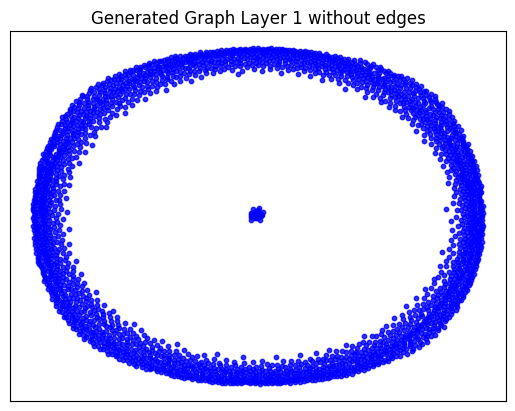

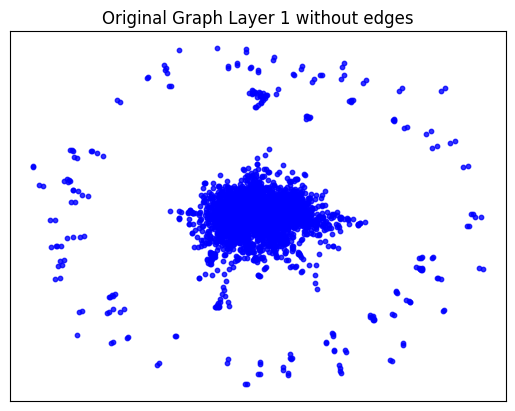

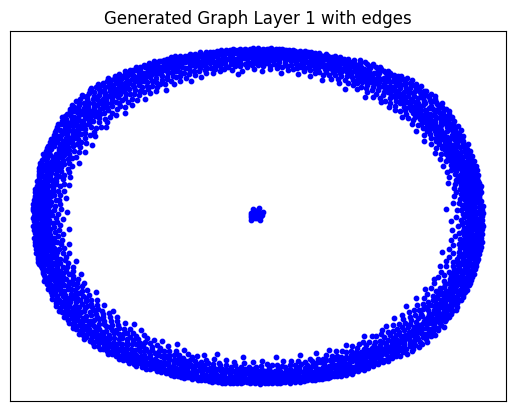

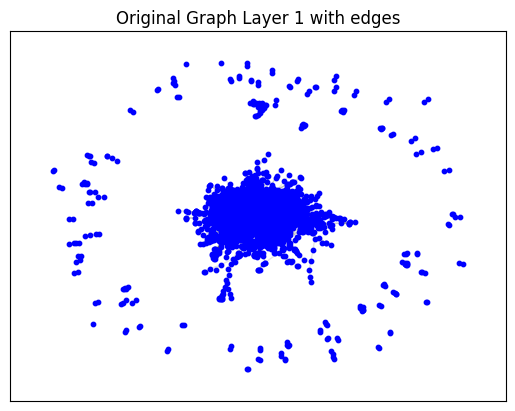

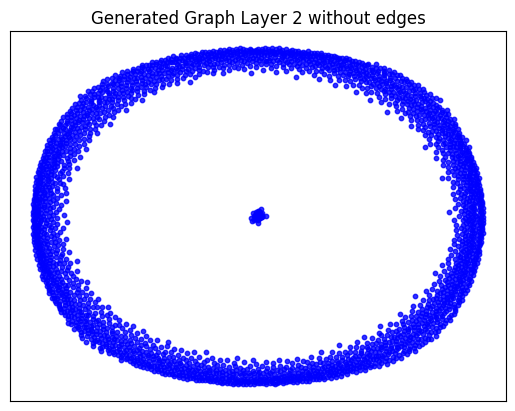

...

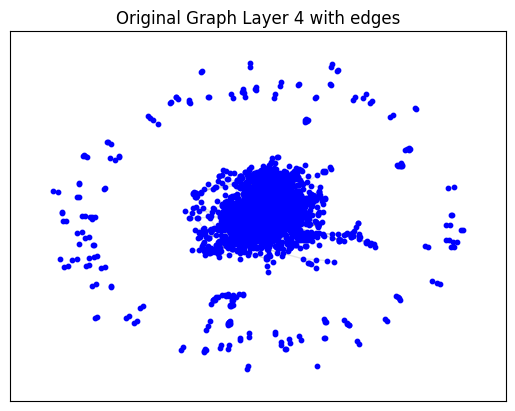

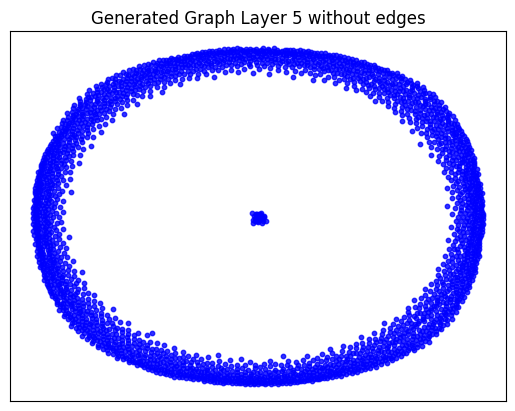

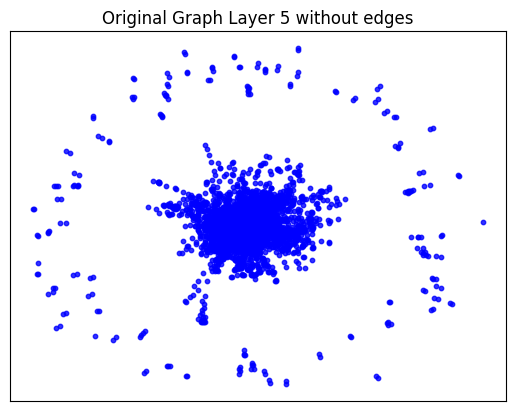

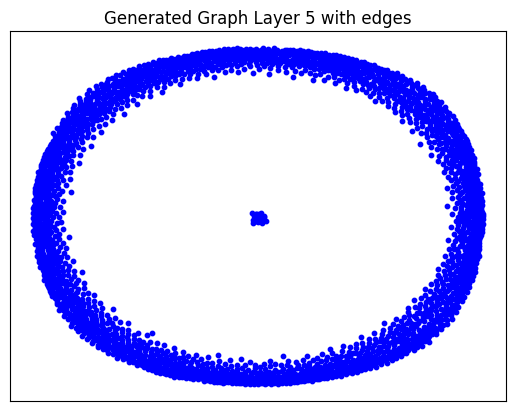

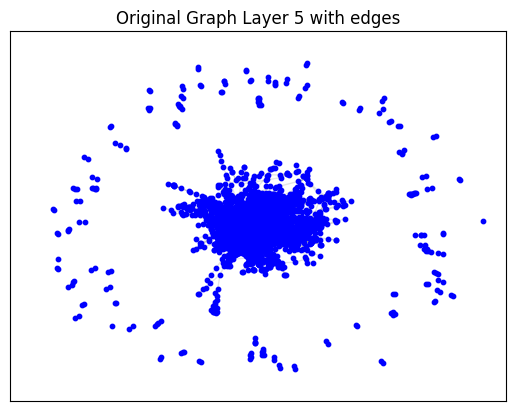

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_cora.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
targets is deprecated, use labels instead


Epoch 0 - Cost: 1.7066282033920288, Accuracy: 0.499980092048645
Epoch 1 - Cost: 1.7264989614486694, Accuracy: 0.5001644492149353
Epoch 2 - Cost: 1.7128876447677612, Accuracy: 0.4998739957809448
Epoch 3 - Cost: 1.6774613857269287, Accuracy: 0.4996795356273651
Epoch 4 - Cost: 1.677353858947754, Accuracy: 0.49964410066604614
Epoch 5 - Cost: 1.636386752128601, Accuracy: 0.49887335300445557
Epoch 6 - Cost: 1.6207634210586548, Accuracy: 0.49884116649627686
Epoch 7 - Cost: 1.5923038721084595, Accuracy: 0.497418075799942
Epoch 8 - Cost: 1.554134488105774, Accuracy: 0.49633151292800903
Epoch 9 - Cost: 1.4872167110443115, Accuracy: 0.49693068861961365
Epoch 10 - Cost: 1.4644702672958374, Accuracy: 0.4951355755329132
Epoch 11 - Cost: 1.4216679334640503, Accuracy: 0.49278274178504944
Epoch 12 - Cost: 1.3634486198425293, Accuracy: 0.4920133650302887
Epoch 13 - Cost: 1.2784912586212158, Accuracy: 0.48339101672172546
Epoch 14 - Cost: 1.250817894935608, Accuracy: 0.4809454679489136
Epoch 15 - Cost: 1.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.11872243881225586 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 296, 'd_min': 0, 'd': 1.7928360413589366, 'LCC': 1138, 'wedge_count': 116395.0, 'claw_count': 6709944.0, 'triangle_count': 2134, 'power_law_exp': 2.516672138330864, 'gini': 0.8367734461875938, 'rel_edge_distr_entropy': 0.7522100110791483, 'assortativity': -0.32298324827014946, 'clustering_coefficient': 0.0009541063233910745, 'n_components': 1526}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  q = np.asarray(q, dtype=np.float)


KL divergence between original network and the network generated by Music_GAN: 0.4327868513227613
KL divergence between original network and the network generated by Random E-R: 5.143445843203604
KL divergence between original network and the network generated by Random B-A: 0.8786115527758913
KL divergence between original network and the network generated by GAE: 2.1864107502190797
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.44033323593202695
KL divergence between original network and the network generated by Random E-R: 1.2046015779351267
KL divergence between original network and the network generated by Random B-A: 0.9448311397111733
KL divergence between original network and the network generated by GAE: 0.2081525485989409


In [ ]:
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

**PubMed Simulation:** <br>
The file taken from here: https://github.com/chennnM/GCNII/blob/master/data/ind.pubmed.graph <br>
Training MiscGan with the integrate G-Unets that trained with PROTEINS
<br>
We will split the dataset because of the limitation of GPU.

First batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_1.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_1'
args.filename = 'pubmed_1_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_1'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 8.3897
Epoch: [ 2] time: 8.4395
Epoch: [ 3] time: 8.4899
Epoch: [ 4] time: 8.5439
Epoch: [ 5] time: 8.5940
Epoch: [ 6] time: 8.6445
Epoch: [ 7] time: 8.6937
Epoch: [ 8] time: 8.7438
Epoch: [ 9] time: 8.7934
Epoch: [10] time: 8.8436
Epoch: [11] time: 8.8934
Epoch: [12] time: 8.9459
Epoch: [13] time: 8.9946
Epoch: [14] time: 9.0430
Epoch: [15] time: 9.0934
Epoch: [16] time: 9.1414
Epoch: [17] time: 9.1882
Epoch: [18] time: 9.2359
Epoch: [19] time: 9.2856
Epoch: [20] time: 9.3344
Epoch: [21] time: 9.3825
Epoch: [22] time: 9.4331
Epoch: [23] time: 9.4812
Epoch: [24] time: 9.5339
Epoch: [25] time: 9.5829
Epoch: [26] time: 9.6345
Epoch: [27] time: 9.6832
Epoch: [28] time: 9.7317
Epoch: [29] time: 9.7823
Epoch: [30] time: 9.8340
Epoch: [31] time: 9.8825
Epoch: [32] time: 9.9309
Epoch: [33] time: 9.9804
Epoch: [34] time: 10.0296
Epoch: [35] time: 10.0828
Epoch: [36] time: 10.1304
Epoch: [37] time: 10.1803
Epoch: [38] time: 10.2278
Epoch: [39] time: 1

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6705, 64])
Shape of h_subset: torch.Size([6, 64])
Shape of idx: torch.Size([6])
Shape of new_h before assignment: torch.Size([6705, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([6705, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.03458976745605469 seconds to compute statistics_degrees ---
--- 1.6081795692443848 seconds to compute statistics_LCC ---
--- 0.04658842086791992 seconds to compute statistics_wedge_count ---
--- 0.04765033721923828 seconds to compute statistics_claw_count ---
--- 0.27344489097595215 seconds to compute statistics_triangle_count ---
--- 0.03628873825073242 seconds to compute statistics_power_law_alpha ---
--- 0.036774396896362305 seconds to compute statistics_gini ---
--- 0.1743481159210205 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05997180938720703 s

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07207179069519043 seconds to compute degree_assortativity_coefficient ---
--- 0.801776647567749 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 126.0, 'd_min': 0.0, 'd': 2.3756897, 'LCC': 296, 'wedge_count': 558195.0, 'claw_count': 14451868.0, 'triangle_count': 227788, 'power_law_exp': 1.262199617140149, 'gini': 0.9697713132225594, 'rel_edge_distr_entropy': 0.6225910746872012, 'assortativity': 0.004907006841170597, 'clustering_coefficient': 0.04728551354053331, 'n_components': 6410}


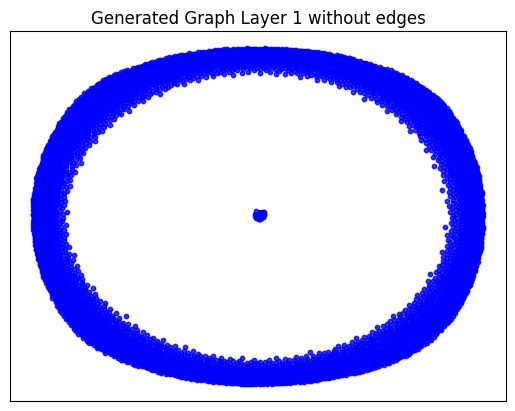

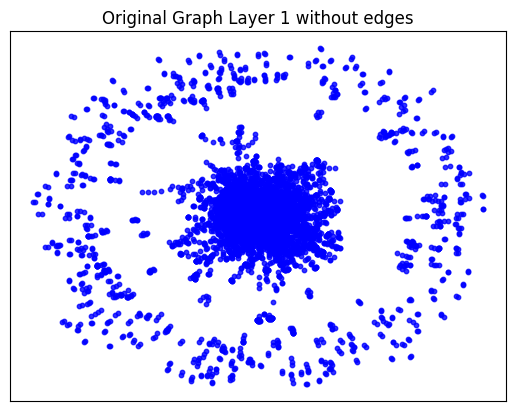

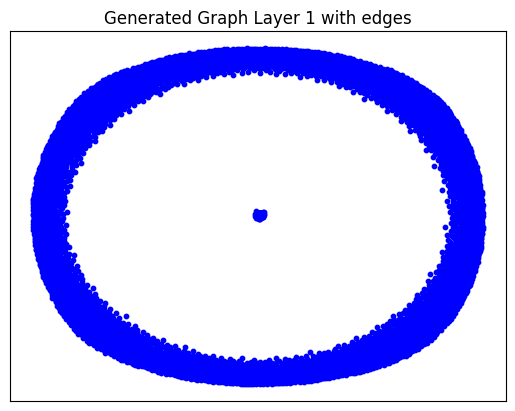

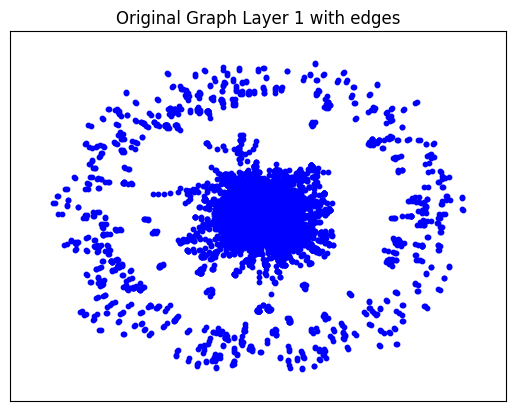

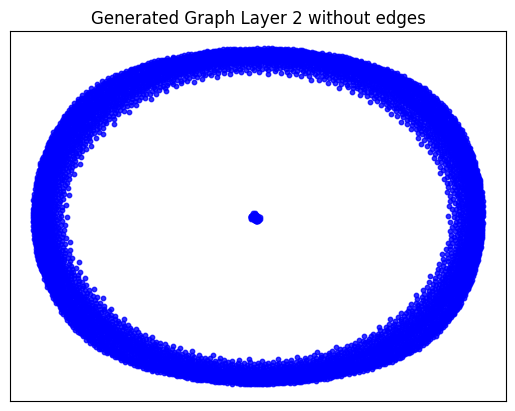

...

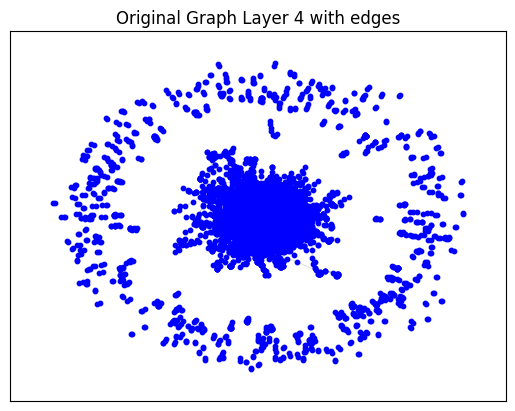

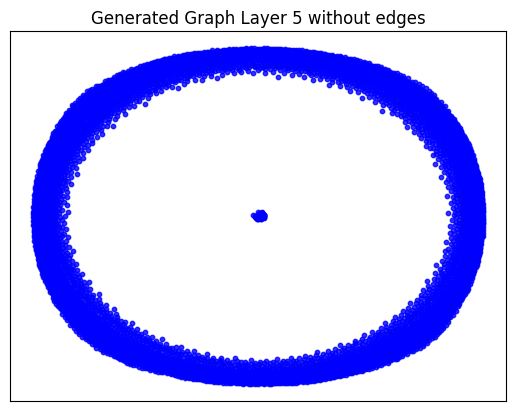

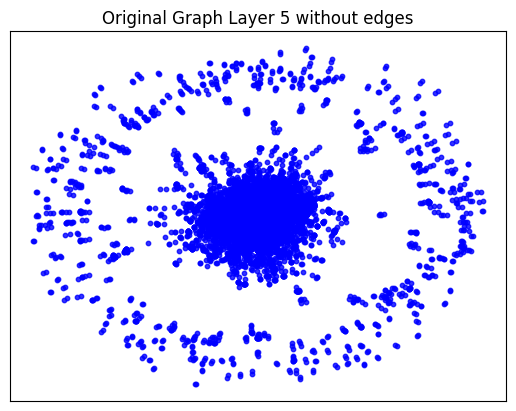

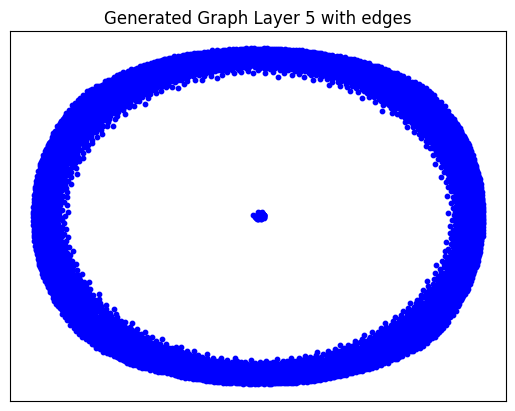

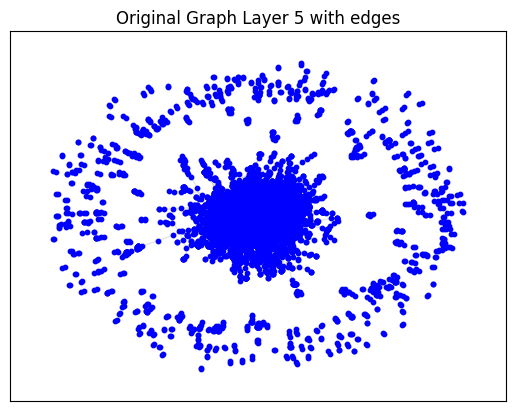

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_1.
Epoch 0 - Cost: 1.7348142862319946, Accuracy: 0.49992555379867554
Epoch 1 - Cost: 1.7280569076538086, Accuracy: 0.5000635385513306
Epoch 2 - Cost: 1.6898216009140015, Accuracy: 0.49992772936820984
Epoch 3 - Cost: 1.6695584058761597, Accuracy: 0.5000317692756653
Epoch 4 - Cost: 1.6394468545913696, Accuracy: 0.5000324249267578
Epoch 5 - Cost: 1.6252858638763428, Accuracy: 0.499179869890213
Epoch 6 - Cost: 1.56270432472229, Accuracy: 0.49855226278305054
Epoch 7 - Cost: 1.5223454236984253, Accuracy: 0.49813321232795715
Epoch 8 - Cost: 1.4547035694122314, Accuracy: 0.4966566860675812
Epoch 9 - Cost: 1.4077364206314087, Accuracy: 0.495943158864975
Epoch 10 - Cost: 1.3392387628555298, Accuracy: 0.49191704392433167
Epoch 11 - Cost: 1.2856179475784302, Accuracy: 0.48563364148139954
Epoch 12 - Cost: 1.2102338075637817, Accuracy: 0.4774787724018097
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1744391918182373 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05231189727783203 seconds to compute degree_assortativity_coefficient ---
--- 0.8025040626525879 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 290, 'd_min': 0, 'd': 1.235609901580674, 'LCC': 1363, 'wedge_count': 194745.0, 'claw_count': 8802268.0, 'triangle_count': 11982, 'power_law_exp': 2.213848157064752, 'gini': 0.9377845584332669, 'rel_edge_distr_entropy': 0.6907838374339625, 'assortativity': -0.31005316939298955, 'clustering_coefficient': 0.004083720241192384, 'n_components': 5341}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:48: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by it

KL divergence between original network and the network generated by Music_GAN: 0.06053647492529907
KL divergence between original network and the network generated by Random E-R: 6.432775858422737
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0006216155638699958
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.2957111102014378
KL divergence between original network and the network generated by Random E-R: 3.4458355621250005
KL divergence between original network and the network generated by Random B-A: 1.8980174133304366
KL divergence between original network and the network generated by GAE: 32.59385197595285


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Second batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_2.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_2'
args.filename = 'pubmed_2_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_2'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 8.2020
Epoch: [ 2] time: 8.2570
Epoch: [ 3] time: 8.3105
Epoch: [ 4] time: 8.3633
Epoch: [ 5] time: 8.4138
Epoch: [ 6] time: 8.4653
Epoch: [ 7] time: 8.5156
Epoch: [ 8] time: 8.5680
Epoch: [ 9] time: 8.6213
Epoch: [10] time: 8.6756
Epoch: [11] time: 8.7262
Epoch: [12] time: 8.7840
Epoch: [13] time: 8.8400
Epoch: [14] time: 8.8936
Epoch: [15] time: 8.9478
Epoch: [16] time: 9.0007
Epoch: [17] time: 9.0588
Epoch: [18] time: 9.1127
Epoch: [19] time: 9.1648
Epoch: [20] time: 9.2196
Epoch: [21] time: 9.2736
Epoch: [22] time: 9.3264
Epoch: [23] time: 9.3760
Epoch: [24] time: 9.4260
Epoch: [25] time: 9.4783
Epoch: [26] time: 9.5276
Epoch: [27] time: 9.5782
Epoch: [28] time: 9.6307
Epoch: [29] time: 9.6816
Epoch: [30] time: 9.7340
Epoch: [31] time: 9.7856
Epoch: [32] time: 9.8356
Epoch: [33] time: 9.8885
Epoch: [34] time: 9.9384
Epoch: [35] time: 9.9909
Epoch: [36] time: 10.0457
Epoch: [37] time: 10.0990
Epoch: [38] time: 10.1509
Epoch: [39] time: 10.

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6178, 64])
Shape of h_subset: torch.Size([6, 64])
Shape of idx: torch.Size([6])
Shape of new_h before assignment: torch.Size([6178, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([6178, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.029558658599853516 seconds to compute statistics_degrees ---
--- 1.3368358612060547 seconds to compute statistics_LCC ---
--- 0.03913259506225586 seconds to compute statistics_wedge_count ---
--- 0.04036974906921387 seconds to compute statistics_claw_count ---
--- 0.2404332160949707 seconds to compute statistics_triangle_count ---
--- 0.030305147171020508 seconds to compute statistics_power_law_alpha ---
--- 0.030090808868408203 seconds to compute statistics_gini ---
--- 0.14438748359680176 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0557098388671875 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6777749061584473 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 125.0, 'd_min': 0.0, 'd': 2.426999, 'LCC': 259, 'wedge_count': 483043.0, 'claw_count': 10610796.0, 'triangle_count': 213190, 'power_law_exp': 1.262885084069596, 'gini': 0.9651478806694793, 'rel_edge_distr_entropy': 0.6253640960520096, 'assortativity': -0.1862616001863619, 'clustering_coefficient': 0.060275402523995374, 'n_components': 5914}


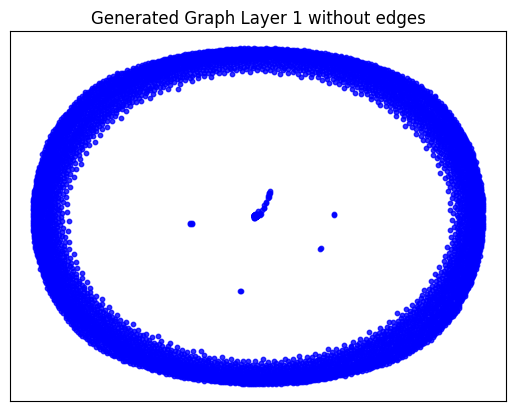

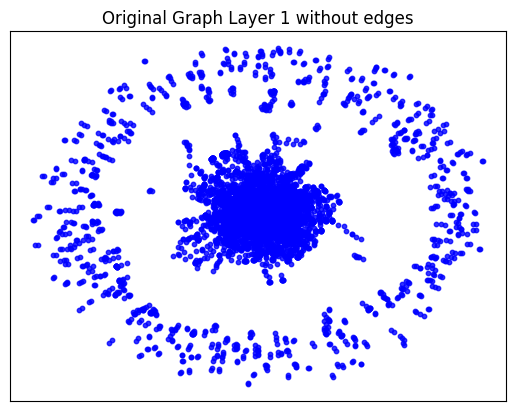

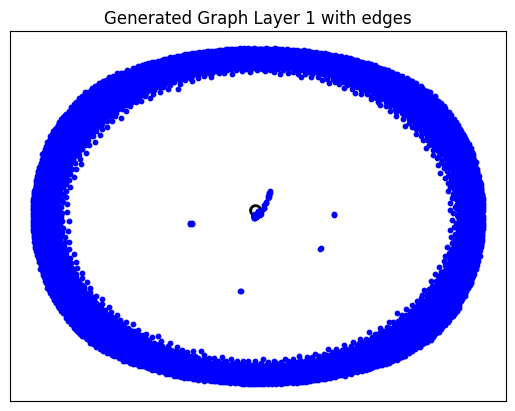

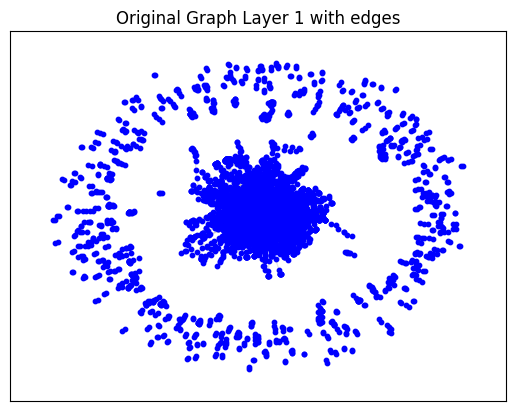

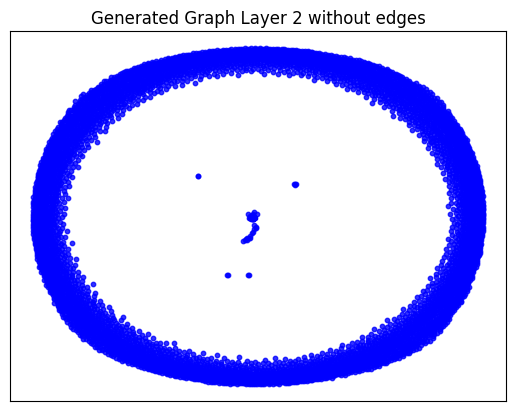

...

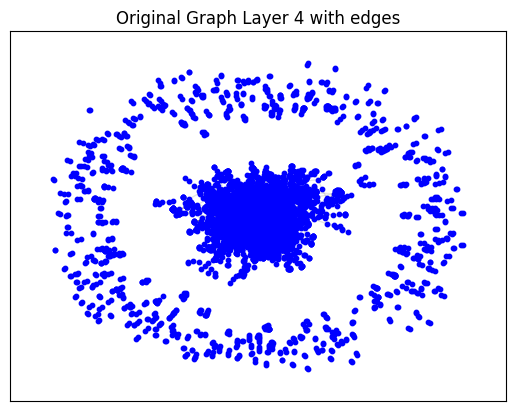

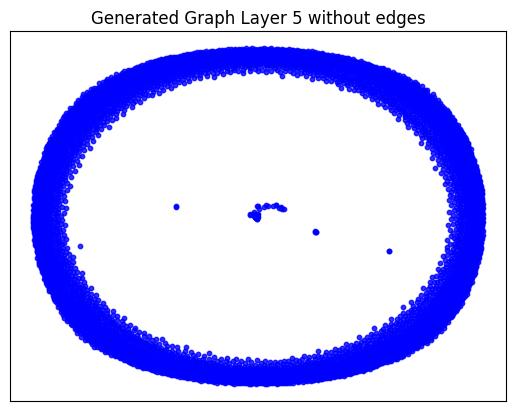

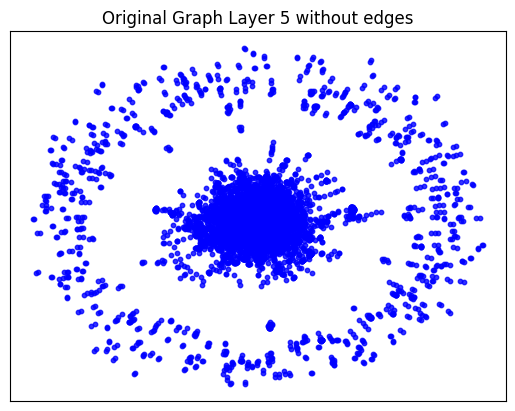

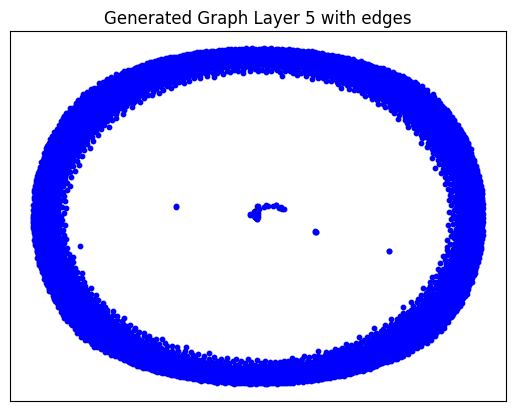

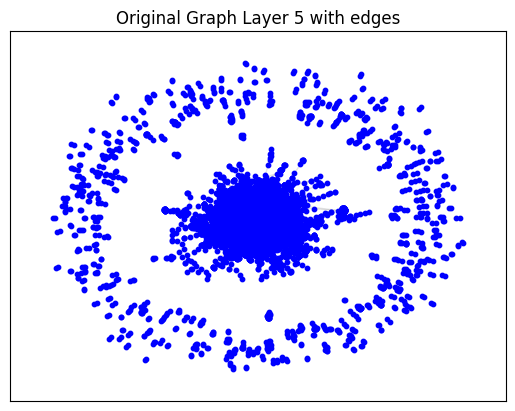

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_2.
Epoch 0 - Cost: 1.7295660972595215, Accuracy: 0.5002038478851318
Epoch 1 - Cost: 1.7248237133026123, Accuracy: 0.500159740447998
Epoch 2 - Cost: 1.727440357208252, Accuracy: 0.5000528693199158
Epoch 3 - Cost: 1.6970239877700806, Accuracy: 0.4999094307422638
Epoch 4 - Cost: 1.6553571224212646, Accuracy: 0.49951639771461487
Epoch 5 - Cost: 1.6645153760910034, Accuracy: 0.4997199475765228
Epoch 6 - Cost: 1.6158907413482666, Accuracy: 0.4996163845062256
Epoch 7 - Cost: 1.583380103111267, Accuracy: 0.4991161823272705
Epoch 8 - Cost: 1.5646737813949585, Accuracy: 0.49867668747901917
Epoch 9 - Cost: 1.5214799642562866, Accuracy: 0.4969543218612671
Epoch 10 - Cost: 1.473250150680542, Accuracy: 0.49694395065307617
Epoch 11 - Cost: 1.4270673990249634, Accuracy: 0.4950543940067291
Epoch 12 - Cost: 1.3458435535430908, Accuracy: 0.4931175410747528
Epoch 13 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14794087409973145 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0500798225402832 seconds to compute degree_assortativity_coefficient ---
--- 0.6370241641998291 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 269, 'd_min': 0, 'd': 1.266062469655284, 'LCC': 1516, 'wedge_count': 161348.0, 'claw_count': 6700475.0, 'triangle_count': 6881, 'power_law_exp': 2.3822855533631415, 'gini': 0.9229325050766661, 'rel_edge_distr_entropy': 0.709022681086873, 'assortativity': -0.27726056253541087, 'clustering_coefficient': 0.003080826359325272, 'n_components': 4662}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.4531641681012165
KL divergence between original network and the network generated by Random E-R: 5.49657479305642
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.002894413961578167
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.433991184724078
KL divergence between original network and the network generated by Random E-R: 46.72933804926004
KL divergence between original network and the network generated by Random B-A: 2.0772167632577867
KL divergence between original network and the network generated by GAE: 30.896283102311823


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Third batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_3.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_3'
args.filename = 'pubmed_3_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_3'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.8940
Epoch: [ 2] time: 7.9450
Epoch: [ 3] time: 7.9938
Epoch: [ 4] time: 8.0427
Epoch: [ 5] time: 8.0902
Epoch: [ 6] time: 8.1404
Epoch: [ 7] time: 8.1879
Epoch: [ 8] time: 8.2383
Epoch: [ 9] time: 8.2871
Epoch: [10] time: 8.3353
Epoch: [11] time: 8.3832
Epoch: [12] time: 8.4320
Epoch: [13] time: 8.4789
Epoch: [14] time: 8.5276
Epoch: [15] time: 8.5765
Epoch: [16] time: 8.6248
Epoch: [17] time: 8.6778
Epoch: [18] time: 8.7277
Epoch: [19] time: 8.7780
Epoch: [20] time: 8.8294
Epoch: [21] time: 8.8789
Epoch: [22] time: 8.9263
Epoch: [23] time: 8.9774
Epoch: [24] time: 9.0269
Epoch: [25] time: 9.0749
Epoch: [26] time: 9.1248
Epoch: [27] time: 9.1773
Epoch: [28] time: 9.2251
Epoch: [29] time: 9.2760
Epoch: [30] time: 9.3249
Epoch: [31] time: 9.3744
Epoch: [32] time: 9.4223
Epoch: [33] time: 9.4709
Epoch: [34] time: 9.5203
Epoch: [35] time: 9.5677
Epoch: [36] time: 9.6155
Epoch: [37] time: 9.6698
Epoch: [38] time: 9.7194
Epoch: [39] time: 9.7699

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([6, 64])
Shape of idx: torch.Size([6])
Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.028822660446166992 seconds to compute statistics_degrees ---
--- 1.2971594333648682 seconds to compute statistics_LCC ---
--- 0.04095458984375 seconds to compute statistics_wedge_count ---
--- 0.04139375686645508 seconds to compute statistics_claw_count ---
--- 0.23994803428649902 seconds to compute statistics_triangle_count ---
--- 0.030554771423339844 seconds to compute statistics_power_law_alpha ---
--- 0.03154563903808594 seconds to compute statistics_gini ---
--- 0.15297174453735352 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0576932430267334 sec

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.665776252746582 seconds to compute connected_components ---
--- 1.1920928955078125e-06 seconds to compute statistics_cluster_props ---
{'d_max': 137.0, 'd_min': 0.0, 'd': 2.397247, 'LCC': 252, 'wedge_count': 491159.0, 'claw_count': 11172930.0, 'triangle_count': 221789, 'power_law_exp': 1.2518903418673266, 'gini': 0.9666630776782472, 'rel_edge_distr_entropy': 0.6232022248919565, 'assortativity': 0.006528350415713341, 'clustering_coefficient': 0.059551702194500455, 'n_components': 5995}


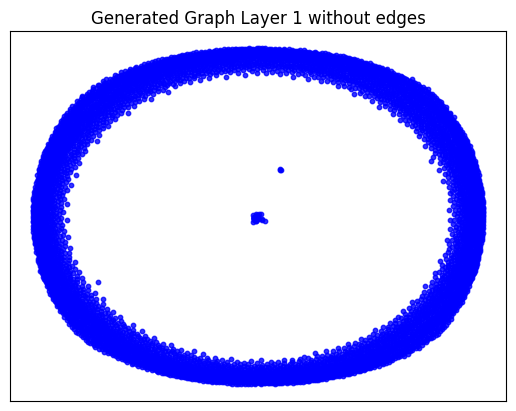

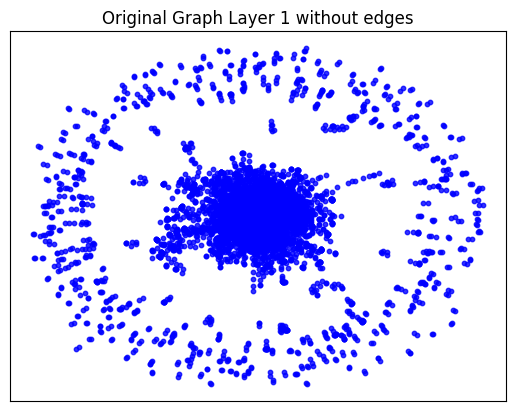

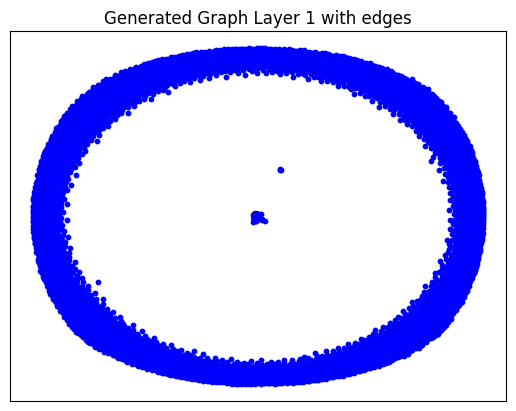

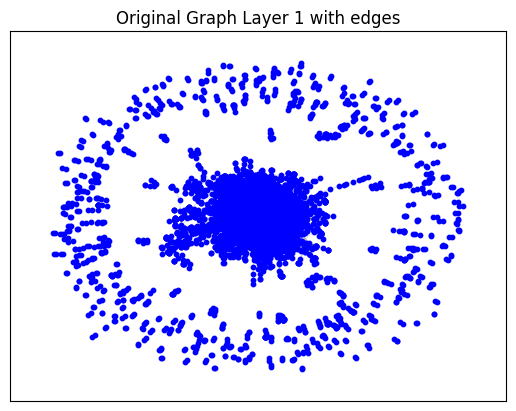

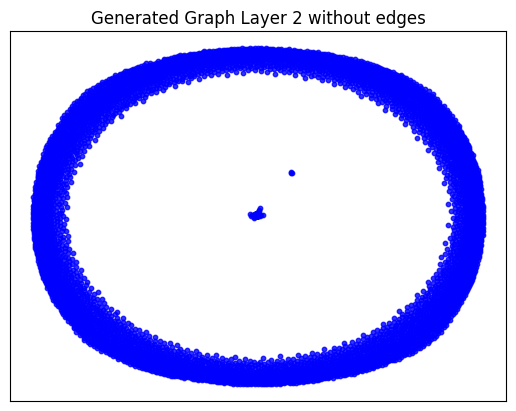

...

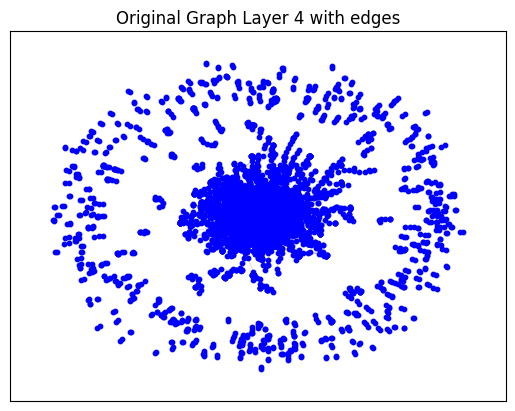

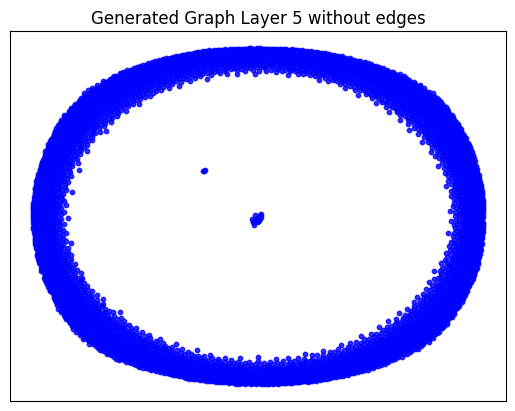

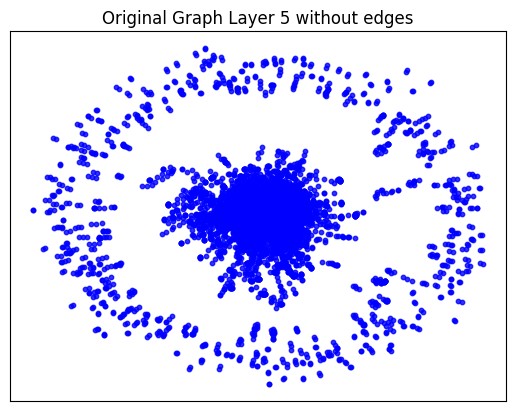

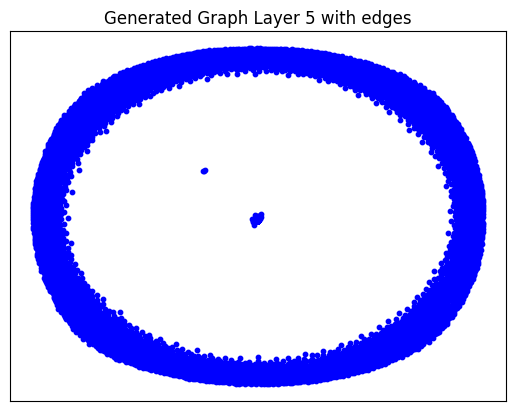

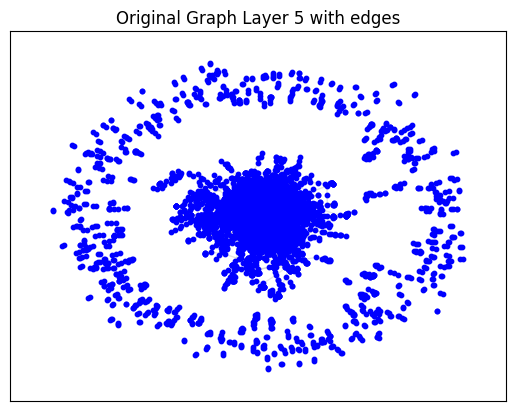

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_3.
Epoch 0 - Cost: 1.7458823919296265, Accuracy: 0.5001208782196045
Epoch 1 - Cost: 1.6994373798370361, Accuracy: 0.5001471042633057
Epoch 2 - Cost: 1.6683944463729858, Accuracy: 0.4999861717224121
Epoch 3 - Cost: 1.6565512418746948, Accuracy: 0.4996761083602905
Epoch 4 - Cost: 1.6296923160552979, Accuracy: 0.4995698928833008
Epoch 5 - Cost: 1.6184636354446411, Accuracy: 0.4996788203716278
Epoch 6 - Cost: 1.5593650341033936, Accuracy: 0.49925899505615234
Epoch 7 - Cost: 1.5355110168457031, Accuracy: 0.49827125668525696
Epoch 8 - Cost: 1.4893358945846558, Accuracy: 0.49875161051750183
Epoch 9 - Cost: 1.422906517982483, Accuracy: 0.49589163064956665
Epoch 10 - Cost: 1.4298477172851562, Accuracy: 0.49470847845077515
Epoch 11 - Cost: 1.3479665517807007, Accuracy: 0.49104759097099304
Epoch 12 - Cost: 1.3140960931777954, Accuracy: 0.48724281787872314
Epoch 13 - 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15264463424682617 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04892587661743164 seconds to compute degree_assortativity_coefficient ---
--- 0.63981032371521 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 210, 'd_min': 0, 'd': 1.2473995839334293, 'LCC': 1187, 'wedge_count': 140368.0, 'claw_count': 3976631.0, 'triangle_count': 11083, 'power_law_exp': 2.0908286553835977, 'gini': 0.9395169526033724, 'rel_edge_distr_entropy': 0.6953652848927235, 'assortativity': -0.26870368223120694, 'clustering_coefficient': 0.00836109762258555, 'n_components': 5059}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.1265418816790571
KL divergence between original network and the network generated by Random E-R: 5.13048924523954
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 4.849366612163786
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.4965075614782846
KL divergence between original network and the network generated by Random E-R: 11.519058152457884
KL divergence between original network and the network generated by Random B-A: 1.9596265279081415
KL divergence between original network and the network generated by GAE: 37.15675000066892


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fourth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_4.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_4'
args.filename = 'pubmed_4_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_4'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.9511
Epoch: [ 2] time: 8.0048
Epoch: [ 3] time: 8.0594
Epoch: [ 4] time: 8.1123
Epoch: [ 5] time: 8.1643
Epoch: [ 6] time: 8.2149
Epoch: [ 7] time: 8.2691
Epoch: [ 8] time: 8.3223
Epoch: [ 9] time: 8.3751
Epoch: [10] time: 8.4255
Epoch: [11] time: 8.4781
Epoch: [12] time: 8.5325
Epoch: [13] time: 8.5862
Epoch: [14] time: 8.6383
Epoch: [15] time: 8.6889
Epoch: [16] time: 8.7426
Epoch: [17] time: 8.7982
Epoch: [18] time: 8.8470
Epoch: [19] time: 8.8994
Epoch: [20] time: 8.9484
Epoch: [21] time: 8.9998
Epoch: [22] time: 9.0583
Epoch: [23] time: 9.1133
Epoch: [24] time: 9.1622
Epoch: [25] time: 9.2161
Epoch: [26] time: 9.2703
Epoch: [27] time: 9.3283
Epoch: [28] time: 9.3812
Epoch: [29] time: 9.4352
Epoch: [30] time: 9.4893
Epoch: [31] time: 9.5424
Epoch: [32] time: 9.5939
Epoch: [33] time: 9.6501
Epoch: [34] time: 9.7008
Epoch: [35] time: 9.7531
Epoch: [36] time: 9.8038
Epoch: [37] time: 9.8570
Epoch: [38] time: 9.9098
Epoch: [39] time: 9.9635

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6376, 64])
Shape of h_subset: torch.Size([6, 64])
Shape of idx: torch.Size([6])
Shape of new_h before assignment: torch.Size([6376, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([6376, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.030362367630004883 seconds to compute statistics_degrees ---
--- 1.3582968711853027 seconds to compute statistics_LCC ---
--- 0.041391849517822266 seconds to compute statistics_wedge_count ---
--- 0.043077945709228516 seconds to compute statistics_claw_count ---
--- 0.2504427433013916 seconds to compute statistics_triangle_count ---
--- 0.031944990158081055 seconds to compute statistics_power_law_alpha ---
--- 0.03206181526184082 seconds to compute statistics_gini ---
--- 0.15789389610290527 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0583696365356445

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6936566829681396 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 140.0, 'd_min': 0.0, 'd': 2.363551, 'LCC': 260, 'wedge_count': 512195.0, 'claw_count': 12841594.0, 'triangle_count': 216598, 'power_law_exp': 1.2845897166670148, 'gini': 0.9689210701377677, 'rel_edge_distr_entropy': 0.6235639597183769, 'assortativity': -0.1709631978278263, 'clustering_coefficient': 0.05060072760437684, 'n_components': 6073}


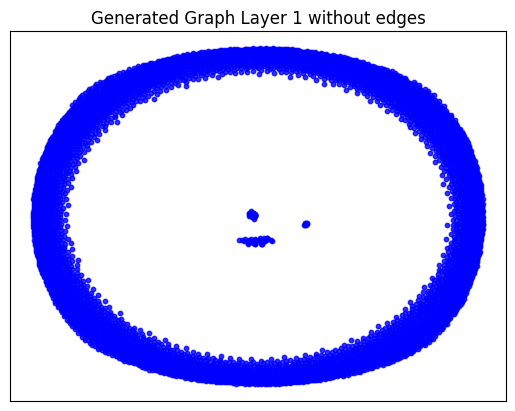

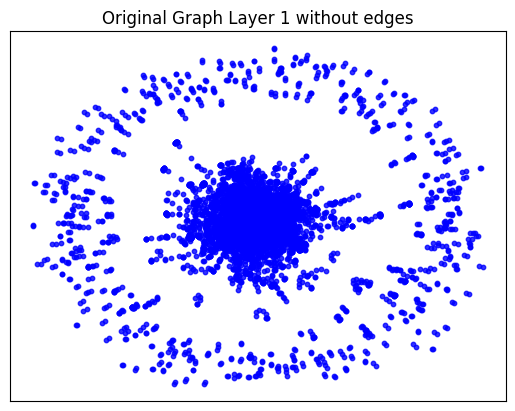

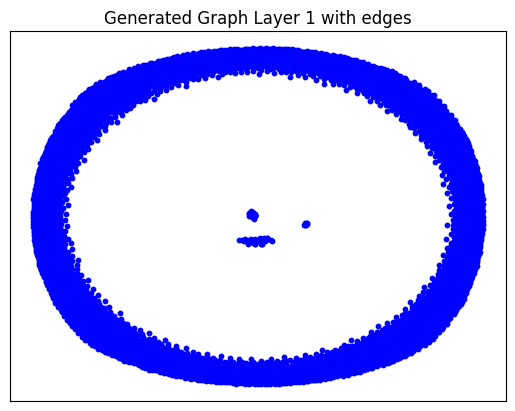

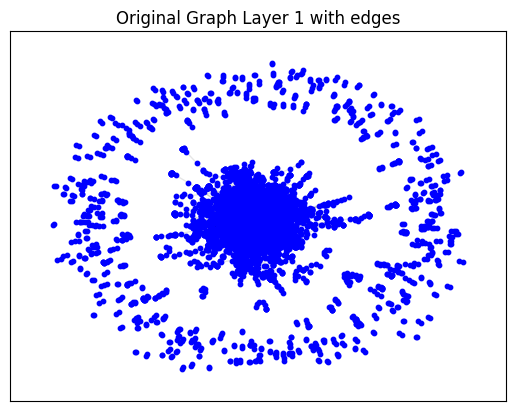

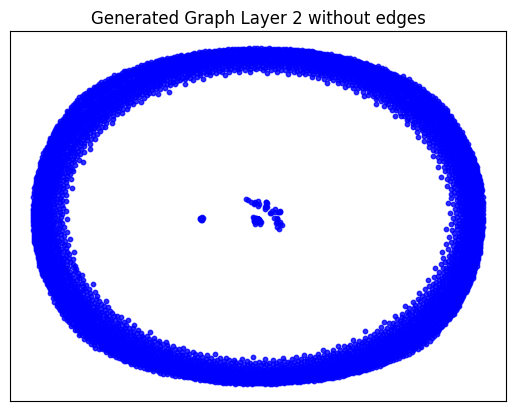

...

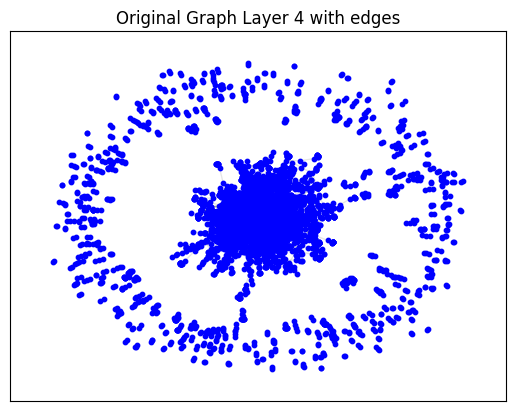

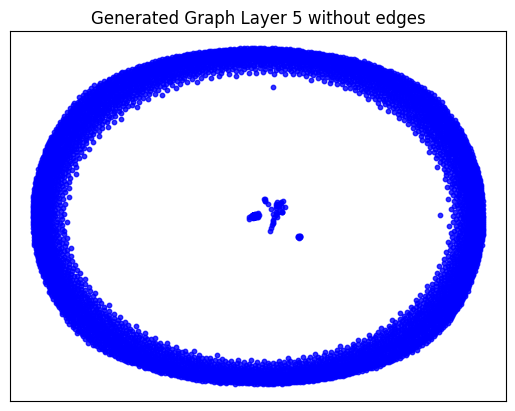

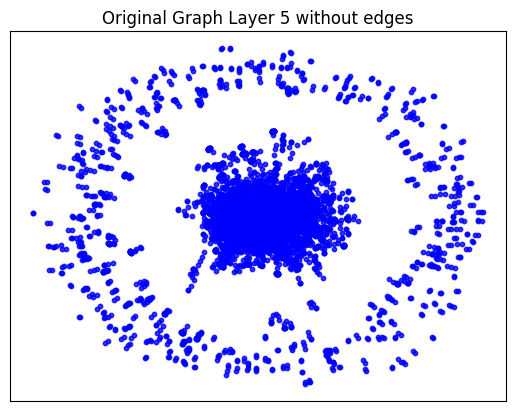

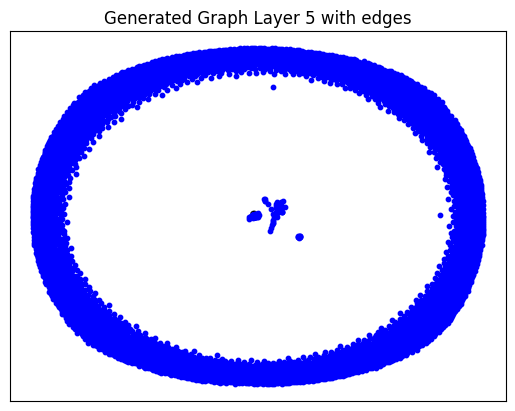

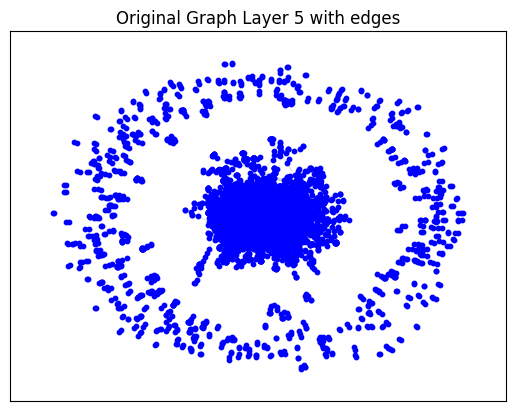

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_4.
Epoch 0 - Cost: 1.7073825597763062, Accuracy: 0.5002228617668152
Epoch 1 - Cost: 1.6993329524993896, Accuracy: 0.5001220703125
Epoch 2 - Cost: 1.7057684659957886, Accuracy: 0.49993228912353516
Epoch 3 - Cost: 1.6865956783294678, Accuracy: 0.49994608759880066
Epoch 4 - Cost: 1.6406399011611938, Accuracy: 0.49979156255722046
Epoch 5 - Cost: 1.6173644065856934, Accuracy: 0.4997888207435608
Epoch 6 - Cost: 1.6079105138778687, Accuracy: 0.49979934096336365
Epoch 7 - Cost: 1.5778682231903076, Accuracy: 0.4995166063308716
Epoch 8 - Cost: 1.5407214164733887, Accuracy: 0.49957242608070374
Epoch 9 - Cost: 1.4999616146087646, Accuracy: 0.49873673915863037
Epoch 10 - Cost: 1.4379546642303467, Accuracy: 0.49802178144454956
Epoch 11 - Cost: 1.3914520740509033, Accuracy: 0.49705424904823303
Epoch 12 - Cost: 1.3692716360092163, Accuracy: 0.4949389696121216
Epoch 13 - C

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15839815139770508 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04938864707946777 seconds to compute degree_assortativity_coefficient ---
--- 0.6902561187744141 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 234, 'd_min': 0, 'd': 1.228163713344833, 'LCC': 1268, 'wedge_count': 156051.0, 'claw_count': 5492464.0, 'triangle_count': 9167, 'power_law_exp': 2.117493304242124, 'gini': 0.936900286284837, 'rel_edge_distr_entropy': 0.6957184503957654, 'assortativity': -0.28036458713698076, 'clustering_coefficient': 0.005007042376609114, 'n_components': 5105}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.26912631387299346
KL divergence between original network and the network generated by Random E-R: 5.687802185852736
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.9998478522151637
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.7931250822042353
KL divergence between original network and the network generated by Random E-R: 4.899165189100181
KL divergence between original network and the network generated by Random B-A: 1.9234297086840453
KL divergence between original network and the network generated by GAE: 46.64783243391415


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fifth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_5.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_5'
args.filename = 'pubmed_5_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_5'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.6000
Epoch: [ 2] time: 7.6495
Epoch: [ 3] time: 7.7022
Epoch: [ 4] time: 7.7531
Epoch: [ 5] time: 7.8001
Epoch: [ 6] time: 7.8506
Epoch: [ 7] time: 7.8979
Epoch: [ 8] time: 7.9458
Epoch: [ 9] time: 7.9954
Epoch: [10] time: 8.0444
Epoch: [11] time: 8.0934
Epoch: [12] time: 8.1480
Epoch: [13] time: 8.1960
Epoch: [14] time: 8.2457
Epoch: [15] time: 8.2993
Epoch: [16] time: 8.3502
Epoch: [17] time: 8.3992
Epoch: [18] time: 8.4460
Epoch: [19] time: 8.4930
Epoch: [20] time: 8.5426
Epoch: [21] time: 8.5919
Epoch: [22] time: 8.6464
Epoch: [23] time: 8.6940
Epoch: [24] time: 8.7437
Epoch: [25] time: 8.7923
Epoch: [26] time: 8.8460
Epoch: [27] time: 8.8936
Epoch: [28] time: 8.9425
Epoch: [29] time: 8.9934
Epoch: [30] time: 9.0408
Epoch: [31] time: 9.0991
Epoch: [32] time: 9.1511
Epoch: [33] time: 9.1996
Epoch: [34] time: 9.2538
Epoch: [35] time: 9.3048
Epoch: [36] time: 9.3540
Epoch: [37] time: 9.4055
Epoch: [38] time: 9.4552
Epoch: [39] time: 9.5024

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([6, 64])
Shape of idx: torch.Size([6])
Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([6248, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.03015875816345215 seconds to compute statistics_degrees ---
--- 1.3076786994934082 seconds to compute statistics_LCC ---
--- 0.04024672508239746 seconds to compute statistics_wedge_count ---
--- 0.04189658164978027 seconds to compute statistics_claw_count ---
--- 0.24098491668701172 seconds to compute statistics_triangle_count ---
--- 0.030777692794799805 seconds to compute statistics_power_law_alpha ---
--- 0.030687808990478516 seconds to compute statistics_gini ---
--- 0.1490936279296875 seconds to compute statistics_edge_distribution_entropy ---
--- 0.055858612060546875

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.7042019367218018 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 93.0, 'd_min': 0.0, 'd': 2.399968, 'LCC': 337, 'wedge_count': 427212.0, 'claw_count': 8571713.0, 'triangle_count': 186656, 'power_law_exp': 1.2884015163514437, 'gini': 0.9621164908149067, 'rel_edge_distr_entropy': 0.6432247098655328, 'assortativity': 0.6375078704045805, 'clustering_coefficient': 0.0653274322180409, 'n_components': 5912}


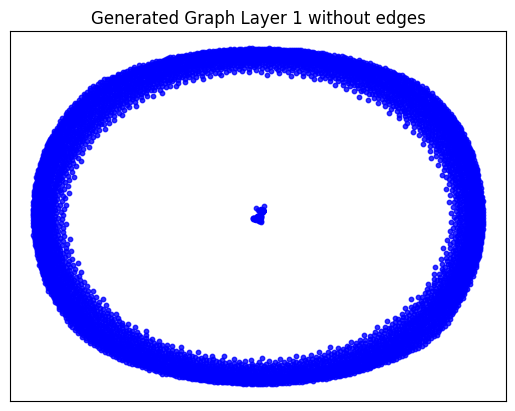

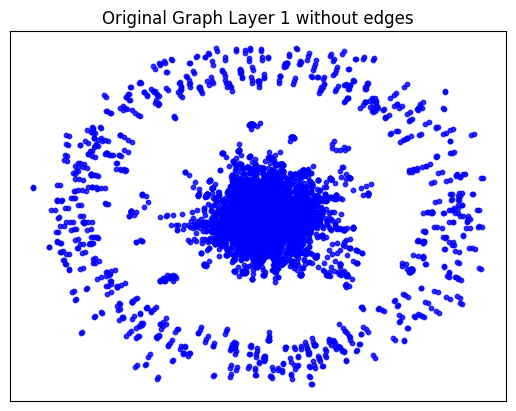

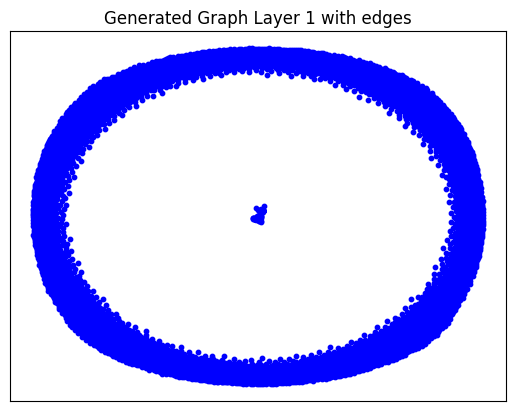

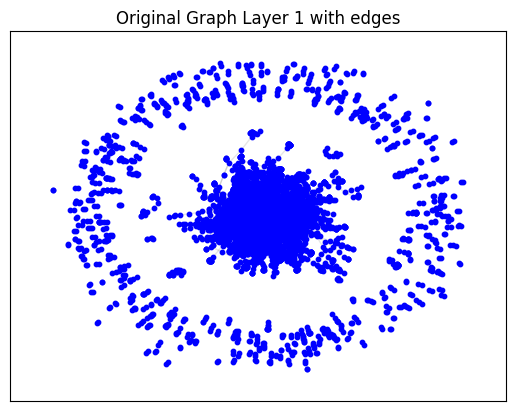

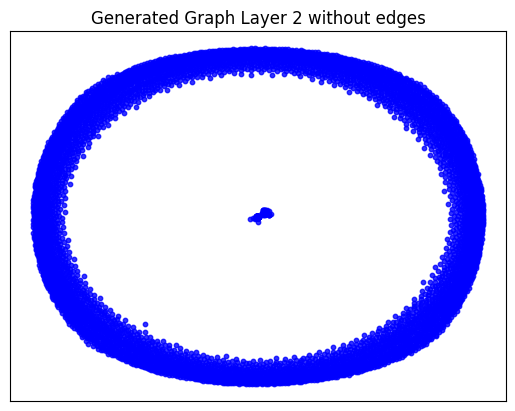

...

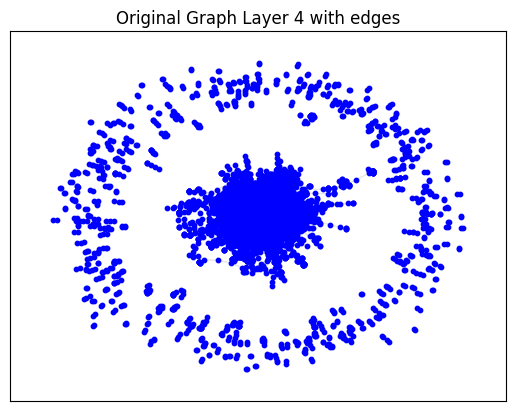

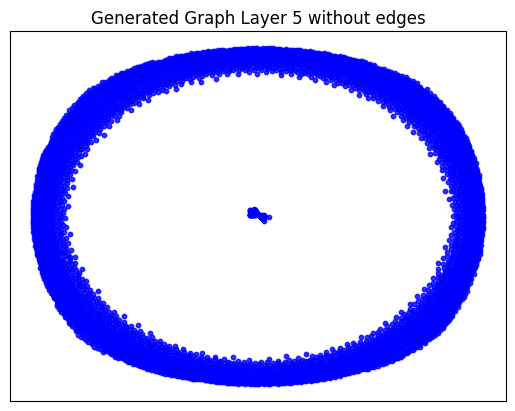

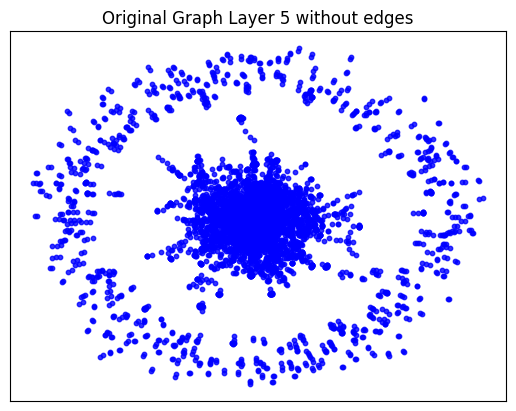

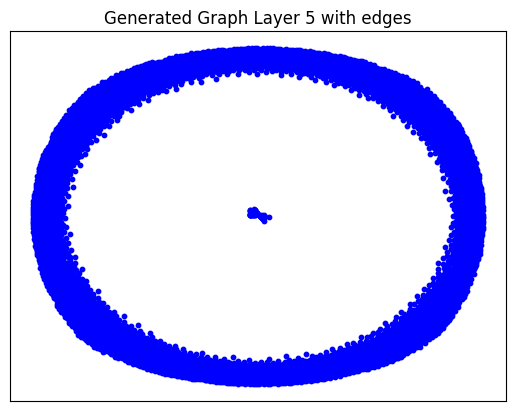

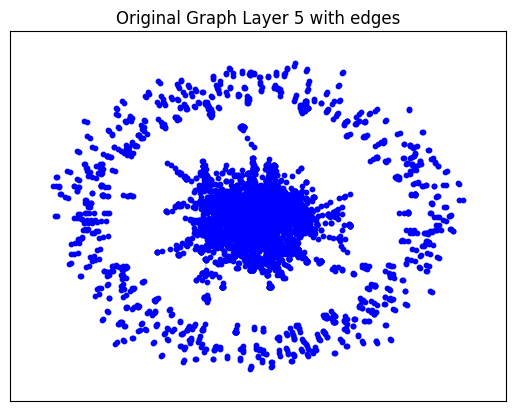

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_5.
Epoch 0 - Cost: 1.7164300680160522, Accuracy: 0.5000249743461609
Epoch 1 - Cost: 1.7152992486953735, Accuracy: 0.4999903738498688
Epoch 2 - Cost: 1.69966721534729, Accuracy: 0.4997990131378174
Epoch 3 - Cost: 1.6779638528823853, Accuracy: 0.5001469850540161
Epoch 4 - Cost: 1.6452840566635132, Accuracy: 0.5000970959663391
Epoch 5 - Cost: 1.620276927947998, Accuracy: 0.4996737539768219
Epoch 6 - Cost: 1.609237790107727, Accuracy: 0.49940916895866394
Epoch 7 - Cost: 1.5622378587722778, Accuracy: 0.499445378780365
Epoch 8 - Cost: 1.5360106229782104, Accuracy: 0.49921926856040955
Epoch 9 - Cost: 1.4757781028747559, Accuracy: 0.4986434876918793
Epoch 10 - Cost: 1.411729335784912, Accuracy: 0.4989392161369324
Epoch 11 - Cost: 1.3793327808380127, Accuracy: 0.4976027011871338
Epoch 12 - Cost: 1.368760108947754, Accuracy: 0.49628946185112
Epoch 13 - Cost: 1.28959

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15219902992248535 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04986572265625 seconds to compute degree_assortativity_coefficient ---
--- 0.6715030670166016 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 185, 'd_min': 0, 'd': 1.250760121619459, 'LCC': 1257, 'wedge_count': 156128.0, 'claw_count': 4745689.0, 'triangle_count': 10644, 'power_law_exp': 2.1805713956215085, 'gini': 0.9388076913186356, 'rel_edge_distr_entropy': 0.6906941790072316, 'assortativity': -0.2967116117848911, 'clustering_coefficient': 0.006728633081518827, 'n_components': 4990}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.6086137077893855
KL divergence between original network and the network generated by Random E-R: 5.752845057661612
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.026194488926787
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.066863225805448
KL divergence between original network and the network generated by Random E-R: 8.97699356794508
KL divergence between original network and the network generated by Random B-A: 1.949015890017018
KL divergence between original network and the network generated by GAE: 29.57588176561613


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Sixth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_6.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_6'
args.filename = 'pubmed_6_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_6'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.1383
Epoch: [ 2] time: 7.1920
Epoch: [ 3] time: 7.2404
Epoch: [ 4] time: 7.2924
Epoch: [ 5] time: 7.3416
Epoch: [ 6] time: 7.3929
Epoch: [ 7] time: 7.4442
Epoch: [ 8] time: 7.4923
Epoch: [ 9] time: 7.5431
Epoch: [10] time: 7.5935
Epoch: [11] time: 7.6450
Epoch: [12] time: 7.6980
Epoch: [13] time: 7.7474
Epoch: [14] time: 7.8012
Epoch: [15] time: 7.8502
Epoch: [16] time: 7.8977
Epoch: [17] time: 7.9490
Epoch: [18] time: 7.9977
Epoch: [19] time: 8.0500
Epoch: [20] time: 8.1022
Epoch: [21] time: 8.1523
Epoch: [22] time: 8.2058
Epoch: [23] time: 8.2567
Epoch: [24] time: 8.3082
Epoch: [25] time: 8.3612
Epoch: [26] time: 8.4132
Epoch: [27] time: 8.4684
Epoch: [28] time: 8.5196
Epoch: [29] time: 8.5719
Epoch: [30] time: 8.6244
Epoch: [31] time: 8.6742
Epoch: [32] time: 8.7232
Epoch: [33] time: 8.7774
Epoch: [34] time: 8.8311
Epoch: [35] time: 8.8896
Epoch: [36] time: 8.9481
Epoch: [37] time: 9.0018
Epoch: [38] time: 9.0544
Epoch: [39] time: 9.1072

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6130, 64])
Shape of h_subset: torch.Size([6, 64])
Shape of idx: torch.Size([6])
Shape of new_h before assignment: torch.Size([6130, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([6130, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.02771472930908203 seconds to compute statistics_degrees ---
--- 1.2642247676849365 seconds to compute statistics_LCC ---
--- 0.039090871810913086 seconds to compute statistics_wedge_count ---
--- 0.041473388671875 seconds to compute statistics_claw_count ---
--- 0.23441290855407715 seconds to compute statistics_triangle_count ---
--- 0.03099799156188965 seconds to compute statistics_power_law_alpha ---
--- 0.031070947647094727 seconds to compute statistics_gini ---
--- 0.14696836471557617 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05748724937438965 s

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6461710929870605 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 134.0, 'd_min': 0.0, 'd': 2.3846655, 'LCC': 322, 'wedge_count': 525208.0, 'claw_count': 14812412.0, 'triangle_count': 207811, 'power_law_exp': 1.2994668069767652, 'gini': 0.9700651970564347, 'rel_edge_distr_entropy': 0.6248324897212986, 'assortativity': 0.42261117321921515, 'clustering_coefficient': 0.04208855384254772, 'n_components': 5809}


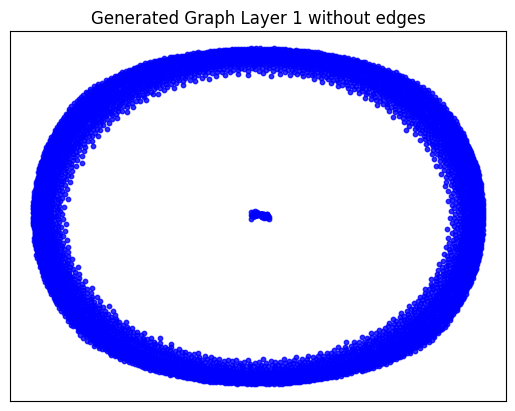

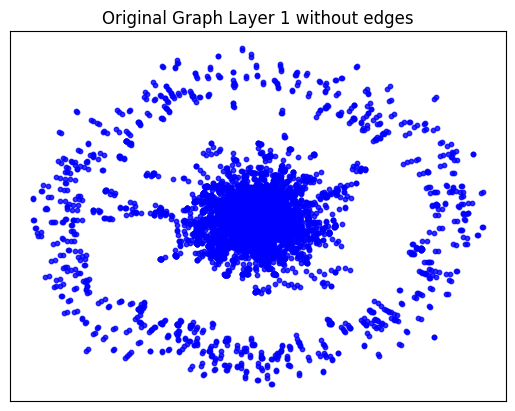

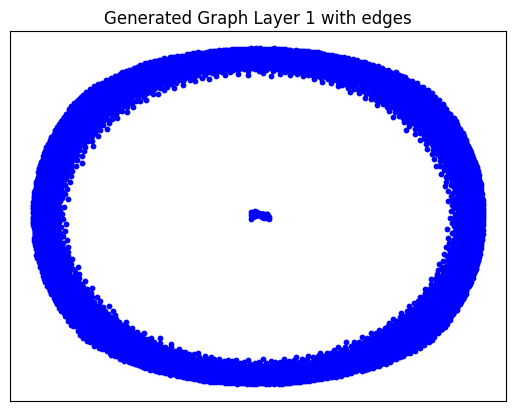

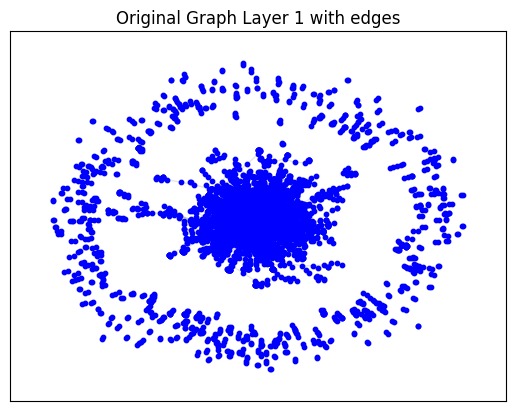

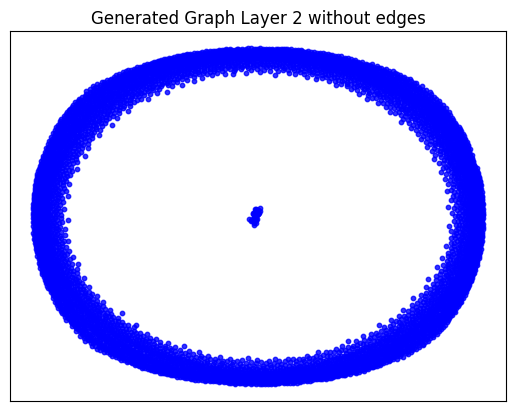

...

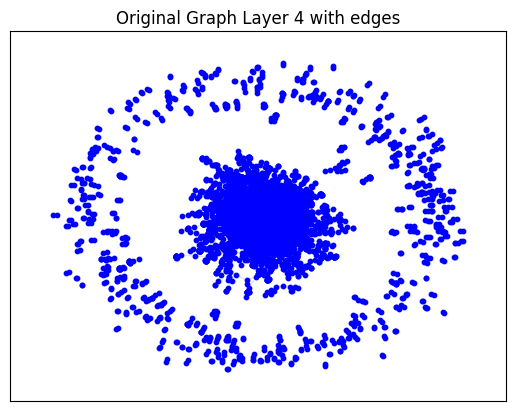

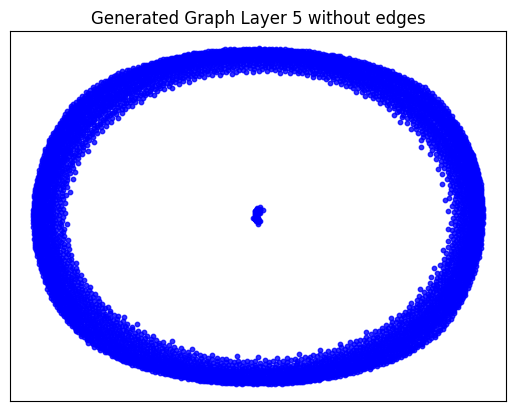

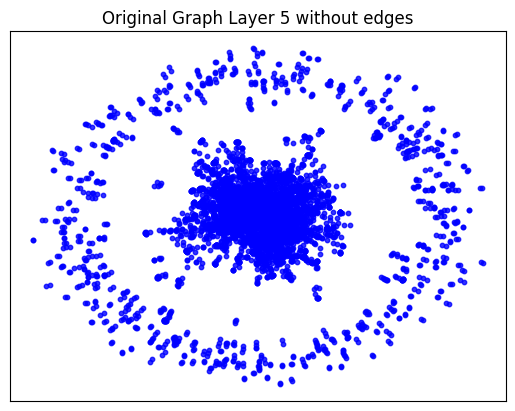

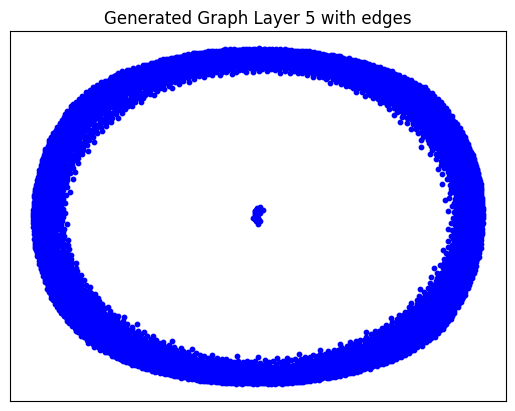

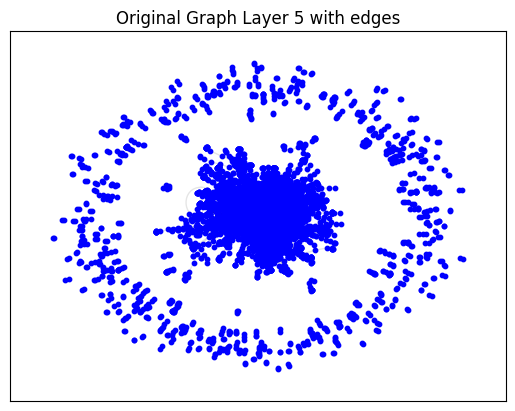

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_6.
Epoch 0 - Cost: 1.727773904800415, Accuracy: 0.5000762939453125
Epoch 1 - Cost: 1.732248306274414, Accuracy: 0.49996381998062134
Epoch 2 - Cost: 1.6844919919967651, Accuracy: 0.5000409483909607
Epoch 3 - Cost: 1.6436169147491455, Accuracy: 0.49987709522247314
Epoch 4 - Cost: 1.6485681533813477, Accuracy: 0.49990272521972656
Epoch 5 - Cost: 1.597564697265625, Accuracy: 0.4998263418674469
Epoch 6 - Cost: 1.5567924976348877, Accuracy: 0.4996879994869232
Epoch 7 - Cost: 1.5364995002746582, Accuracy: 0.4995632767677307
Epoch 8 - Cost: 1.4835282564163208, Accuracy: 0.49905431270599365
Epoch 9 - Cost: 1.43929123878479, Accuracy: 0.4991607069969177
Epoch 10 - Cost: 1.4189958572387695, Accuracy: 0.4980679452419281
Epoch 11 - Cost: 1.3333139419555664, Accuracy: 0.4981135129928589
Epoch 12 - Cost: 1.286880373954773, Accuracy: 0.49612706899642944
Epoch 13 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14389538764953613 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04854106903076172 seconds to compute degree_assortativity_coefficient ---
--- 0.6528980731964111 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 213, 'd_min': 0, 'd': 1.2435165552112217, 'LCC': 1137, 'wedge_count': 166372.0, 'claw_count': 5584543.0, 'triangle_count': 12558, 'power_law_exp': 2.1174001478271327, 'gini': 0.9435185063161888, 'rel_edge_distr_entropy': 0.6811824523738966, 'assortativity': -0.3022352976606617, 'clustering_coefficient': 0.006746120497236748, 'n_components': 4983}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.08344669875857004
KL divergence between original network and the network generated by Random E-R: 5.244692569698702
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.0053065317974914
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.908720864368488
KL divergence between original network and the network generated by Random E-R: 12.89075313398142
KL divergence between original network and the network generated by Random B-A: 1.989259960936089
KL divergence between original network and the network generated by GAE: 40.60205574883215


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Seventh batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_7.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_7'
args.filename = 'pubmed_7_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_7'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 8.1555
Epoch: [ 2] time: 8.2101
Epoch: [ 3] time: 8.2591
Epoch: [ 4] time: 8.3086
Epoch: [ 5] time: 8.3581
Epoch: [ 6] time: 8.4063
Epoch: [ 7] time: 8.4610
Epoch: [ 8] time: 8.5087
Epoch: [ 9] time: 8.5603
Epoch: [10] time: 8.6095
Epoch: [11] time: 8.6586
Epoch: [12] time: 8.7078
Epoch: [13] time: 8.7565
Epoch: [14] time: 8.8074
Epoch: [15] time: 8.8553
Epoch: [16] time: 8.9042
Epoch: [17] time: 8.9522
Epoch: [18] time: 9.0008
Epoch: [19] time: 9.0506
Epoch: [20] time: 9.1043
Epoch: [21] time: 9.1530
Epoch: [22] time: 9.2015
Epoch: [23] time: 9.2500
Epoch: [24] time: 9.3007
Epoch: [25] time: 9.3493
Epoch: [26] time: 9.3985
Epoch: [27] time: 9.4469
Epoch: [28] time: 9.4977
Epoch: [29] time: 9.5472
Epoch: [30] time: 9.5995
Epoch: [31] time: 9.6485
Epoch: [32] time: 9.7005
Epoch: [33] time: 9.7498
Epoch: [34] time: 9.7998
Epoch: [35] time: 9.8486
Epoch: [36] time: 9.8965
Epoch: [37] time: 9.9448
Epoch: [38] time: 9.9972
Epoch: [39] time: 10.047

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5713, 64])
Shape of h_subset: torch.Size([5, 64])
Shape of idx: torch.Size([5])
Shape of new_h before assignment: torch.Size([5713, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([5713, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.026305437088012695 seconds to compute statistics_degrees ---
--- 1.1252565383911133 seconds to compute statistics_LCC ---
--- 0.035646677017211914 seconds to compute statistics_wedge_count ---
--- 0.03736448287963867 seconds to compute statistics_claw_count ---
--- 0.2081437110900879 seconds to compute statistics_triangle_count ---
--- 0.027148723602294922 seconds to compute statistics_power_law_alpha ---
--- 0.026895523071289062 seconds to compute statistics_gini ---
--- 0.1290891170501709 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05417633056640625

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.56003737449646 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 141.0, 'd_min': 0.0, 'd': 2.40049, 'LCC': 389, 'wedge_count': 358349.0, 'claw_count': 7097680.0, 'triangle_count': 165116, 'power_law_exp': 1.3223522434769202, 'gini': 0.9591087628667159, 'rel_edge_distr_entropy': 0.6544580821556506, 'assortativity': 0.24422060764629386, 'clustering_coefficient': 0.06979012860540346, 'n_components': 5325}


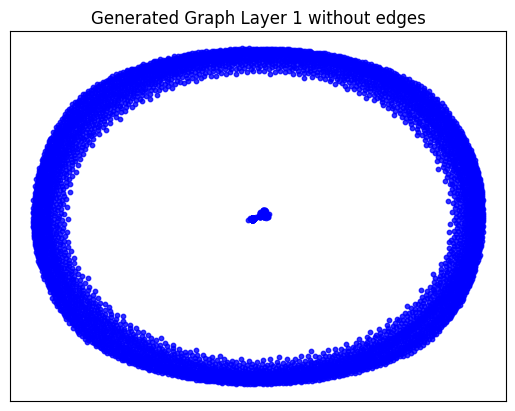

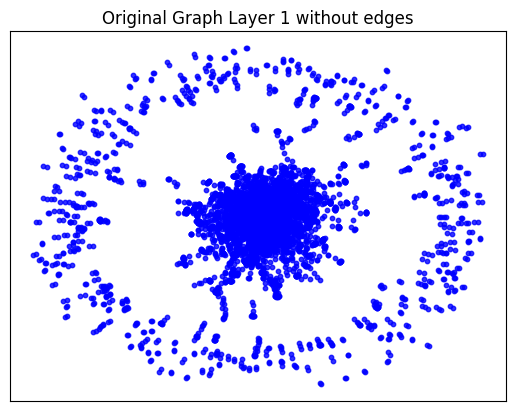

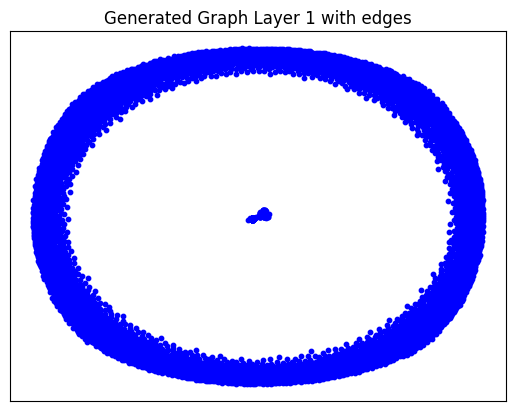

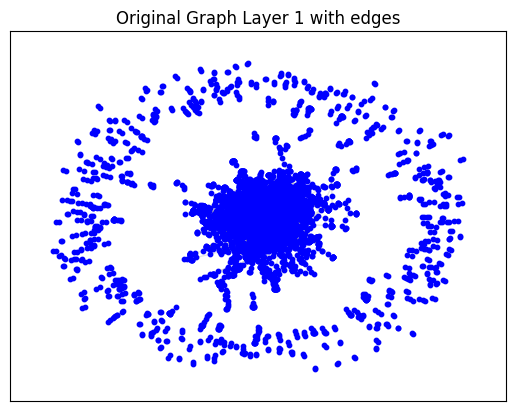

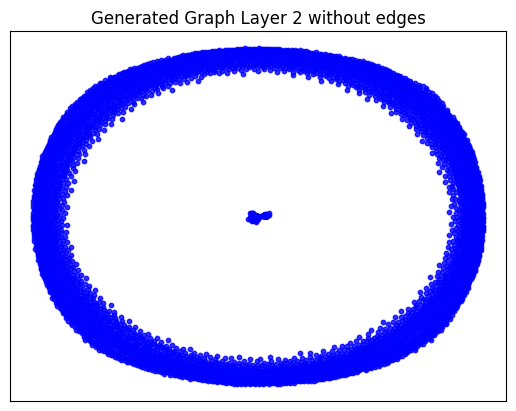

...

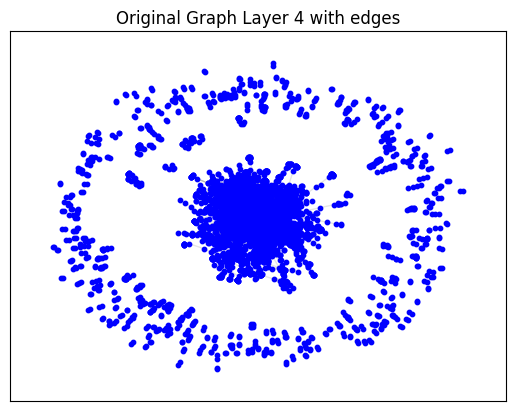

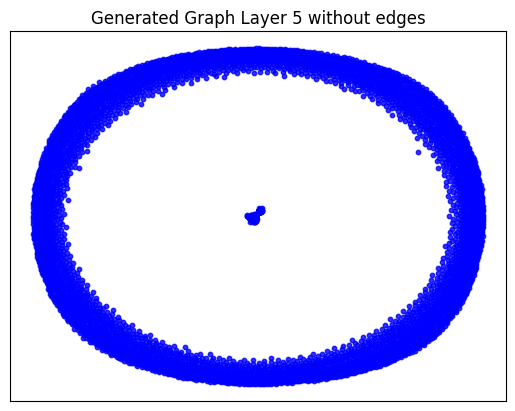

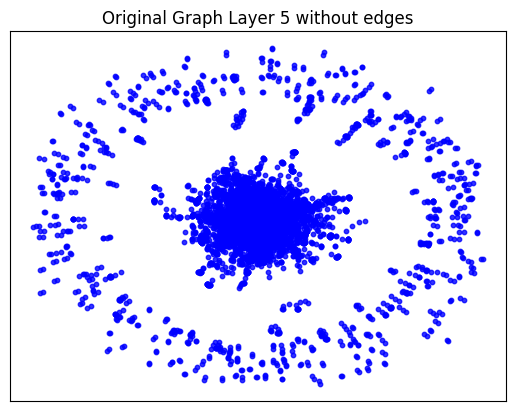

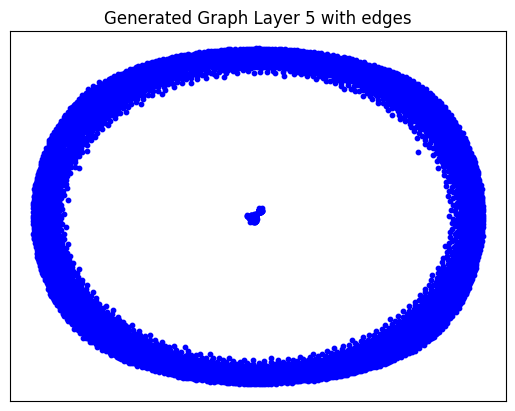

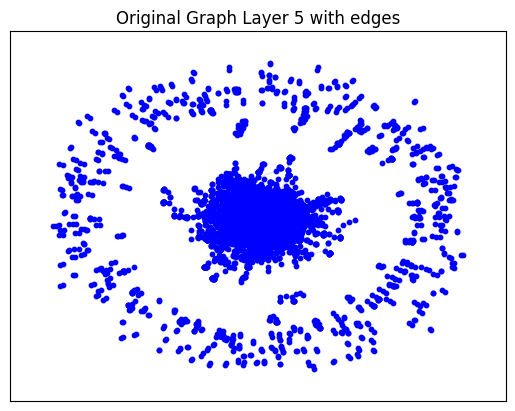

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_7.
Epoch 0 - Cost: 1.7273919582366943, Accuracy: 0.5000500679016113
Epoch 1 - Cost: 1.6819136142730713, Accuracy: 0.49994707107543945
Epoch 2 - Cost: 1.7130091190338135, Accuracy: 0.5000595450401306
Epoch 3 - Cost: 1.6693021059036255, Accuracy: 0.5000038743019104
Epoch 4 - Cost: 1.6077769994735718, Accuracy: 0.4996429979801178
Epoch 5 - Cost: 1.604723572731018, Accuracy: 0.500022828578949
Epoch 6 - Cost: 1.6033564805984497, Accuracy: 0.49930742383003235
Epoch 7 - Cost: 1.5711759328842163, Accuracy: 0.4997841417789459
Epoch 8 - Cost: 1.5358291864395142, Accuracy: 0.4990457594394684
Epoch 9 - Cost: 1.5254830121994019, Accuracy: 0.4993593096733093
Epoch 10 - Cost: 1.46651029586792, Accuracy: 0.4988129138946533
Epoch 11 - Cost: 1.4152292013168335, Accuracy: 0.4974738657474518
Epoch 12 - Cost: 1.3895617723464966, Accuracy: 0.49764519929885864
Epoch 13 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04723501205444336 seconds to compute degree_assortativity_coefficient ---
--- 0.5414230823516846 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 308, 'd_min': 0, 'd': 1.23871193559678, 'LCC': 1288, 'wedge_count': 190217.0, 'claw_count': 11877200.0, 'triangle_count': 5644, 'power_law_exp': 2.183322304721528, 'gini': 0.92594894650073, 'rel_edge_distr_entropy': 0.6967572736641406, 'assortativity': -0.28894210634208795, 'clustering_coefficient': 0.0014255885225474018, 'n_components': 4426}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.06385713061658456
KL divergence between original network and the network generated by Random E-R: 5.746688112235762
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.11037236283536893
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.466762959292441
KL divergence between original network and the network generated by Random E-R: 35.19413240541474
KL divergence between original network and the network generated by Random B-A: 2.024717110210829
KL divergence between original network and the network generated by GAE: 26.598309032488572


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Eighth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_8.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_8'
args.filename = 'pubmed_8_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_8'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 8.7989
Epoch: [ 2] time: 8.8489
Epoch: [ 3] time: 8.9037
Epoch: [ 4] time: 8.9543
Epoch: [ 5] time: 9.0057
Epoch: [ 6] time: 9.0563
Epoch: [ 7] time: 9.1046
Epoch: [ 8] time: 9.1552
Epoch: [ 9] time: 9.2076
Epoch: [10] time: 9.2620
Epoch: [11] time: 9.3116
Epoch: [12] time: 9.3622
Epoch: [13] time: 9.4129
Epoch: [14] time: 9.4654
Epoch: [15] time: 9.5161
Epoch: [16] time: 9.5658
Epoch: [17] time: 9.6186
Epoch: [18] time: 9.6678
Epoch: [19] time: 9.7210
Epoch: [20] time: 9.7735
Epoch: [21] time: 9.8235
Epoch: [22] time: 9.8726
Epoch: [23] time: 9.9254
Epoch: [24] time: 9.9764
Epoch: [25] time: 10.0308
Epoch: [26] time: 10.0839
Epoch: [27] time: 10.1362
Epoch: [28] time: 10.1891
Epoch: [29] time: 10.2452
Epoch: [30] time: 10.2953
Epoch: [31] time: 10.3493
Epoch: [32] time: 10.3990
Epoch: [33] time: 10.4514
Epoch: [34] time: 10.5052
Epoch: [35] time: 10.5600
Epoch: [36] time: 10.6120
Epoch: [37] time: 10.6627
Epoch: [38] time: 10.7162
Epoch: [39

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6065, 64])
Shape of h_subset: torch.Size([5, 64])
Shape of idx: torch.Size([5])
Shape of new_h before assignment: torch.Size([6065, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([6065, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.028380632400512695 seconds to compute statistics_degrees ---
--- 1.2215650081634521 seconds to compute statistics_LCC ---
--- 0.03932476043701172 seconds to compute statistics_wedge_count ---
--- 0.040343523025512695 seconds to compute statistics_claw_count ---
--- 0.22582650184631348 seconds to compute statistics_triangle_count ---
--- 0.02982950210571289 seconds to compute statistics_power_law_alpha ---
--- 0.030065298080444336 seconds to compute statistics_gini ---
--- 0.14223766326904297 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0545473098754882

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6312258243560791 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 85.0, 'd_min': 0.0, 'd': 2.2669415, 'LCC': 242, 'wedge_count': 332314.0, 'claw_count': 5777161.0, 'triangle_count': 140453, 'power_law_exp': 1.2951027594645388, 'gini': 0.9585065708443641, 'rel_edge_distr_entropy': 0.6548230053453853, 'assortativity': 0.5665354042842239, 'clustering_coefficient': 0.07293530507458594, 'n_components': 5680}


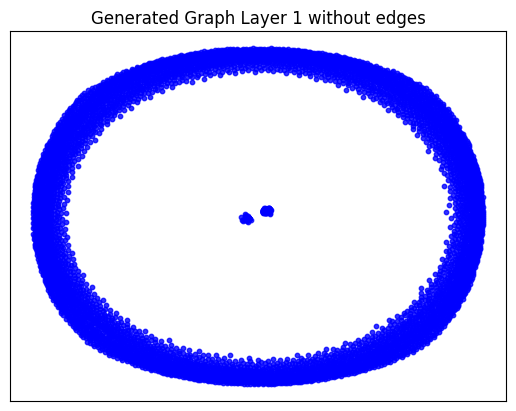

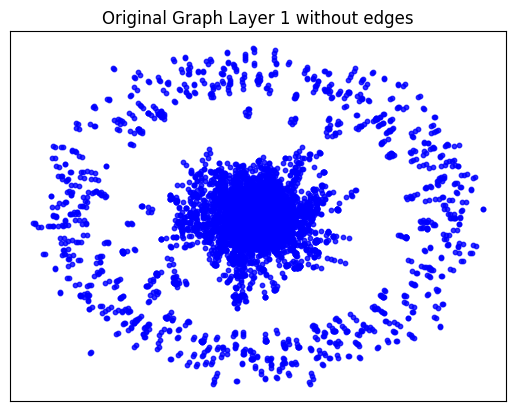

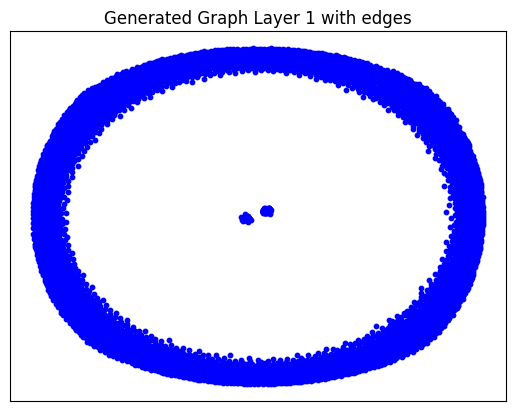

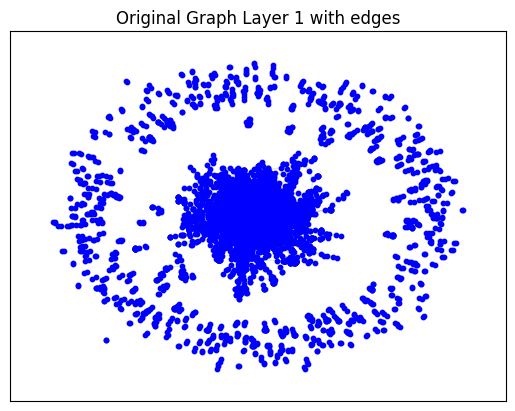

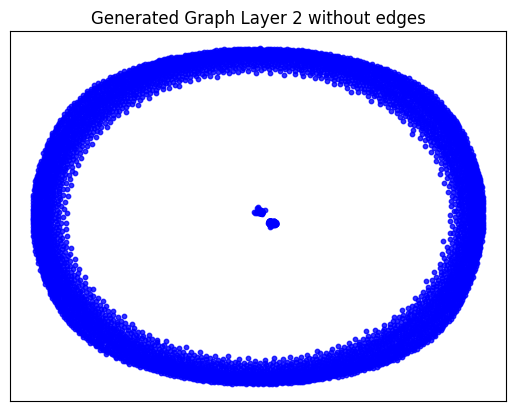

...

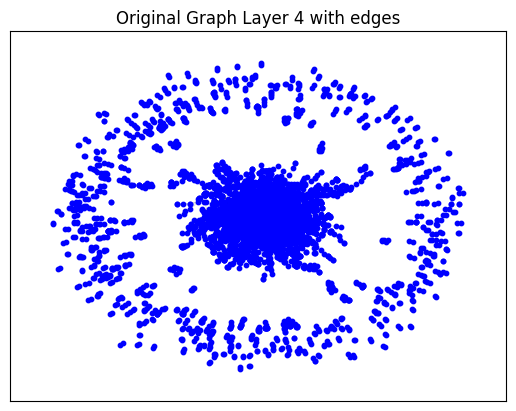

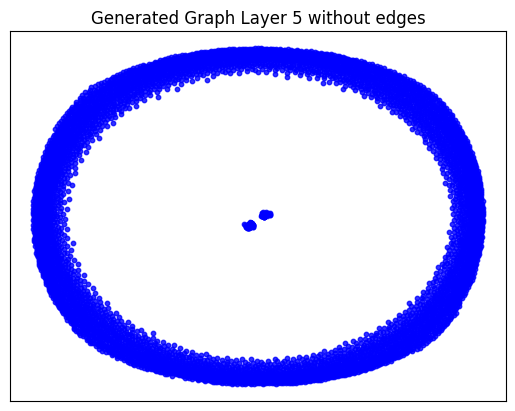

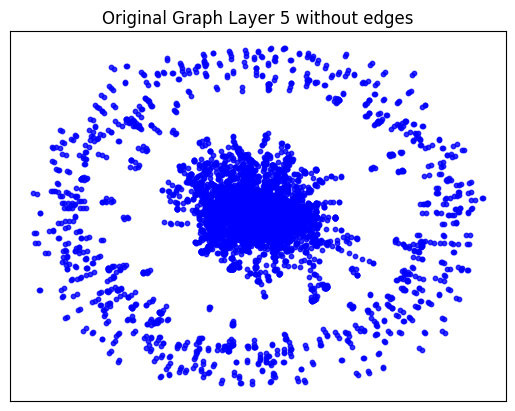

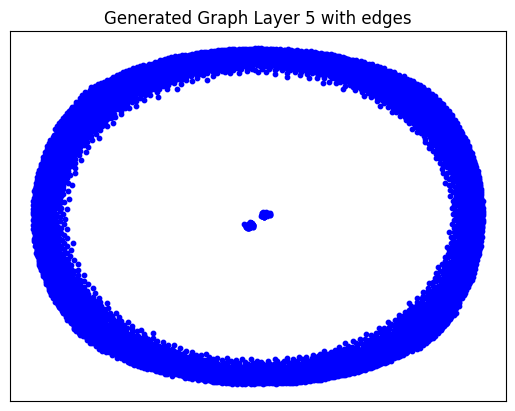

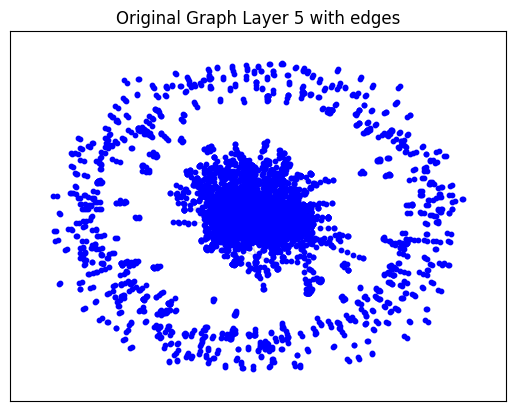

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_8.
Epoch 0 - Cost: 1.698782205581665, Accuracy: 0.4999467432498932
Epoch 1 - Cost: 1.744594693183899, Accuracy: 0.4998602569103241
Epoch 2 - Cost: 1.6768367290496826, Accuracy: 0.5000141859054565
Epoch 3 - Cost: 1.698961615562439, Accuracy: 0.49980872869491577
Epoch 4 - Cost: 1.6245073080062866, Accuracy: 0.4998493790626526
Epoch 5 - Cost: 1.6707767248153687, Accuracy: 0.4996322989463806
Epoch 6 - Cost: 1.6190146207809448, Accuracy: 0.4996962249279022
Epoch 7 - Cost: 1.6172124147415161, Accuracy: 0.4989655017852783
Epoch 8 - Cost: 1.594570517539978, Accuracy: 0.4996064305305481
Epoch 9 - Cost: 1.5372238159179688, Accuracy: 0.49959903955459595
Epoch 10 - Cost: 1.5130083560943604, Accuracy: 0.49921736121177673
Epoch 11 - Cost: 1.4392530918121338, Accuracy: 0.4982700049877167
Epoch 12 - Cost: 1.4435592889785767, Accuracy: 0.49785375595092773
Epoch 13 - Cost: 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14244771003723145 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04681038856506348 seconds to compute degree_assortativity_coefficient ---
--- 0.6410324573516846 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 210, 'd_min': 0, 'd': 1.1795252225519288, 'LCC': 1343, 'wedge_count': 126517.0, 'claw_count': 4081849.0, 'triangle_count': 5488, 'power_law_exp': 2.2926163039399503, 'gini': 0.9285650299535302, 'rel_edge_distr_entropy': 0.7052797274713526, 'assortativity': -0.3331337482610322, 'clustering_coefficient': 0.004033466206123744, 'n_components': 4719}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.9998930350933525
KL divergence between original network and the network generated by Random E-R: 5.986924951622823
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 7.720157277070324e-05
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.3730512820334164
KL divergence between original network and the network generated by Random E-R: 10.13321863992481
KL divergence between original network and the network generated by Random B-A: 1.9440532069083967
KL divergence between original network and the network generated by GAE: 29.78798280613715


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Ninth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_9.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_9'
args.filename = 'pubmed_9_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_9'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.5772
Epoch: [ 2] time: 7.6305
Epoch: [ 3] time: 7.6805
Epoch: [ 4] time: 7.7344
Epoch: [ 5] time: 7.7851
Epoch: [ 6] time: 7.8352
Epoch: [ 7] time: 7.8874
Epoch: [ 8] time: 7.9413
Epoch: [ 9] time: 7.9916
Epoch: [10] time: 8.0482
Epoch: [11] time: 8.1040
Epoch: [12] time: 8.1581
Epoch: [13] time: 8.2109
Epoch: [14] time: 8.2641
Epoch: [15] time: 8.3174
Epoch: [16] time: 8.3682
Epoch: [17] time: 8.4206
Epoch: [18] time: 8.4752
Epoch: [19] time: 8.5342
Epoch: [20] time: 8.5896
Epoch: [21] time: 8.6415
Epoch: [22] time: 8.7001
Epoch: [23] time: 8.7564
Epoch: [24] time: 8.8172
Epoch: [25] time: 8.8745
Epoch: [26] time: 8.9256
Epoch: [27] time: 8.9801
Epoch: [28] time: 9.0320
Epoch: [29] time: 9.0864
Epoch: [30] time: 9.1449
Epoch: [31] time: 9.1948
Epoch: [32] time: 9.2459
Epoch: [33] time: 9.2983
Epoch: [34] time: 9.3512
Epoch: [35] time: 9.4011
Epoch: [36] time: 9.4547
Epoch: [37] time: 9.5090
Epoch: [38] time: 9.5631
Epoch: [39] time: 9.6187

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5935, 64])
Shape of h_subset: torch.Size([5, 64])
Shape of idx: torch.Size([5])
Shape of new_h before assignment: torch.Size([5935, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([5935, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.0279386043548584 seconds to compute statistics_degrees ---
--- 1.2419579029083252 seconds to compute statistics_LCC ---
--- 0.0397028923034668 seconds to compute statistics_wedge_count ---
--- 0.04051089286804199 seconds to compute statistics_claw_count ---
--- 0.21816635131835938 seconds to compute statistics_triangle_count ---
--- 0.030279874801635742 seconds to compute statistics_power_law_alpha ---
--- 0.030607223510742188 seconds to compute statistics_gini ---
--- 0.13998866081237793 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05545830726623535 s

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6325511932373047 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 128.0, 'd_min': 0.0, 'd': 2.3189554, 'LCC': 381, 'wedge_count': 391654.0, 'claw_count': 8395788.0, 'triangle_count': 170567, 'power_law_exp': 1.315203737682184, 'gini': 0.9638311723170698, 'rel_edge_distr_entropy': 0.6417631253692494, 'assortativity': 0.5667808557474772, 'clustering_coefficient': 0.06094734645515108, 'n_components': 5555}


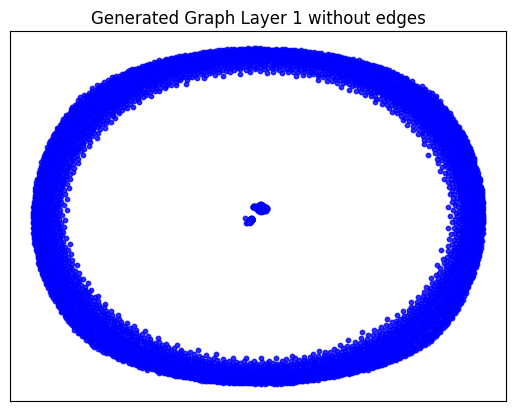

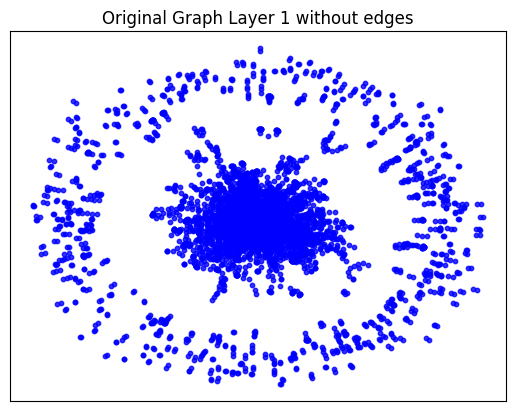

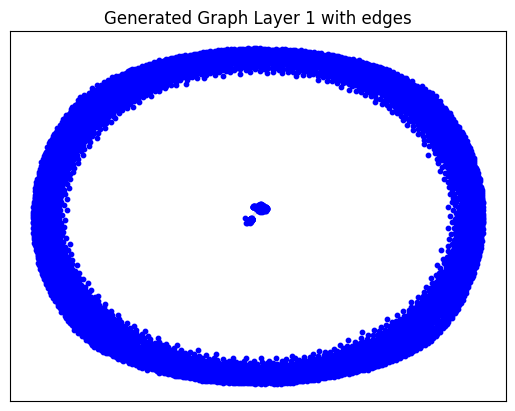

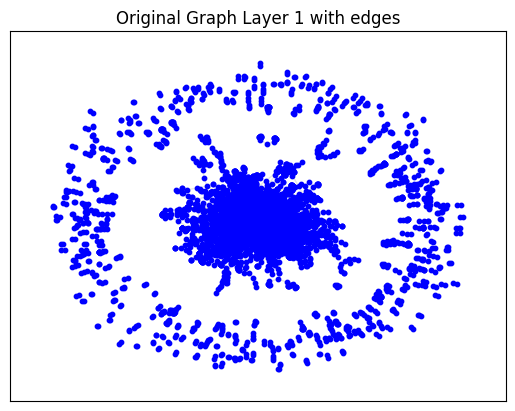

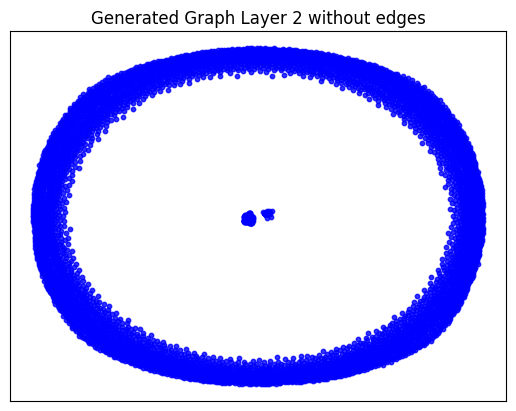

...

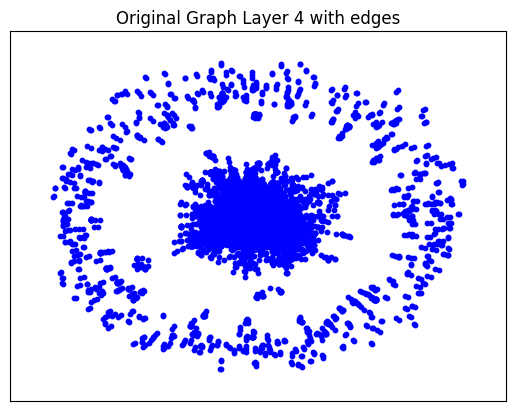

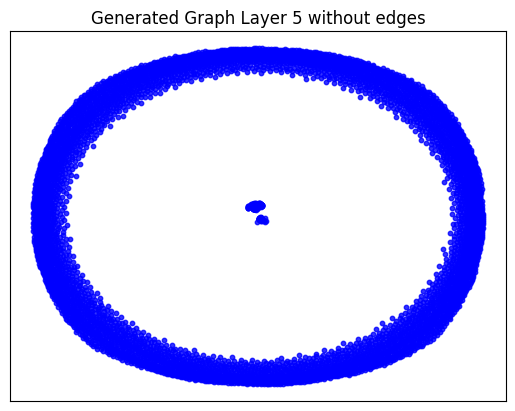

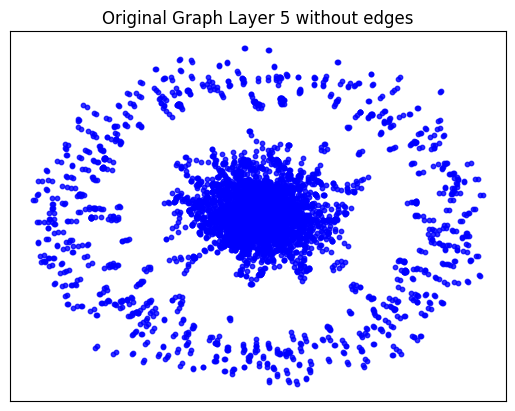

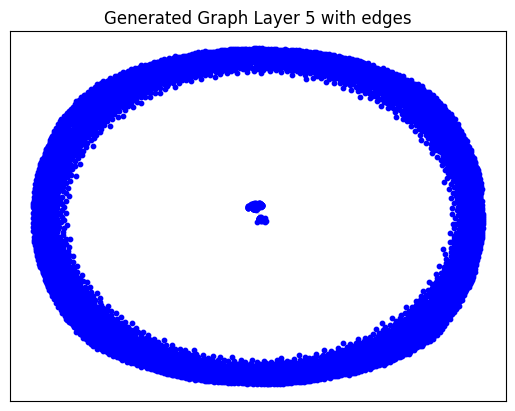

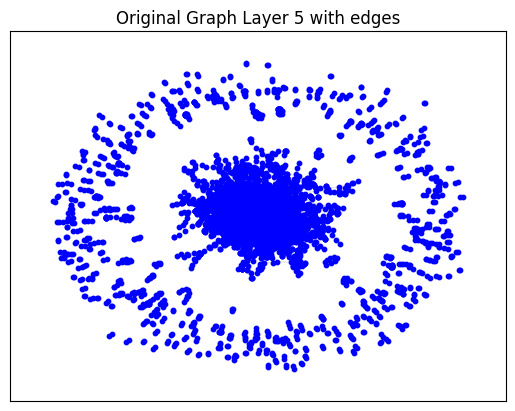

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_9.
Epoch 0 - Cost: 1.7323089838027954, Accuracy: 0.49989500641822815
Epoch 1 - Cost: 1.7466896772384644, Accuracy: 0.5000707507133484
Epoch 2 - Cost: 1.6913998126983643, Accuracy: 0.4995345175266266
Epoch 3 - Cost: 1.6286259889602661, Accuracy: 0.4996434450149536
Epoch 4 - Cost: 1.6451091766357422, Accuracy: 0.4997885227203369
Epoch 5 - Cost: 1.624632716178894, Accuracy: 0.49986445903778076
Epoch 6 - Cost: 1.6181696653366089, Accuracy: 0.4997366964817047
Epoch 7 - Cost: 1.5660126209259033, Accuracy: 0.49934646487236023
Epoch 8 - Cost: 1.5435357093811035, Accuracy: 0.49881160259246826
Epoch 9 - Cost: 1.4835082292556763, Accuracy: 0.4986187517642975
Epoch 10 - Cost: 1.4334924221038818, Accuracy: 0.4973674714565277
Epoch 11 - Cost: 1.4107282161712646, Accuracy: 0.49693983793258667
Epoch 12 - Cost: 1.3574551343917847, Accuracy: 0.49497202038764954
Epoch 13 - C

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.049569129943847656 seconds to compute degree_assortativity_coefficient ---
--- 0.6400394439697266 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 214, 'd_min': 0, 'd': 1.1987870619946093, 'LCC': 1114, 'wedge_count': 165001.0, 'claw_count': 6515860.0, 'triangle_count': 7574, 'power_law_exp': 2.1007746083904886, 'gini': 0.9416364966235309, 'rel_edge_distr_entropy': 0.6801366093005464, 'assortativity': -0.38501786716960135, 'clustering_coefficient': 0.003487183579757699, 'n_components': 4820}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.17242082495385977
KL divergence between original network and the network generated by Random E-R: 5.8402868008450755
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.27652088672853
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.174985860291489
KL divergence between original network and the network generated by Random E-R: 11.692257750398777
KL divergence between original network and the network generated by Random B-A: 1.8664203187878288
KL divergence between original network and the network generated by GAE: 41.90809725280286


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

10 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_10.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_10'
args.filename = 'pubmed_10_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_10'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.7263
Epoch: [ 2] time: 7.7788
Epoch: [ 3] time: 7.8323
Epoch: [ 4] time: 7.8821
Epoch: [ 5] time: 7.9317
Epoch: [ 6] time: 7.9822
Epoch: [ 7] time: 8.0305
Epoch: [ 8] time: 8.0820
Epoch: [ 9] time: 8.1328
Epoch: [10] time: 8.1827
Epoch: [11] time: 8.2353
Epoch: [12] time: 8.2921
Epoch: [13] time: 8.3464
Epoch: [14] time: 8.3964
Epoch: [15] time: 8.4459
Epoch: [16] time: 8.4966
Epoch: [17] time: 8.5517
Epoch: [18] time: 8.5997
Epoch: [19] time: 8.6507
Epoch: [20] time: 8.6993
Epoch: [21] time: 8.7543
Epoch: [22] time: 8.8045
Epoch: [23] time: 8.8574
Epoch: [24] time: 8.9088
Epoch: [25] time: 8.9582
Epoch: [26] time: 9.0063
Epoch: [27] time: 9.0641
Epoch: [28] time: 9.1156
Epoch: [29] time: 9.1663
Epoch: [30] time: 9.2165
Epoch: [31] time: 9.2685
Epoch: [32] time: 9.3183
Epoch: [33] time: 9.3690
Epoch: [34] time: 9.4217
Epoch: [35] time: 9.4721
Epoch: [36] time: 9.5266
Epoch: [37] time: 9.5799
Epoch: [38] time: 9.6336
Epoch: [39] time: 9.6829

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5918, 64])
Shape of h_subset: torch.Size([5, 64])
Shape of idx: torch.Size([5])
Shape of new_h before assignment: torch.Size([5918, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([5918, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.02616262435913086 seconds to compute statistics_degrees ---
--- 1.224931001663208 seconds to compute statistics_LCC ---
--- 0.03699803352355957 seconds to compute statistics_wedge_count ---
--- 0.038294315338134766 seconds to compute statistics_claw_count ---
--- 0.21751832962036133 seconds to compute statistics_triangle_count ---
--- 0.027751922607421875 seconds to compute statistics_power_law_alpha ---
--- 0.027962684631347656 seconds to compute statistics_gini ---
--- 0.13260698318481445 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05648040771484375

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.731191873550415 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 126.0, 'd_min': 0.0, 'd': 2.3144643, 'LCC': 227, 'wedge_count': 486424.0, 'claw_count': 12633963.0, 'triangle_count': 211169, 'power_law_exp': 1.253040752901333, 'gini': 0.9707908128867266, 'rel_edge_distr_entropy': 0.6122833453916302, 'assortativity': -0.0462353772449288, 'clustering_coefficient': 0.050143173602772144, 'n_components': 5690}


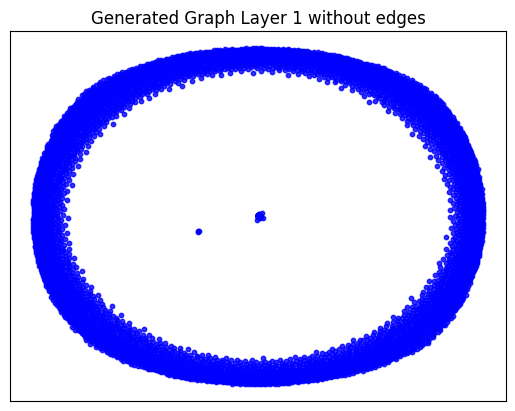

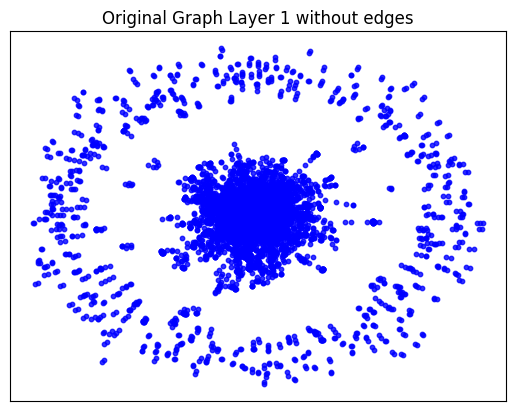

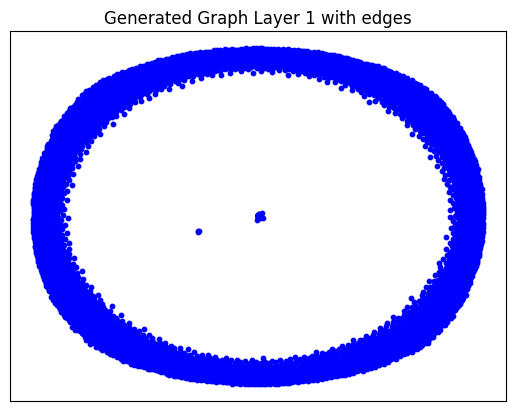

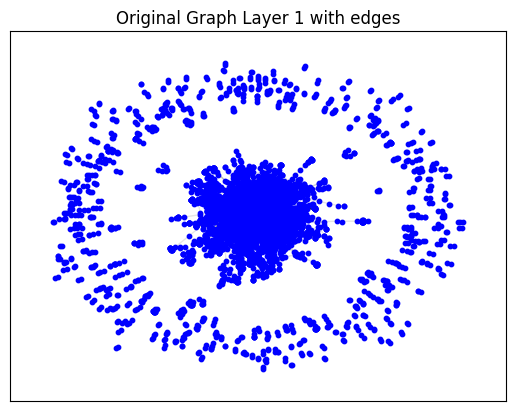

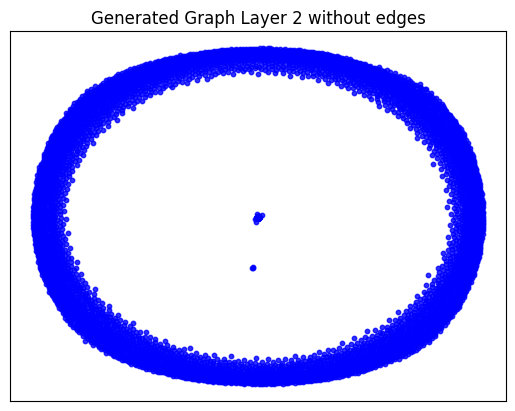

...

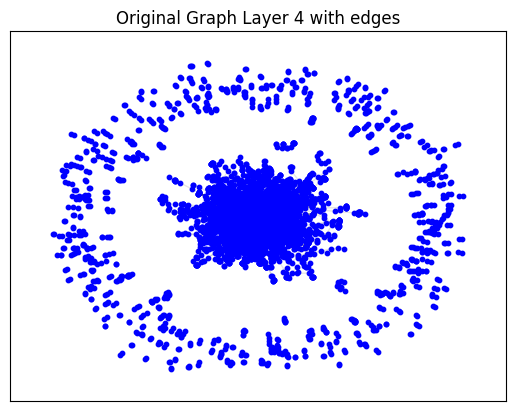

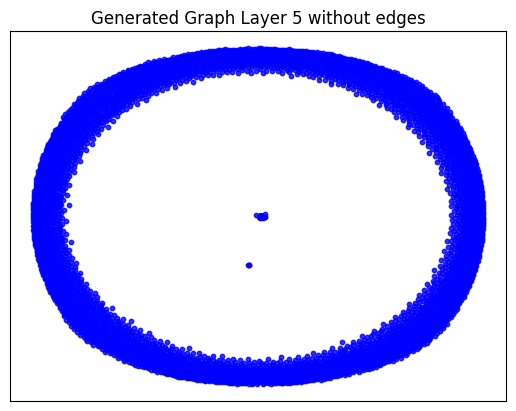

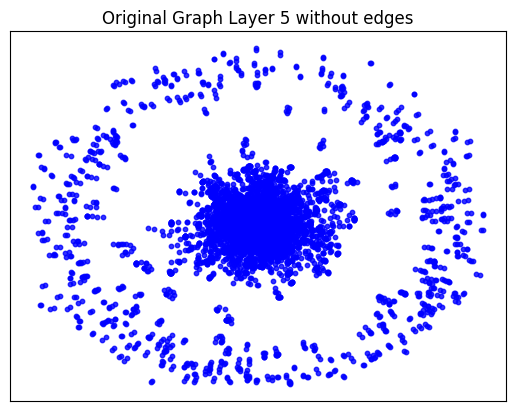

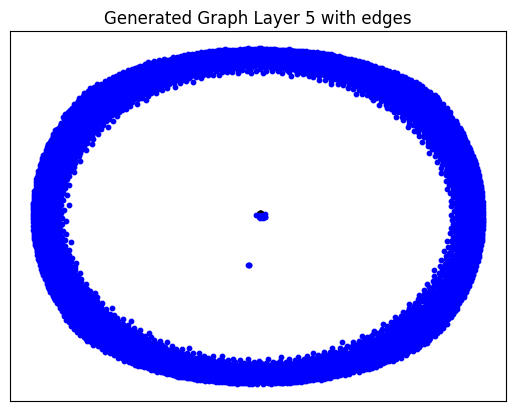

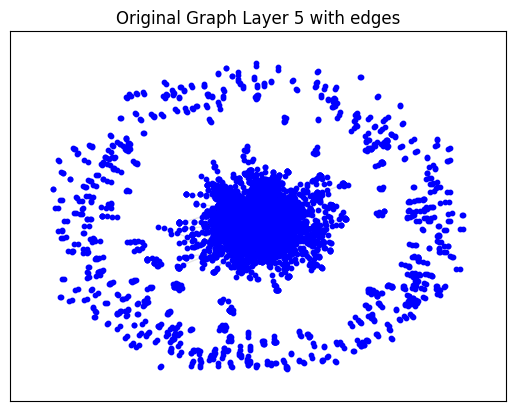

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_10.
Epoch 0 - Cost: 1.6992416381835938, Accuracy: 0.5001723766326904
Epoch 1 - Cost: 1.6656787395477295, Accuracy: 0.49966925382614136
Epoch 2 - Cost: 1.7396862506866455, Accuracy: 0.499725878238678
Epoch 3 - Cost: 1.6651555299758911, Accuracy: 0.5000041127204895
Epoch 4 - Cost: 1.6644480228424072, Accuracy: 0.49978169798851013
Epoch 5 - Cost: 1.665631890296936, Accuracy: 0.4997907280921936
Epoch 6 - Cost: 1.6140347719192505, Accuracy: 0.49995365738868713
Epoch 7 - Cost: 1.6217010021209717, Accuracy: 0.4997572600841522
Epoch 8 - Cost: 1.565403938293457, Accuracy: 0.4997656047344208
Epoch 9 - Cost: 1.5269454717636108, Accuracy: 0.4987635016441345
Epoch 10 - Cost: 1.4761627912521362, Accuracy: 0.4988671839237213
Epoch 11 - Cost: 1.4209487438201904, Accuracy: 0.4988526701927185
Epoch 12 - Cost: 1.3912755250930786, Accuracy: 0.49840259552001953
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.048716068267822266 seconds to compute degree_assortativity_coefficient ---
--- 0.5881838798522949 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 160, 'd_min': 0, 'd': 1.2025680013515796, 'LCC': 940, 'wedge_count': 119025.0, 'claw_count': 2803702.0, 'triangle_count': 8989, 'power_law_exp': 1.9413793251152414, 'gini': 0.9464436085524914, 'rel_edge_distr_entropy': 0.6855144784292262, 'assortativity': -0.251869896313599, 'clustering_coefficient': 0.009618354589753119, 'n_components': 4957}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.3989383222051541
KL divergence between original network and the network generated by Random E-R: 5.097179154935542
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.03037736068937
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.043016032829404
KL divergence between original network and the network generated by Random E-R: 3.6704209155631884
KL divergence between original network and the network generated by Random B-A: 1.9555673154539384
KL divergence between original network and the network generated by GAE: 38.15254975887794


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

11 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_11.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_11'
args.filename = 'pubmed_11_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_11'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.6807
Epoch: [ 2] time: 7.7345
Epoch: [ 3] time: 7.7838
Epoch: [ 4] time: 7.8358
Epoch: [ 5] time: 7.8888
Epoch: [ 6] time: 7.9392
Epoch: [ 7] time: 7.9922
Epoch: [ 8] time: 8.0421
Epoch: [ 9] time: 8.0952
Epoch: [10] time: 8.1467
Epoch: [11] time: 8.1958
Epoch: [12] time: 8.2471
Epoch: [13] time: 8.2993
Epoch: [14] time: 8.3482
Epoch: [15] time: 8.3987
Epoch: [16] time: 8.4518
Epoch: [17] time: 8.5047
Epoch: [18] time: 8.5555
Epoch: [19] time: 8.6111
Epoch: [20] time: 8.6613
Epoch: [21] time: 8.7151
Epoch: [22] time: 8.7647
Epoch: [23] time: 8.8162
Epoch: [24] time: 8.8665
Epoch: [25] time: 8.9173
Epoch: [26] time: 8.9707
Epoch: [27] time: 9.0231
Epoch: [28] time: 9.0726
Epoch: [29] time: 9.1226
Epoch: [30] time: 9.1735
Epoch: [31] time: 9.2230
Epoch: [32] time: 9.2723
Epoch: [33] time: 9.3225
Epoch: [34] time: 9.3753
Epoch: [35] time: 9.4281
Epoch: [36] time: 9.4770
Epoch: [37] time: 9.5286
Epoch: [38] time: 9.5825
Epoch: [39] time: 9.6328

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6029, 64])
Shape of h_subset: torch.Size([5, 64])
Shape of idx: torch.Size([5])
Shape of new_h before assignment: torch.Size([6029, 64])
Shape of h_subset: torch.Size([3, 64])
Shape of idx: torch.Size([3])
Shape of new_h before assignment: torch.Size([6029, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.028594493865966797 seconds to compute statistics_degrees ---
--- 1.252023696899414 seconds to compute statistics_LCC ---
--- 0.039398193359375 seconds to compute statistics_wedge_count ---
--- 0.04117894172668457 seconds to compute statistics_claw_count ---
--- 0.22481441497802734 seconds to compute statistics_triangle_count ---
--- 0.0307464599609375 seconds to compute statistics_power_law_alpha ---
--- 0.03076338768005371 seconds to compute statistics_gini ---
--- 0.1395094394683838 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05644965171813965 secon

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6886410713195801 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 116.0, 'd_min': 0.0, 'd': 2.2731795, 'LCC': 314, 'wedge_count': 388512.0, 'claw_count': 7879755.0, 'triangle_count': 167540, 'power_law_exp': 1.2934113316847577, 'gini': 0.9641711419250589, 'rel_edge_distr_entropy': 0.6366699051711235, 'assortativity': 0.45903906307970244, 'clustering_coefficient': 0.06378624716123787, 'n_components': 5716}


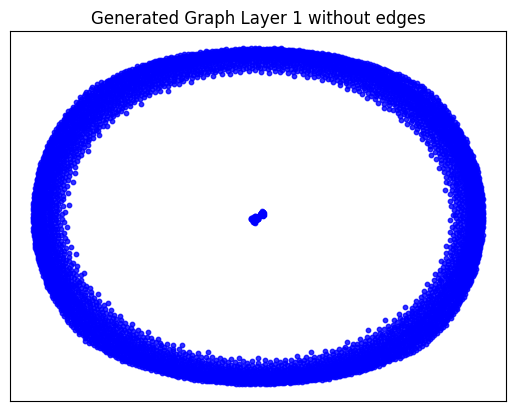

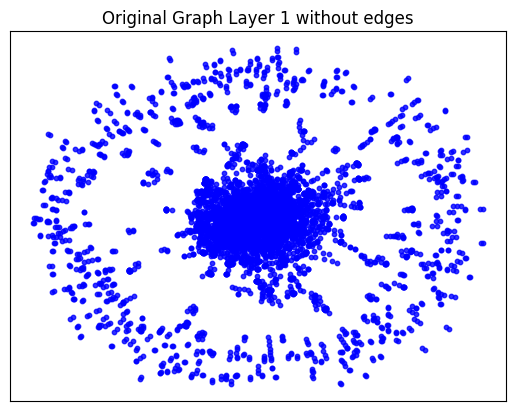

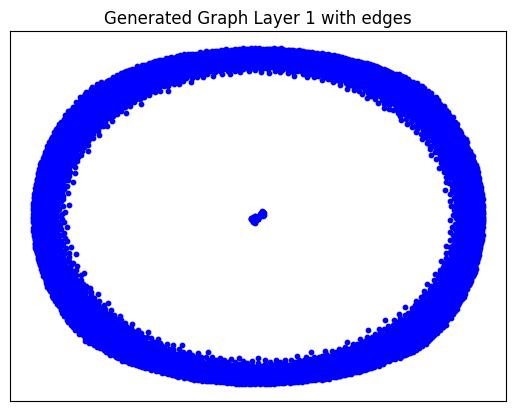

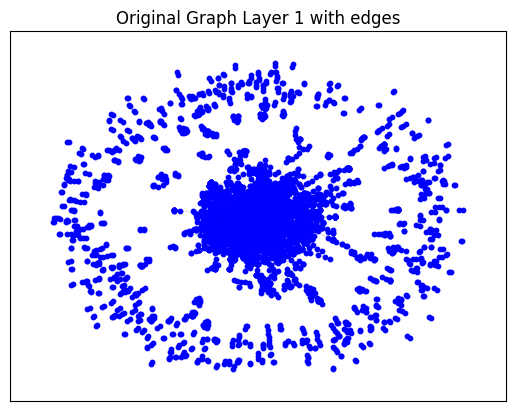

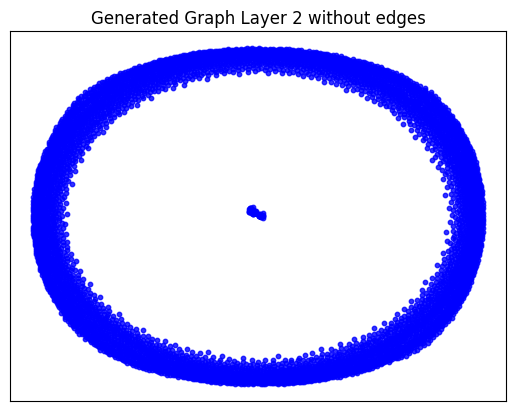

...

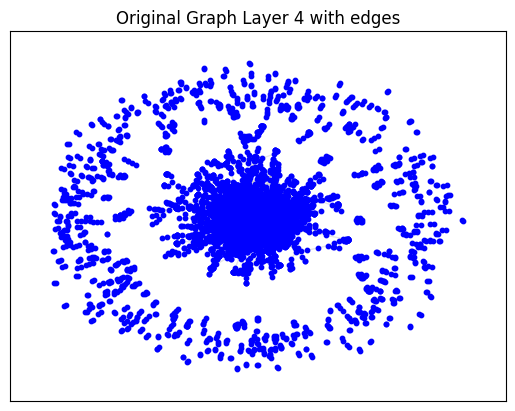

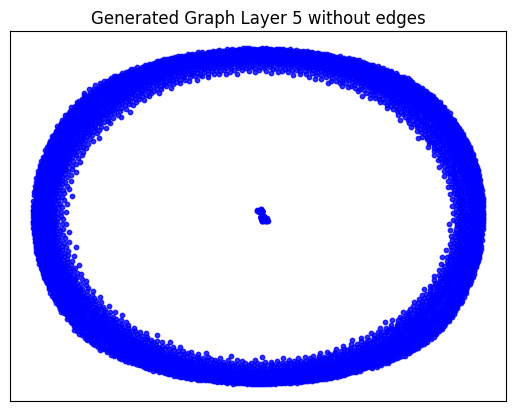

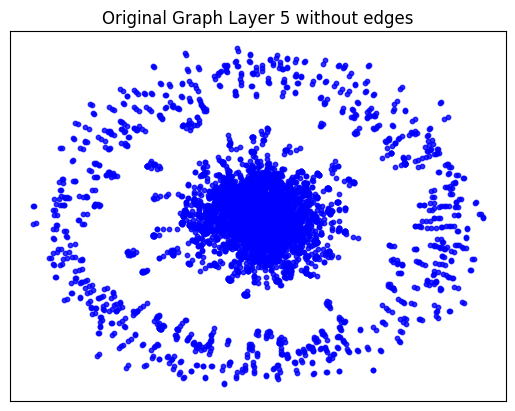

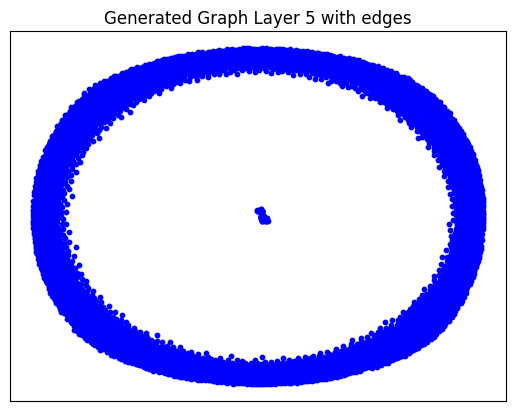

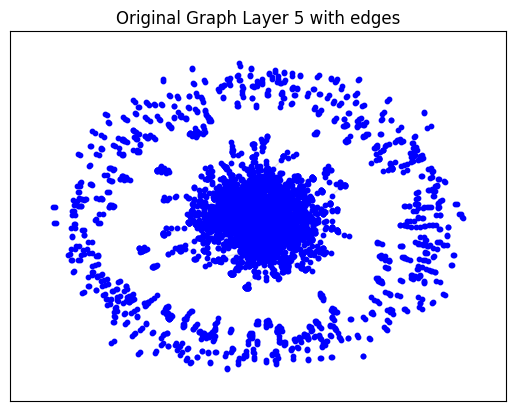

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_11.
Epoch 0 - Cost: 1.7427396774291992, Accuracy: 0.5000231862068176
Epoch 1 - Cost: 1.6861799955368042, Accuracy: 0.49972003698349
Epoch 2 - Cost: 1.728589415550232, Accuracy: 0.49996909499168396
Epoch 3 - Cost: 1.6470893621444702, Accuracy: 0.499946653842926
Epoch 4 - Cost: 1.5786253213882446, Accuracy: 0.5001099705696106
Epoch 5 - Cost: 1.6908280849456787, Accuracy: 0.49982795119285583
Epoch 6 - Cost: 1.6840331554412842, Accuracy: 0.4994751513004303
Epoch 7 - Cost: 1.6002944707870483, Accuracy: 0.4991946220397949
Epoch 8 - Cost: 1.5489524602890015, Accuracy: 0.4994601309299469
Epoch 9 - Cost: 1.513886570930481, Accuracy: 0.49956828355789185
Epoch 10 - Cost: 1.4102767705917358, Accuracy: 0.49980050325393677
Epoch 11 - Cost: 1.4077199697494507, Accuracy: 0.49993497133255005
Epoch 12 - Cost: 1.429595947265625, Accuracy: 0.499112606048584
Epoch 13 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1437835693359375 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04936099052429199 seconds to compute degree_assortativity_coefficient ---
--- 0.610022783279419 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 247, 'd_min': 0, 'd': 1.1703150912106135, 'LCC': 712, 'wedge_count': 175185.0, 'claw_count': 7148498.0, 'triangle_count': 12246, 'power_law_exp': 1.7743011079919415, 'gini': 0.9579533958378716, 'rel_edge_distr_entropy': 0.6538137463876585, 'assortativity': -0.2683244568352688, 'clustering_coefficient': 0.0051392614224694474, 'n_components': 5273}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.3028532497319242
KL divergence between original network and the network generated by Random E-R: 5.187325685711508
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 4.449477088654757
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.060416477630553
KL divergence between original network and the network generated by Random E-R: 3.939919663338859
KL divergence between original network and the network generated by Random B-A: 1.8388038898743493
KL divergence between original network and the network generated by GAE: 45.669920694575445


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

12 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_12.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_12'
args.filename = 'pubmed_12_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_12'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 9.2165
Epoch: [ 2] time: 9.2694
Epoch: [ 3] time: 9.3213
Epoch: [ 4] time: 9.3741
Epoch: [ 5] time: 9.4260
Epoch: [ 6] time: 9.4821
Epoch: [ 7] time: 9.5363
Epoch: [ 8] time: 9.5865
Epoch: [ 9] time: 9.6405
Epoch: [10] time: 9.6946
Epoch: [11] time: 9.7477
Epoch: [12] time: 9.8023
Epoch: [13] time: 9.8567
Epoch: [14] time: 9.9086
Epoch: [15] time: 9.9620
Epoch: [16] time: 10.0147
Epoch: [17] time: 10.0714
Epoch: [18] time: 10.1231
Epoch: [19] time: 10.1760
Epoch: [20] time: 10.2276
Epoch: [21] time: 10.2788
Epoch: [22] time: 10.3316
Epoch: [23] time: 10.3878
Epoch: [24] time: 10.4419
Epoch: [25] time: 10.4931
Epoch: [26] time: 10.5446
Epoch: [27] time: 10.6030
Epoch: [28] time: 10.6575
Epoch: [29] time: 10.7159
Epoch: [30] time: 10.7683
Epoch: [31] time: 10.8190
Epoch: [32] time: 10.8746
Epoch: [33] time: 10.9307
Epoch: [34] time: 10.9846
Epoch: [35] time: 11.0374
Epoch: [36] time: 11.0888
Epoch: [37] time: 11.1433
Epoch: [38] time: 11.1970
E

Testing PubMed

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([4868, 64])
Shape of h_subset: torch.Size([4, 64])
Shape of idx: torch.Size([4])
Shape of new_h before assignment: torch.Size([4868, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Shape of new_h before assignment: torch.Size([4868, 64])
Shape of h_subset: torch.Size([2, 64])
Shape of idx: torch.Size([2])
Computing metrics for original graph
--- 0.01901102066040039 seconds to compute statistics_degrees ---
--- 0.8200581073760986 seconds to compute statistics_LCC ---
--- 0.027327775955200195 seconds to compute statistics_wedge_count ---
--- 0.028626680374145508 seconds to compute statistics_claw_count ---
--- 0.15587401390075684 seconds to compute statistics_triangle_count ---
--- 0.019789695739746094 seconds to compute statistics_power_law_alpha ---
--- 0.020380496978759766 seconds to compute statistics_gini ---
--- 0.09364819526672363 seconds to compute statistics_edge_distribution_entropy ---
--- 0.044175863265991

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.40897250175476074 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 117.0, 'd_min': 0.0, 'd': 2.1657765, 'LCC': 241, 'wedge_count': 314678.0, 'claw_count': 7022187.0, 'triangle_count': 140698, 'power_law_exp': 1.2874325623658796, 'gini': 0.9677576027616606, 'rel_edge_distr_entropy': 0.6192212741141404, 'assortativity': 0.506535664196377, 'clustering_coefficient': 0.06010862427901735, 'n_components': 4628}


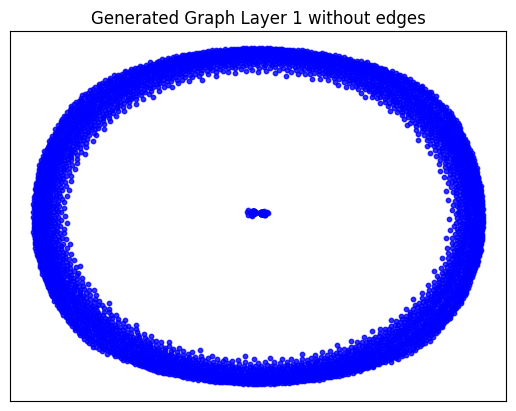

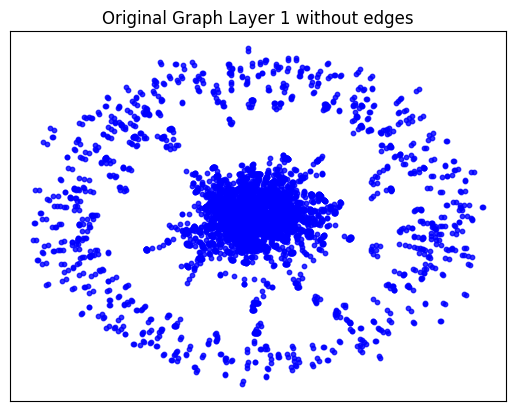

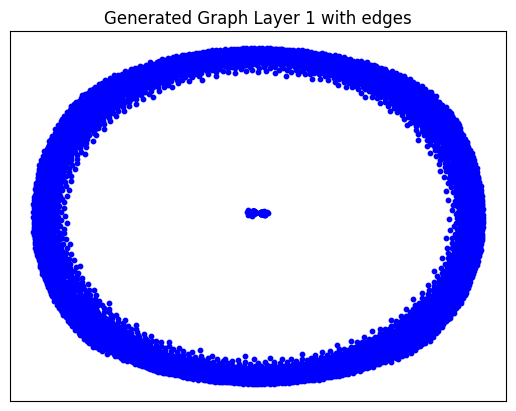

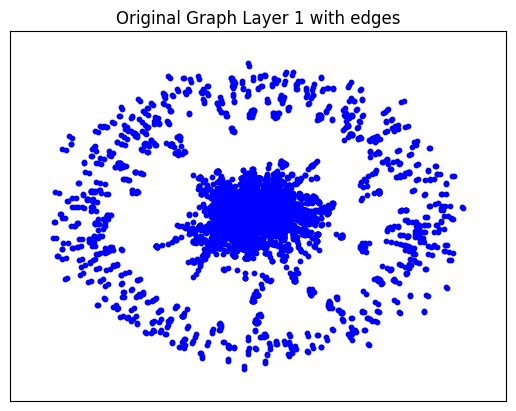

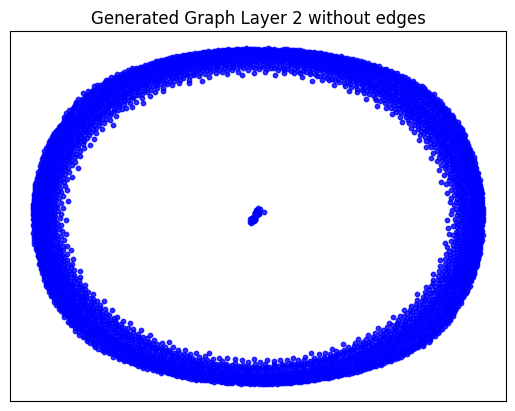

...

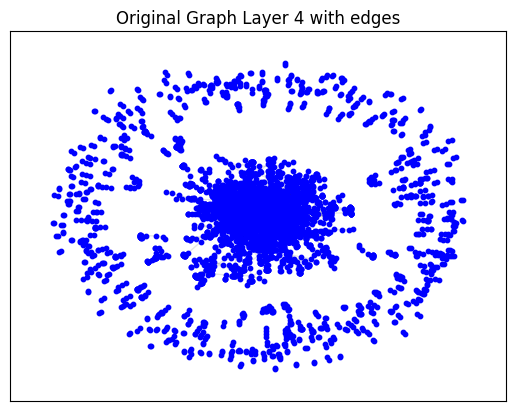

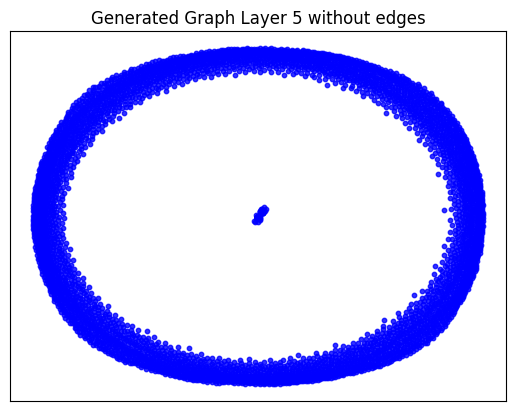

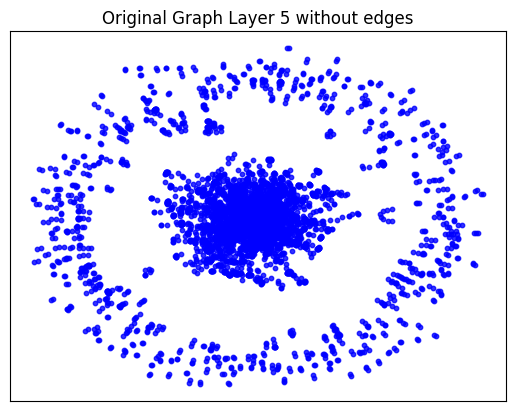

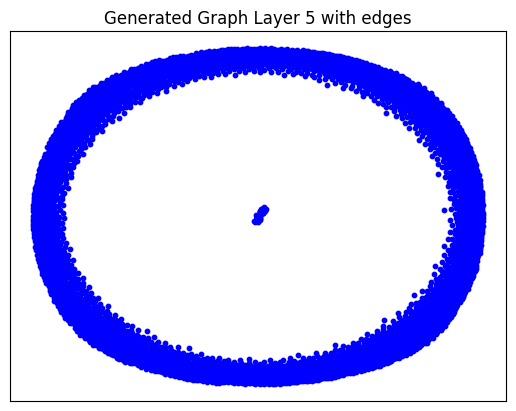

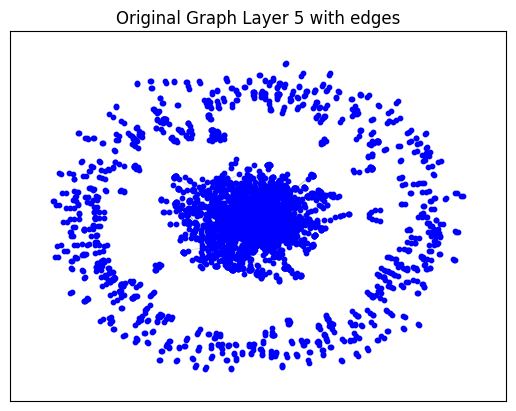

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_12.
Epoch 0 - Cost: 1.6323862075805664, Accuracy: 0.49999749660491943
Epoch 1 - Cost: 1.7204358577728271, Accuracy: 0.499910444021225
Epoch 2 - Cost: 1.7846043109893799, Accuracy: 0.49994343519210815
Epoch 3 - Cost: 1.586203694343567, Accuracy: 0.49995532631874084
Epoch 4 - Cost: 1.5545918941497803, Accuracy: 0.49975284934043884
Epoch 5 - Cost: 1.587855577468872, Accuracy: 0.4994056224822998
Epoch 6 - Cost: 1.7643771171569824, Accuracy: 0.49878057837486267
Epoch 7 - Cost: 1.6187103986740112, Accuracy: 0.49896812438964844
Epoch 8 - Cost: 1.5630614757537842, Accuracy: 0.49859750270843506
Epoch 9 - Cost: 1.401681661605835, Accuracy: 0.4982495903968811
Epoch 10 - Cost: 1.4423649311065674, Accuracy: 0.49866896867752075
Epoch 11 - Cost: 1.41158127784729, Accuracy: 0.4981253445148468
Epoch 12 - Cost: 1.485927700996399, Accuracy: 0.49796539545059204
Epoch 13 - Cos

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.021738290786743164 seconds to compute statistics_power_law_alpha ---
--- 0.021030426025390625 seconds to compute statistics_gini ---
--- 0.0966188907623291 seconds to compute statistics_edge_distribution_entropy ---
--- 0.03724026679992676 seconds to compute degree_assortativity_coefficient ---
--- 0.40438008308410645 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 112, 'd_min': 0, 'd': 1.1088519203121792, 'LCC': 251, 'wedge_count': 98077.0, 'claw_count': 1692706.0, 'triangle_count': 13984, 'power_law_exp': 1.3812906741678148, 'gini': 0.9704381865441334, 'rel_edge_distr_entropy': 0.614295551109147, 'assortativity': -0.030869497416653298, 'clustering_coefficient': 0.02478398493300077, 'n_components': 4616}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-50-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.5971887989513377
KL divergence between original network and the network generated by Random E-R: 5.934201835395659
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.02885014400739066
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.02511567570929
KL divergence between original network and the network generated by Random E-R: 3.7453241581150762
KL divergence between original network and the network generated by Random B-A: 1.765716326625144
KL divergence between original network and the network generated by GAE: 0.18594212364968696


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()